In [1]:
import pandas as pd
import numpy as np 
import warnings
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import re
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split,KFold
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,auc
from xgboost import XGBClassifier
warnings.filterwarnings('ignore')

In [2]:
path = r"C:\Users\srini\Downloads\telecom-churn-case-study-hackathon-c55\train.csv"
df = pd.read_csv(path)


In [3]:
df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [4]:
df

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.00,0.00,0.00,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.00,0.00,0.00,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.00,0.00,0.00,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.00,0.00,0.00,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.00,0.00,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,69994,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,15.760,410.924,...,1,0,NaN,1.0,1.0,221,0.00,0.00,0.00,0
69995,69995,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,160.083,289.129,...,0,0,NaN,NaN,NaN,712,0.00,0.00,0.00,0
69996,69996,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,372.088,258.374,...,0,0,NaN,NaN,NaN,879,0.00,0.00,0.00,0
69997,69997,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,238.575,245.414,...,0,0,1.0,1.0,1.0,277,664.25,1402.96,990.97,0


In [5]:
df['churn_probability'].value_counts()

0    62867
1     7132
Name: churn_probability, dtype: int64

In [6]:
df.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [7]:
df.isnull().sum().to_dict()

{'id': 0,
 'circle_id': 0,
 'loc_og_t2o_mou': 702,
 'std_og_t2o_mou': 702,
 'loc_ic_t2o_mou': 702,
 'last_date_of_month_6': 0,
 'last_date_of_month_7': 399,
 'last_date_of_month_8': 733,
 'arpu_6': 0,
 'arpu_7': 0,
 'arpu_8': 0,
 'onnet_mou_6': 2768,
 'onnet_mou_7': 2687,
 'onnet_mou_8': 3703,
 'offnet_mou_6': 2768,
 'offnet_mou_7': 2687,
 'offnet_mou_8': 3703,
 'roam_ic_mou_6': 2768,
 'roam_ic_mou_7': 2687,
 'roam_ic_mou_8': 3703,
 'roam_og_mou_6': 2768,
 'roam_og_mou_7': 2687,
 'roam_og_mou_8': 3703,
 'loc_og_t2t_mou_6': 2768,
 'loc_og_t2t_mou_7': 2687,
 'loc_og_t2t_mou_8': 3703,
 'loc_og_t2m_mou_6': 2768,
 'loc_og_t2m_mou_7': 2687,
 'loc_og_t2m_mou_8': 3703,
 'loc_og_t2f_mou_6': 2768,
 'loc_og_t2f_mou_7': 2687,
 'loc_og_t2f_mou_8': 3703,
 'loc_og_t2c_mou_6': 2768,
 'loc_og_t2c_mou_7': 2687,
 'loc_og_t2c_mou_8': 3703,
 'loc_og_mou_6': 2768,
 'loc_og_mou_7': 2687,
 'loc_og_mou_8': 3703,
 'std_og_t2t_mou_6': 2768,
 'std_og_t2t_mou_7': 2687,
 'std_og_t2t_mou_8': 3703,
 'std_og_t2m_mou_6

In [8]:
(df.isnull().sum()/len(df)).to_dict()

{'id': 0.0,
 'circle_id': 0.0,
 'loc_og_t2o_mou': 0.010028714695924227,
 'std_og_t2o_mou': 0.010028714695924227,
 'loc_ic_t2o_mou': 0.010028714695924227,
 'last_date_of_month_6': 0.0,
 'last_date_of_month_7': 0.0057000814297347106,
 'last_date_of_month_8': 0.010471578165402362,
 'arpu_6': 0.0,
 'arpu_7': 0.0,
 'arpu_8': 0.0,
 'onnet_mou_6': 0.03954342204888641,
 'onnet_mou_7': 0.038386262660895155,
 'onnet_mou_8': 0.05290075572508179,
 'offnet_mou_6': 0.03954342204888641,
 'offnet_mou_7': 0.038386262660895155,
 'offnet_mou_8': 0.05290075572508179,
 'roam_ic_mou_6': 0.03954342204888641,
 'roam_ic_mou_7': 0.038386262660895155,
 'roam_ic_mou_8': 0.05290075572508179,
 'roam_og_mou_6': 0.03954342204888641,
 'roam_og_mou_7': 0.038386262660895155,
 'roam_og_mou_8': 0.05290075572508179,
 'loc_og_t2t_mou_6': 0.03954342204888641,
 'loc_og_t2t_mou_7': 0.038386262660895155,
 'loc_og_t2t_mou_8': 0.05290075572508179,
 'loc_og_t2m_mou_6': 0.03954342204888641,
 'loc_og_t2m_mou_7': 0.038386262660895155

In [9]:
# there is only a single circle id in the dataset , reomve the column
df['circle_id'].unique()


array([109], dtype=int64)

In [10]:
df = df.drop(columns = ['circle_id'])

In [11]:
df.describe()

,id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,...,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
mean,34999.000000,0.0,0.0,0.0,283.134365,278.185912,278.858826,133.153275,133.894438,132.978257,...,0.081444,0.085487,0.916325,0.909544,0.890319,1220.639709,68.108597,65.935830,60.07674,0.101887
std,20207.115084,0.0,0.0,0.0,334.213918,344.366927,351.924315,299.963093,311.277193,311.896596,...,0.634547,0.680035,0.276907,0.286842,0.312501,952.426321,269.328659,267.899034,257.22681,0.302502
min,0.000000,0.0,0.0,0.0,-2258.709000,-1289.715000,-945.808000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.00000,0.000000
25%,17499.500000,0.0,0.0,0.0,93.581000,86.714000,84.095000,7.410000,6.675000,6.410000,...,0.000000,0.000000,1.000000,1.000000,1.000000,468.000000,0.000000,0.000000,0.00000,0.000000
50%,34999.000000,0.0,0.0,0.0,197.484000,191.588000,192.234000,34.110000,32.280000,32.100000,...,0.000000,0.000000,1.000000,1.000000,1.000000,868.000000,0.000000,0.000000,0.00000,0.000000
75%,52498.500000,0.0,0.0,0.0,370.791000,365.369500,369.909000,119.390000,115.837500,115.060000,...,0.000000,0.000000,1.000000,1.000000,1.000000,1813.000000,0.000000,0.000000,0.00000,0.000000
max,69998.000000,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,7376.710000,8157.780000,10752.560000,...,33.000000,41.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.21000,1.000000


In [12]:
# og_t2o_mou cols 
drop_og_t2o_mou = df.columns[df.columns.str.contains(r't2o_mou$')]
df = df.drop(columns = drop_og_t2o_mou)

In [13]:
df.shape

(69999, 168)

### ARPU - Average Revenue Per User

In [14]:
arpu_cols = df.columns[df.columns.str.contains(r'arpu')]
arpu_cols

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8',
       'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8'],
      dtype='object')

In [15]:
# Create total average revenue per user column , do this monthly
df['total_arpu_6'] = df['arpu_6'] + df['arpu_3g_6'].fillna(0) + df['arpu_2g_6'].fillna(0)
df['total_arpu_7'] = df['arpu_7'] + df['arpu_3g_7'].fillna(0) + df['arpu_2g_7'].fillna(0)
df['total_arpu_8'] = df['arpu_8'] + df['arpu_3g_8'].fillna(0) + df['arpu_2g_8'].fillna(0)

In [16]:
total_arpu_cols = df.columns[df.columns.str.contains(r'^total_arpu_')]
total_arpu_cols

Index(['total_arpu_6', 'total_arpu_7', 'total_arpu_8'], dtype='object')

In [17]:
df['total_arpu_monthly'] = df[total_arpu_cols].sum(axis=1) / len(total_arpu_cols)

In [18]:
total_arpu_cols = df.columns[df.columns.str.contains(r'(^total_arpu_)')]
total_arpu_cols

Index(['total_arpu_6', 'total_arpu_7', 'total_arpu_8', 'total_arpu_monthly'], dtype='object')

- It can be observed that the arpu is lower for customers who are likely to churn and customers who don't churn seem to have a higher arpu
- Another thing to be noticed as a general trend is that customers who don't churn increase or maintain their revenue over the months , while customers that churn generate lesser and lesser revenue


In [19]:
df.loc[df.churn_probability == 1,list(total_arpu_cols) + ['churn_probability']].describe()

,total_arpu_6,total_arpu_7,total_arpu_8,total_arpu_monthly,churn_probability
count,7132.000000,7132.000000,7132.000000,7132.000000,7132.0
mean,349.555656,249.781266,130.414157,243.250359,1.0
std,476.097231,396.882307,303.089382,305.142633,0.0
min,-209.465000,-158.963000,-155.236000,13.426667,1.0
25%,98.626500,15.118750,0.000000,76.208250,1.0
50%,223.320000,122.990000,10.062500,150.245833,1.0
75%,450.395750,323.724000,141.669500,292.077333,1.0
max,11505.508000,6876.324000,7004.997000,5539.699333,1.0


In [20]:
df.loc[df.churn_probability == 0,list(total_arpu_cols) + ['churn_probability']].describe()

,total_arpu_6,total_arpu_7,total_arpu_8,total_arpu_monthly,churn_probability
count,62867.000000,62867.000000,62867.000000,62867.000000,62867.0
mean,325.042789,331.127443,347.542047,334.570760,0.0
std,433.718107,457.188268,467.055121,409.873622,0.0
min,-2258.709000,-1289.715000,-945.808000,40.006667,0.0
25%,95.336000,96.480000,105.916000,116.796333,0.0
50%,206.090000,208.082000,220.686000,222.884667,0.0
75%,405.136000,409.574500,432.373000,409.175667,0.0
max,27731.088000,35145.834000,33543.624000,32140.182000,0.0


In [21]:
df['arpu_diff_7_6'] = df['total_arpu_7'] - df['total_arpu_6']
df['arpu_diff_8_7'] = df['total_arpu_8'] - df['total_arpu_7']
df['arpu_diff_8_6'] = df['total_arpu_8'] - df['total_arpu_6']

- It can be observed that customers who 

<Axes: xlabel='arpu_diff_7_6', ylabel='Density'>

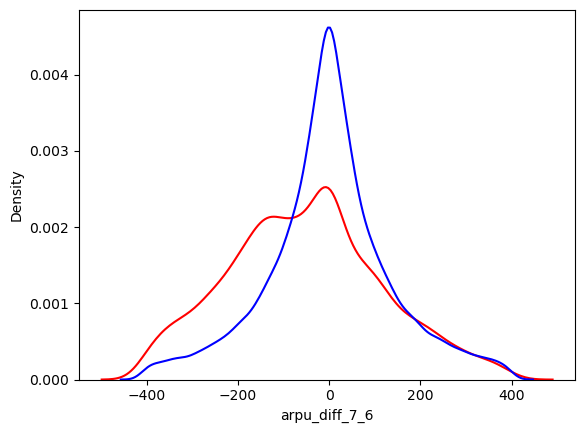

In [22]:
# fig,ax = plt.subplots()
# ax2 = ax.twinx()
# plt.plot(df['arpu_diff_7_6'],kind='dist')
df2 = df.loc[(df['arpu_diff_7_6'] > df['arpu_diff_7_6'].quantile(.05)) & (df['arpu_diff_7_6'] < df['arpu_diff_7_6'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='arpu_diff_7_6',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='arpu_diff_7_6',color='b')

<Axes: xlabel='arpu_diff_8_7', ylabel='Density'>

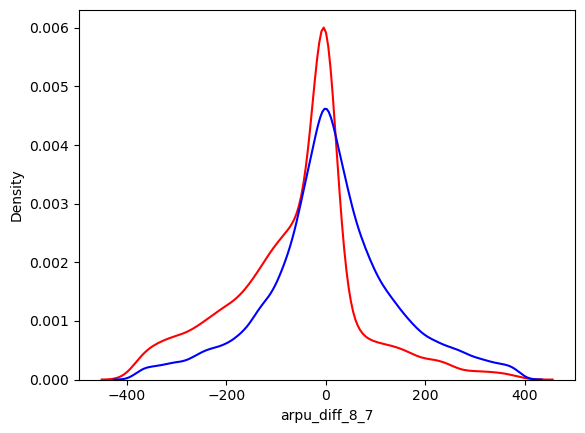

In [23]:
df2 = df.loc[(df['arpu_diff_8_7'] > df['arpu_diff_8_7'].quantile(.05)) & (df['arpu_diff_8_7'] < df['arpu_diff_8_7'].quantile(.95))]
# sns.kdeplot(data = df2[df2.churn_probability == 1],x='arpu_diff_7_6',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 1],x='arpu_diff_8_7',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='arpu_diff_8_7',color='b')

<Axes: xlabel='churn_probability', ylabel='arpu_diff_7_6'>

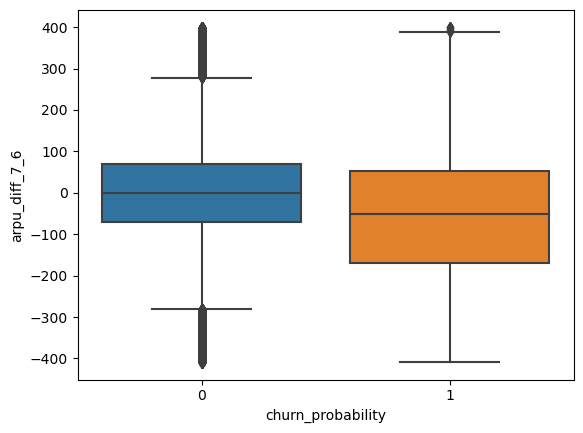

In [24]:
df2 = df.loc[(df['arpu_diff_7_6'] > df['arpu_diff_7_6'].quantile(.05)) & (df['arpu_diff_7_6'] < df['arpu_diff_7_6'].quantile(.95))]
sns.boxplot(data=df2,y='arpu_diff_7_6',x='churn_probability')

<Axes: xlabel='churn_probability', ylabel='arpu_diff_8_7'>

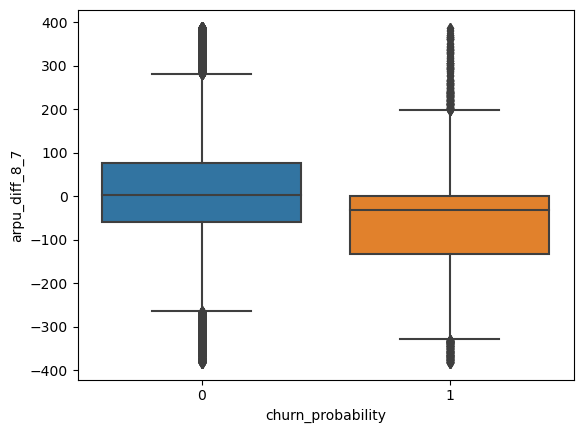

In [25]:
df2 = df.loc[(df['arpu_diff_8_7'] > df['arpu_diff_8_7'].quantile(.05)) & (df['arpu_diff_8_7'] < df['arpu_diff_8_7'].quantile(.95))]
sns.boxplot(data=df2,y='arpu_diff_8_7',x='churn_probability')

<Axes: xlabel='arpu_diff_8_6', ylabel='Density'>

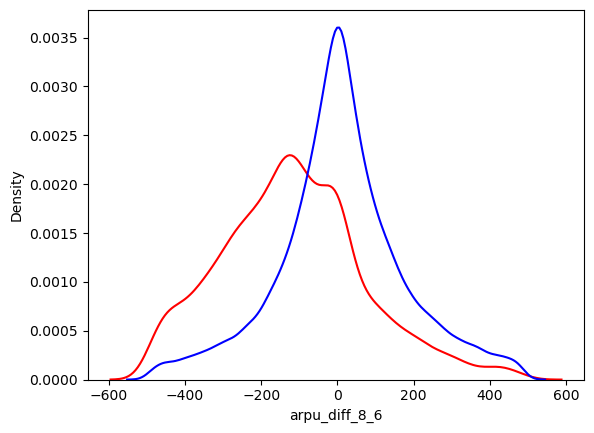

In [26]:
# fig,ax = plt.subplots()
# ax2 = ax.twinx()
# plt.plot(df['arpu_diff_8_6'],kind='dist')
df2 = df.loc[(df['arpu_diff_8_6'] > df['arpu_diff_8_6'].quantile(.05)) & (df['arpu_diff_8_6'] < df['arpu_diff_8_6'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='arpu_diff_8_6',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='arpu_diff_8_6',color='b')

<Axes: xlabel='churn_probability', ylabel='arpu_diff_8_6'>

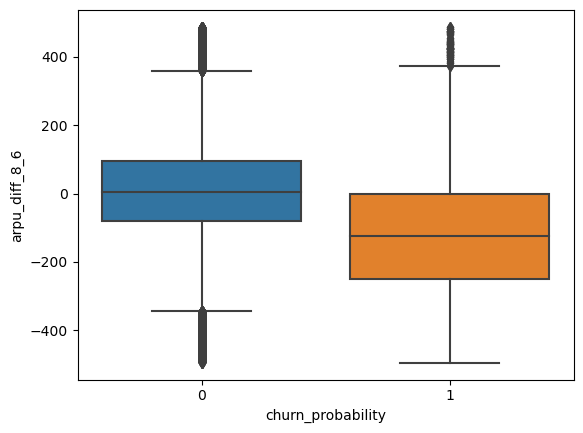

In [27]:
df2 = df.loc[(df['arpu_diff_8_6'] > df['arpu_diff_8_6'].quantile(.05)) & (df['arpu_diff_8_6'] < df['arpu_diff_8_6'].quantile(.95))]
sns.boxplot(data=df2,y='arpu_diff_8_6',x='churn_probability')

In [28]:
df[['arpu_diff_8_6','arpu_diff_8_7','arpu_diff_7_6']].corr()

,arpu_diff_8_6,arpu_diff_8_7,arpu_diff_7_6
arpu_diff_8_6,1.000000,0.566204,0.595899
arpu_diff_8_7,0.566204,1.000000,-0.324534
arpu_diff_7_6,0.595899,-0.324534,1.000000


In [29]:
df['total_revenue_per_usr'] = df[['total_arpu_6', 'total_arpu_7', 'total_arpu_8']].sum(axis=1)

- drop arpu_diff_8_6 because 8_6 and 7_6 have the least correlation

In [30]:
df['arpu_avg_7_6'] = (df['total_arpu_7'] + df['total_arpu_6']) /2 


In [31]:
df['arpu_phase_drift'] = df['total_arpu_8'] - df['arpu_avg_7_6']

<Axes: xlabel='arpu_phase_drift', ylabel='Density'>

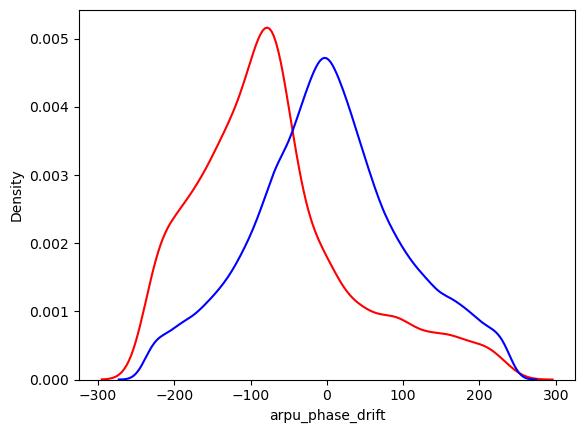

In [32]:
df2 = df.loc[(df['arpu_phase_drift'] > df['arpu_phase_drift'].quantile(.1)) & (df['arpu_phase_drift'] < df['arpu_phase_drift'].quantile(.9))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='arpu_phase_drift',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='arpu_phase_drift',color='b')

<Axes: xlabel='churn_probability', ylabel='arpu_phase_drift'>

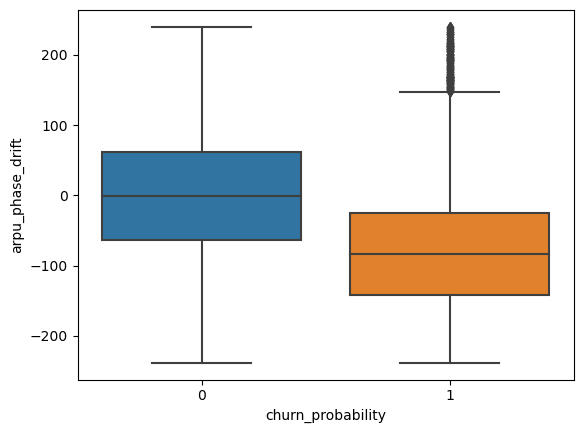

In [33]:
sns.boxplot(data=df2,y='arpu_phase_drift',x='churn_probability')

In [34]:
df = df.drop(['total_arpu_6', 'total_arpu_7', 'total_arpu_8','arpu_diff_8_6'],axis=1)

In [35]:
df = df.drop(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8',
       'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8'],axis=1)

### MOU - Minutes of Usage Voice Mails

In [36]:
mou_cols = df.columns[df.columns.str.contains(r'mou')]
mou_cols

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
       'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6',
       'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8',
       'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'total_og_mou_6',
       'total_og_

- Some of the columns here are MAR 
- So apply Missing Indicator Imputation

In [37]:
df['missing_indicator_mins_per_usg_jun'] = np.where(df['onnet_mou_6'].isnull(),1,0)
df['missing_indicator_mins_per_usg_jul'] = np.where(df['onnet_mou_7'].isnull(),1,0)
df['missing_indicator_mins_per_usg_aug'] = np.where(df['onnet_mou_8'].isnull(),1,0)

In [38]:
# Now that there is a missing value indicator fill null values with zero
df[mou_cols] = df[mou_cols].fillna(0)

In [39]:
onnet_mou_cols = df.columns[df.columns.str.contains(r"^onnet_mou")]
offnet_mou_cols = df.columns[df.columns.str.contains(r"^offnet_mou")]

In [40]:
onnet_mou_cols

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8'], dtype='object')

In [41]:
offnet_mou_cols

Index(['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8'], dtype='object')

In [42]:
df['offnet_mou_diff_7_6']= df['offnet_mou_7'] - df['offnet_mou_6']
df['offnet_mou_diff_8_7'] = df['offnet_mou_8'] - df['offnet_mou_7']

In [43]:
df['onnet_mou_diff_7_6']= df['onnet_mou_7'] - df['onnet_mou_6']
df['onnet_mou_diff_8_7'] = df['onnet_mou_8'] - df['onnet_mou_7']

In [44]:
df['offnet_mou_phase_drift'] = df['offnet_mou_8'] - ((df['offnet_mou_7'] + df['offnet_mou_6']) /2)

In [45]:
df['onnet_mou_phase_drift'] = df['onnet_mou_8'] - ((df['onnet_mou_7'] + df['onnet_mou_6']) /2)

<Axes: xlabel='offnet_mou_diff_7_6', ylabel='Density'>

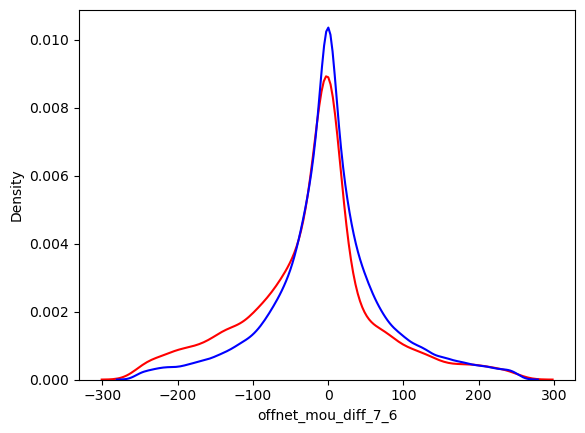

In [46]:

df2 = df.loc[(df['offnet_mou_diff_7_6'] > df['offnet_mou_diff_7_6'].quantile(.05)) & (df['offnet_mou_diff_7_6'] < df['offnet_mou_diff_7_6'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='offnet_mou_diff_7_6',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='offnet_mou_diff_7_6',color='b')

<Axes: xlabel='onnet_mou_diff_7_6', ylabel='Density'>

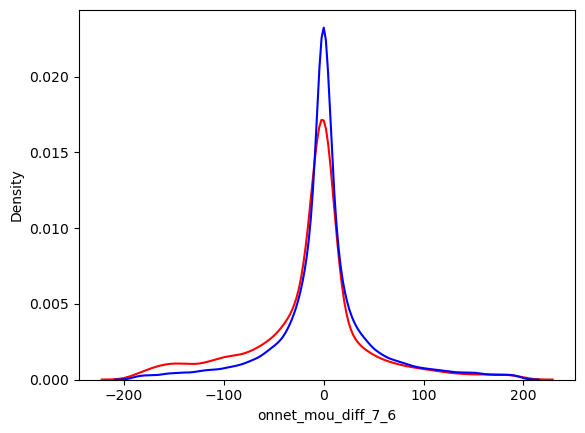

In [47]:

df2 = df.loc[(df['onnet_mou_diff_7_6'] > df['onnet_mou_diff_7_6'].quantile(.05)) & (df['onnet_mou_diff_7_6'] < df['onnet_mou_diff_7_6'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='onnet_mou_diff_7_6',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='onnet_mou_diff_7_6',color='b')

<Axes: xlabel='onnet_mou_diff_8_7', ylabel='Density'>

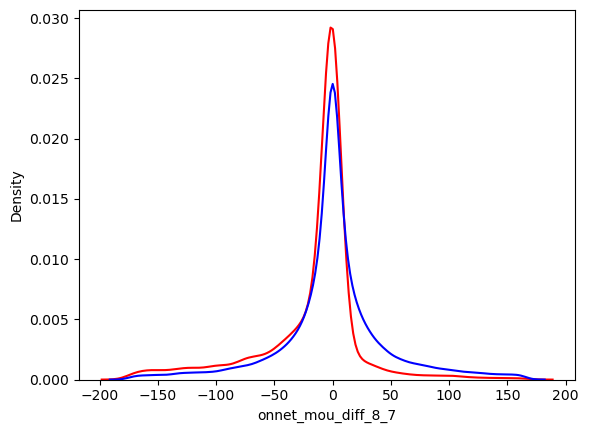

In [48]:

df2 = df.loc[(df['onnet_mou_diff_8_7'] > df['onnet_mou_diff_8_7'].quantile(.05)) & (df['onnet_mou_diff_8_7'] < df['onnet_mou_diff_8_7'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='onnet_mou_diff_8_7',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='onnet_mou_diff_8_7',color='b')

<Axes: xlabel='offnet_mou_diff_8_7', ylabel='Density'>

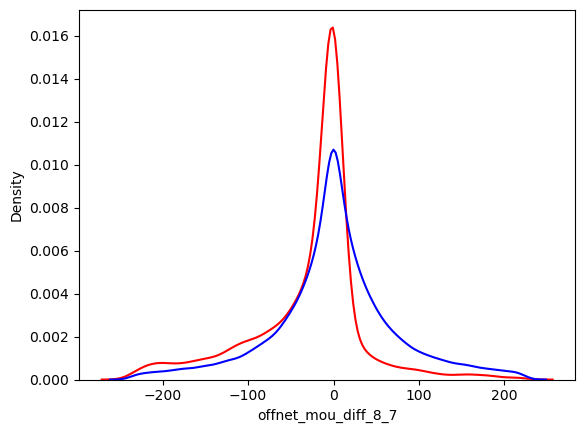

In [49]:

df2 = df.loc[(df['offnet_mou_diff_8_7'] > df['offnet_mou_diff_8_7'].quantile(.05)) & (df['offnet_mou_diff_8_7'] < df['offnet_mou_diff_8_7'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='offnet_mou_diff_8_7',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='offnet_mou_diff_8_7',color='b')

<Axes: xlabel='offnet_mou_phase_drift', ylabel='Density'>

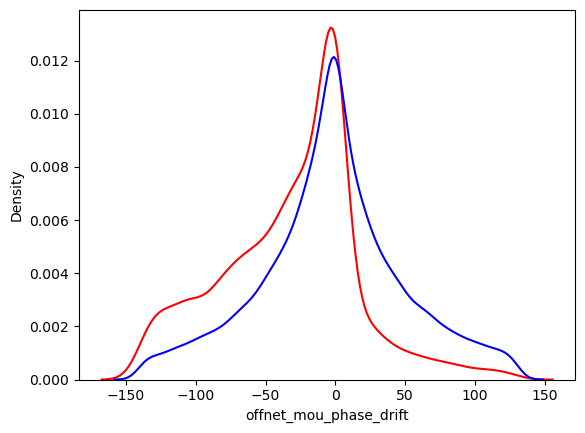

In [50]:

df2 = df.loc[(df['offnet_mou_phase_drift'] > df['offnet_mou_phase_drift'].quantile(.1)) & (df['offnet_mou_phase_drift'] < df['offnet_mou_phase_drift'].quantile(.9))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='offnet_mou_phase_drift',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='offnet_mou_phase_drift',color='b')

<Axes: xlabel='onnet_mou_phase_drift', ylabel='Density'>

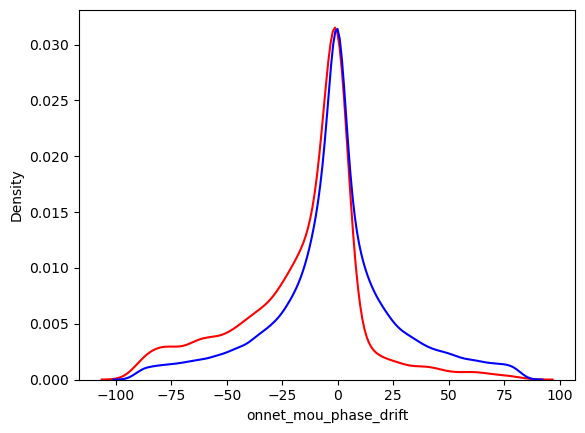

In [51]:

df2 = df.loc[(df['onnet_mou_phase_drift'] > df['onnet_mou_phase_drift'].quantile(.1)) & (df['onnet_mou_phase_drift'] < df['onnet_mou_phase_drift'].quantile(.9))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='onnet_mou_phase_drift',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='onnet_mou_phase_drift',color='b')

In [52]:
df['onnet_mou_monthly'] = df[onnet_mou_cols].sum(axis=1) / len(onnet_mou_cols)
df['offnet_mou_monthly'] = df[offnet_mou_cols].sum(axis=1) / len(offnet_mou_cols)

<Axes: xlabel='onnet_mou_monthly', ylabel='Density'>

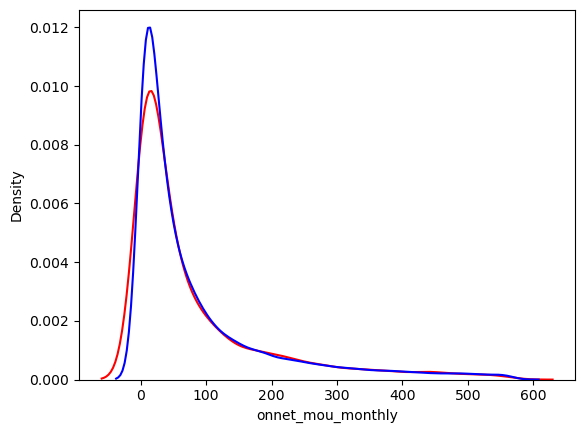

In [53]:

df2 = df.loc[(df['onnet_mou_monthly'] > df['onnet_mou_monthly'].quantile(.05)) & (df['onnet_mou_monthly'] < df['onnet_mou_monthly'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='onnet_mou_monthly',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='onnet_mou_monthly',color='b')

<Axes: xlabel='offnet_mou_monthly', ylabel='Density'>

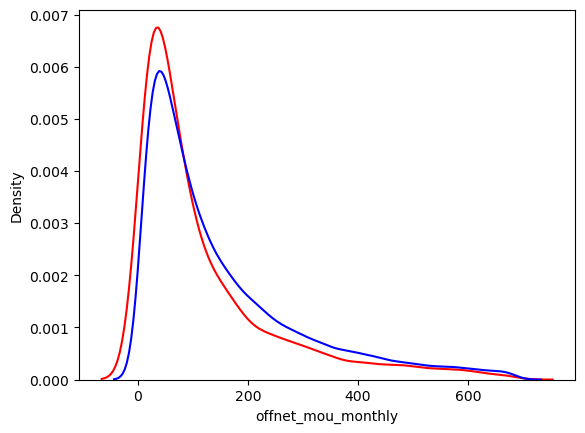

In [54]:

df2 = df.loc[(df['offnet_mou_monthly'] > df['offnet_mou_monthly'].quantile(.05)) & (df['offnet_mou_monthly'] < df['offnet_mou_monthly'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='offnet_mou_monthly',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='offnet_mou_monthly',color='b')

<Axes: xlabel='onnet_mou_monthly', ylabel='offnet_mou_monthly'>

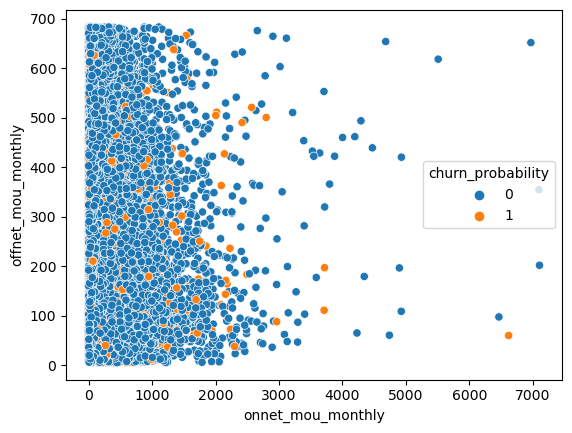

In [55]:
sns.scatterplot(data=df2,x='onnet_mou_monthly',y='offnet_mou_monthly',hue='churn_probability')

In [56]:
df = df.drop(columns = list(onnet_mou_cols)+list(offnet_mou_cols))

In [57]:
roam_mou_cols = df.columns[df.columns.str.contains(r"^roam[a-zA-Z_]+mou_[0-9]$")]
roam_mou_cols

Index(['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6',
       'roam_og_mou_7', 'roam_og_mou_8'],
      dtype='object')

In [58]:
roam_mou_6 = [i for i in roam_mou_cols if re.search(r"ic|og",i) and re.search(r"6",i)]
roam_mou_7 = [i for i in roam_mou_cols if re.search(r"ic|og",i) and re.search(r"7",i)]
roam_mou_8 = [i for i in roam_mou_cols if re.search(r"ic|og",i) and re.search(r"8",i)]
df['roam_mou_6'] = df[roam_mou_6].sum(axis=1)
df['roam_mou_7'] = df[roam_mou_7].sum(axis=1)
df['roam_mou_8'] = df[roam_mou_8].sum(axis=1)

In [59]:
roam_mou = [i for i in df.columns if re.search(r"^roam_mou_[6-8]$",i)]
df['roam_mou_monthly'] = df[roam_mou].sum(axis=1) / len(df)

<Axes: xlabel='roam_mou_monthly', ylabel='Density'>

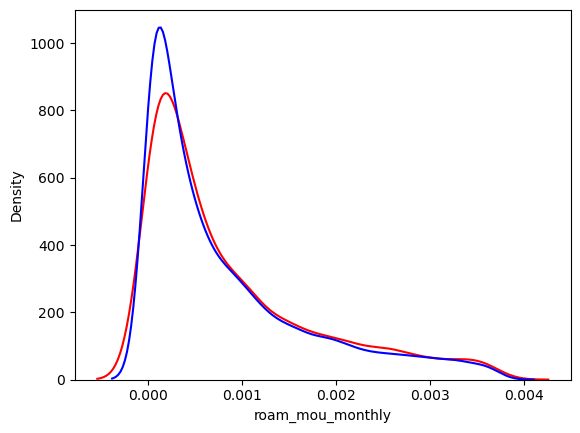

In [60]:

df2 = df.loc[(df['roam_mou_monthly'] > df['roam_mou_monthly'].quantile(.05)) & (df['roam_mou_monthly'] < df['roam_mou_monthly'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='roam_mou_monthly',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='roam_mou_monthly',color='b')

In [61]:
q=np.arange(.75,1.,.05)

In [62]:
df[roam_mou_cols].describe()

,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,9.379276,6.745305,6.634328,13.625476,9.464386,9.254848
std,56.260778,54.892940,51.999899,72.055036,57.409013,62.923987
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2850.980000,4155.830000,4169.810000,3775.110000,2812.040000,5337.040000


In [63]:
df.groupby(['churn_probability'])[roam_mou_cols].quantile(q).T

churn_probability    0                                   1                   \
                  0.75 0.80   0.85    0.90    0.95    0.75    0.80     0.85   
roam_ic_mou_6      0.0  0.0  2.130   9.790  36.680  1.0100   3.600   8.8535   
roam_ic_mou_7      0.0  0.0  0.000   2.810  17.890  1.5300   3.960   9.0170   
roam_ic_mou_8      0.0  0.0  0.000   2.154  18.260  2.1150   4.806   9.5775   
roam_og_mou_6      0.0  0.0  3.401  17.544  59.440  3.1525  11.120  23.7705   
roam_og_mou_7      0.0  0.0  0.000   4.710  31.757  3.5875  11.230  23.0275   
roam_og_mou_8      0.0  0.0  0.000   3.360  29.837  4.5825  11.720  23.2975   

churn_probability                    
                     0.90      0.95  
roam_ic_mou_6      20.878   62.6490  
roam_ic_mou_7      19.882   59.0825  
roam_ic_mou_8      20.020   60.4665  
roam_og_mou_6      49.818  126.9400  
roam_og_mou_7      45.890  106.2825  
roam_og_mou_8      45.685  101.9715

In [64]:
mou_6 = [i for i in roam_mou_cols if re.search(r'6$',i)]
mou_7 = [i for i in roam_mou_cols if re.search(r'7$',i)]
mou_8 = [i for i in roam_mou_cols if re.search(r'8$',i)]

In [65]:
df[mou_6]

,roam_ic_mou_6,roam_og_mou_6
0,0.00,0.00
1,0.00,0.00
2,0.00,0.00
3,0.00,0.00
4,53.64,15.73
...,...,...
69994,14.96,0.00
69995,0.00,0.00
69996,0.00,0.00
69997,25.06,4.58


In [66]:

df['roam_diff_7_6'] = df[mou_7].sum(axis=1) - df[mou_6].sum(axis=1)
df['roam_diff_8_7'] = df[mou_8].sum(axis=1) - df[mou_7].sum(axis=1)

In [67]:
df['roam_phase_drift'] = df[mou_8].sum(axis=1) - ((df[mou_7].sum(axis=1) + df[mou_6].sum(axis=1))/2)

In [68]:
df['roam_diff_7_6'].describe()

count    69999.000000
mean        -6.795062
std        107.139945
min      -4323.490000
25%          0.000000
50%          0.000000
75%          0.000000
max       4091.520000
Name: roam_diff_7_6, dtype: float64

<Axes: xlabel='roam_diff_7_6', ylabel='Density'>

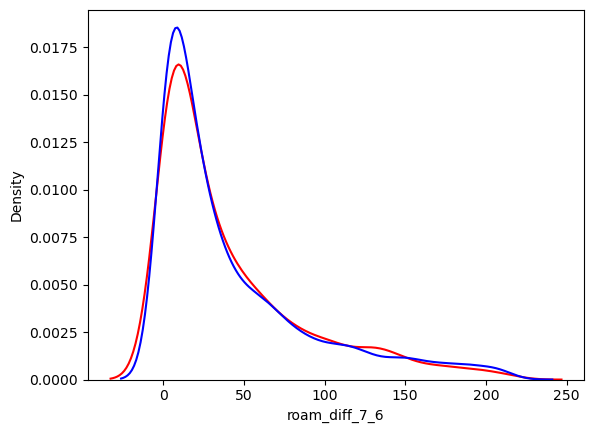

In [69]:

df2 = df.loc[(df['roam_diff_7_6'] > df['roam_diff_7_6'].quantile(.5)) & (df['roam_diff_7_6'] < df['roam_diff_7_6'].quantile(.99))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='roam_diff_7_6',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='roam_diff_7_6',color='b')

<Axes: xlabel='roam_diff_8_7', ylabel='Density'>

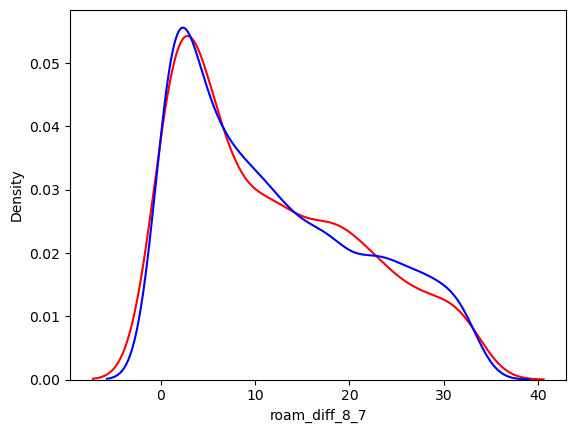

In [70]:

df2 = df.loc[(df['roam_diff_8_7'] > df['roam_diff_8_7'].quantile(.5)) & (df['roam_diff_8_7'] < df['roam_diff_8_7'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='roam_diff_8_7',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='roam_diff_8_7',color='b')

<Axes: xlabel='roam_phase_drift', ylabel='Density'>

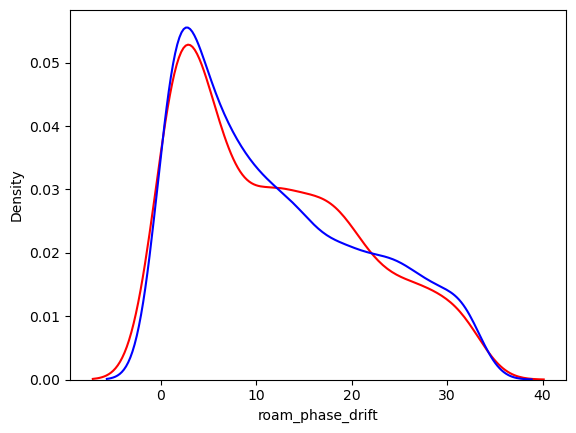

In [71]:

df2 = df.loc[(df['roam_phase_drift'] > df['roam_phase_drift'].quantile(.5)) & (df['roam_phase_drift'] < df['roam_phase_drift'].quantile(.95))]
sns.kdeplot(data = df2[df2.churn_probability == 1],x='roam_phase_drift',color = 'r')
sns.kdeplot(data = df2[df2.churn_probability == 0],x='roam_phase_drift',color='b')

In [72]:
[i for i in df.columns if re.search(r'roam',i)]

['roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'roam_mou_6',
 'roam_mou_7',
 'roam_mou_8',
 'roam_mou_monthly',
 'roam_diff_7_6',
 'roam_diff_8_7',
 'roam_phase_drift']

In [73]:
df = df.drop(columns =[i for i in df.columns if re.search(r'roam',i)] )

In [74]:
def transform_drop_cols(df,loc) : 
    drop_t2_cols = [i for i in df.columns if re.search(r"^{0}_(og|ic)_[a-zA-Z0-9_]+mou_[6-8]$".format(loc),i)]
    df = df.drop(drop_t2_cols,axis=1)

    loc_ig_og = [i for i in df.columns if re.search(r'{0}'.format(loc),i)]
    def extract_num(x) : 
        return x.split('_')[-1]
    mnth_lst = list(set(map(extract_num,loc_ig_og)))

    l = []
    for i in mnth_lst : 
        l.append([col for col in loc_ig_og if re.search(r"{0}_(og|ic)[a-z_]+{1}".format(loc,i),col)])
#         print(l)
    for m,c in zip(mnth_lst,l) : 
        df[f'{loc}_mou_{m}'] = df[c].sum(axis=1)
#     df = df.drop(loc_ig_og,axis=1)
    return df,loc_ig_og

In [75]:
df2 ,loc_ig_og= transform_drop_cols(df.copy(),'loc')
df2,std_ig_og = transform_drop_cols(df2,'std')
df2,spl_ig_og = transform_drop_cols(df2,'spl')
df2,isd_ig_og = transform_drop_cols(df2,'isd')
df = df2

In [76]:
df.groupby(['churn_probability'])[loc_ig_og].describe().T

churn_probability              0            1
loc_og_mou_6 count  62867.000000  7132.000000
             mean     144.513335    82.584096
             std      253.435933   192.102376
             min        0.000000     0.000000
             25%       15.960000     0.000000
             50%       65.360000    21.920000
             75%      169.440000    83.640000
             max    10643.380000  4088.880000
loc_og_mou_7 count  62867.000000  7132.000000
             mean     144.475110    54.887182
             std      250.119324   145.358454
             min        0.000000     0.000000
             25%       18.630000     0.000000
             50%       66.090000     6.395000
             75%      169.480000    49.327500
             max     7674.780000  3149.810000
loc_og_mou_8 count  62867.000000  7132.000000
             mean     145.625253    22.154563
             std      249.228311    89.514116
             min        0.000000     0.000000
             25%       20.010000     0.000000
             50%       67.540000     0.000000
             75%      172.080000     7.245000
             max    11039.910000  3821.210000
loc_ic_mou_6 count  62867.000000  7132.000000
             mean     167.780504    97.710658
             std      251.019003   227.976842
             min        0.000000     0.000000
             25%       29.750000     0.350000
             50%       93.590000    30.010000
             75%      210.670000   104.280000
             max     7454.630000  5852.610000
loc_ic_mou_7 count  62867.000000  7132.000000
             mean     171.177604    66.739523
             std      256.288241   183.110303
             min        0.000000     0.000000
             25%       35.010000     0.000000
             50%       96.540000    11.050000
             75%      211.670000    66.695000
             max     9669.910000  4915.790000
loc_ic_mou_8 count  62867.000000  7132.000000
             mean     173.349661    25.592482
             std      252.916689    89.146677
             min        0.000000     0.000000
             25%       37.180000     0.000000
             50%       99.480000     0.000000
             75%      215.310000    10.630000
             max    10830.160000  1841.180000

In [77]:
df.groupby(['churn_probability'])[std_ig_og].describe().T

churn_probability              0            1
std_og_mou_6 count  62867.000000  7132.000000
             mean     151.780469   263.685440
             std      366.167150   516.295298
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        8.390000    33.050000
             75%      117.660000   310.342500
             max     7498.030000  8432.990000
std_og_mou_7 count  62867.000000  7132.000000
             mean     168.128378   182.864829
             std      397.415973   447.235251
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        9.530000     0.630000
             75%      136.610000   147.382500
             max     8086.440000  8155.530000
std_og_mou_8 count  62867.000000  7132.000000
             mean     176.907384    68.430024
             std      413.650778   253.286919
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%       10.790000     0.000000
             75%      151.660000     2.442500
             max    13980.060000  5129.380000
std_ic_mou_6 count  62867.000000  7132.000000
             mean      30.877593    32.873814
             std      100.810621   116.246848
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        5.090000     4.205000
             75%       25.160000    26.392500
             max     5712.110000  2815.030000
std_ic_mou_7 count  62867.000000  7132.000000
             mean      33.581950    22.617936
             std      113.889273    94.523113
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        5.750000     0.200000
             75%       27.810000    15.852500
             max     6745.760000  3470.380000
std_ic_mou_8 count  62867.000000  7132.000000
             mean      33.876684     8.854362
             std      110.464494    42.231417
             min        0.000000     0.000000
             25%        0.150000     0.000000
             50%        6.160000     0.000000
             75%       28.495000     0.550000
             max     5658.740000  1441.030000

In [78]:
df.groupby(['churn_probability'])[spl_ig_og].describe().T

churn_probability              0            1
spl_og_mou_6 count  62867.000000  7132.000000
             mean       3.765012     4.128840
             std       15.435372    16.588451
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        2.140000     2.210000
             max     1023.210000   743.890000
spl_og_mou_7 count  62867.000000  7132.000000
             mean       4.848017     4.236813
             std       21.848973    21.556273
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        3.510000     1.660000
             max     2372.510000  1031.790000
spl_og_mou_8 count  62867.000000  7132.000000
             mean       5.148241     1.515799
             std       18.042974     6.785359
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        4.130000     0.000000
             max     1075.080000   161.010000
spl_ic_mou_6 count  62867.000000  7132.000000
             mean       0.061123     0.045025
             std        0.165188     0.129464
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max       19.760000     1.000000
spl_ic_mou_7 count  62867.000000  7132.000000
             mean       0.033552     0.019195
             std        0.138708     0.092733
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max       13.460000     1.200000
spl_ic_mou_8 count  62867.000000  7132.000000
             mean       0.042200     0.003481
             std        0.151763     0.034555
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max       16.860000     0.950000

In [79]:
df.groupby(['churn_probability'])[isd_ig_og].describe().T

churn_probability              0            1
isd_og_mou_6 count  62867.000000  7132.000000
             mean       0.744780     1.407658
             std       29.833719    22.273808
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max     5900.660000  1233.430000
isd_og_mou_7 count  62867.000000  7132.000000
             mean       0.769409     0.873006
             std       29.726937    16.402386
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max     5490.280000   702.510000
isd_og_mou_8 count  62867.000000  7132.000000
             mean       0.828398     0.521457
             std       30.089536    11.992574
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max     5681.540000   555.710000
isd_ic_mou_6 count  62867.000000  7132.000000
             mean       7.073136     7.354233
             std       60.426789    53.431637
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max     6789.410000  2073.810000
isd_ic_mou_7 count  62867.000000  7132.000000
             mean       8.062448     6.050941
             std       63.252693    54.178623
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max     5289.540000  2385.510000
isd_ic_mou_8 count  62867.000000  7132.000000
             mean       8.434649     3.253790
             std       63.149828    43.202401
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%        0.000000     0.000000
             75%        0.000000     0.000000
             max     4127.010000  2350.410000

In [80]:
mou_cols = [loc_ig_og,
std_ig_og ,
spl_ig_og,
isd_ig_og]

In [81]:
mou_cols

[['loc_og_mou_6',
  'loc_og_mou_7',
  'loc_og_mou_8',
  'loc_ic_mou_6',
  'loc_ic_mou_7',
  'loc_ic_mou_8'],
 ['std_og_mou_6',
  'std_og_mou_7',
  'std_og_mou_8',
  'std_ic_mou_6',
  'std_ic_mou_7',
  'std_ic_mou_8'],
 ['spl_og_mou_6',
  'spl_og_mou_7',
  'spl_og_mou_8',
  'spl_ic_mou_6',
  'spl_ic_mou_7',
  'spl_ic_mou_8'],
 ['isd_og_mou_6',
  'isd_og_mou_7',
  'isd_og_mou_8',
  'isd_ic_mou_6',
  'isd_ic_mou_7',
  'isd_ic_mou_8']]

In [82]:
diff_cols_mou_7_6 = []
diff_cols_mou_8_7 = []
phase_drift_mou = []
def mou_diff_cols(df,mou_cols) :
    prefix = mou_cols[0].split('_')[0]
    mou_6 = [i for i in mou_cols if re.search(r'6$',i)]
    mou_7 = [i for i in mou_cols if re.search(r'7$',i)]
    mou_8 = [i for i in mou_cols if re.search(r'8$',i)]
    df[f'{prefix}_mou_diff_7_6'] = df[mou_7].sum(axis=1) - df[mou_6].sum(axis=1)
    df[f'{prefix}_mou_diff_8_7'] = df[mou_8].sum(axis=1) - df[mou_7].sum(axis=1)
    df[f'{prefix}_mou_phase_drift'] = df[mou_8].sum(axis=1) - ((df[mou_7].sum(axis=1) + df[mou_6].sum(axis=1))/2)
    diff_cols_mou_7_6.append(prefix)
    diff_cols_mou_8_7.append(prefix)
    phase_drift_mou.append(prefix)
    return df
    
for cols in mou_cols : 
    df = mou_diff_cols(df,cols)

In [83]:
diff_cols_mou_7_6 = list(map(lambda x : x + "_mou_diff_7_6" ,diff_cols_mou_7_6))

In [84]:
diff_cols_mou_7_6

['loc_mou_diff_7_6',
 'std_mou_diff_7_6',
 'spl_mou_diff_7_6',
 'isd_mou_diff_7_6']

In [85]:
diff_cols_mou_8_7

['loc', 'std', 'spl', 'isd']

In [86]:
def dis_plot_mou_7_6(df,i,x,y) :
    df2 = df.loc[(df[i] > df[i].quantile(x)) & (df[i] < df[i].quantile(y))]
    sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
    sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')
    plt.title(f"{i} dist plot 0s vs 1s")
    plt.legend('01')
    plt.show()

- Since the scale of the values is small only a faint trend is visible , but it is certainly peresent as observed in the describe plots

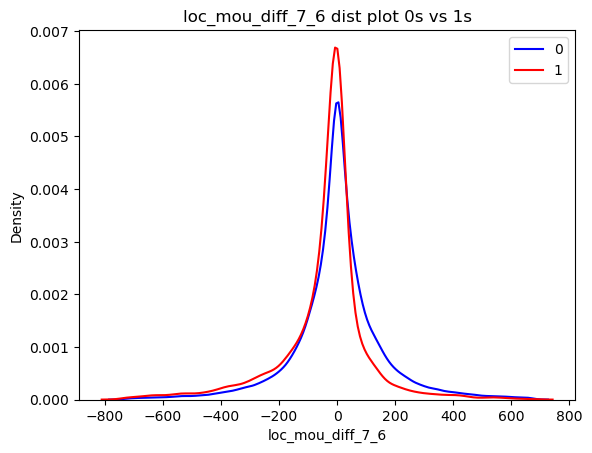

In [87]:
dis_plot_mou_7_6(df,diff_cols_mou_7_6[0],.01,.99)

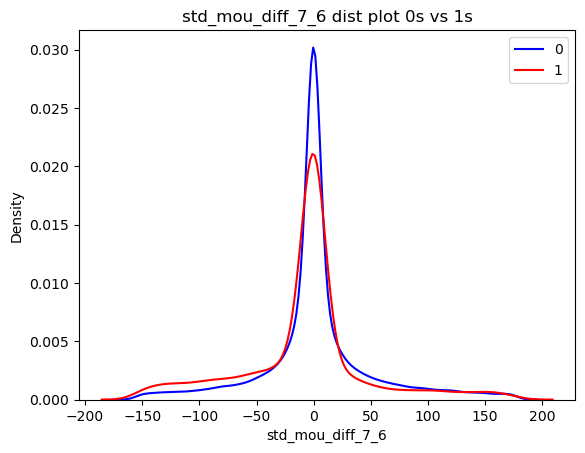

In [88]:
dis_plot_mou_7_6(df,diff_cols_mou_7_6[1],.1,.9)

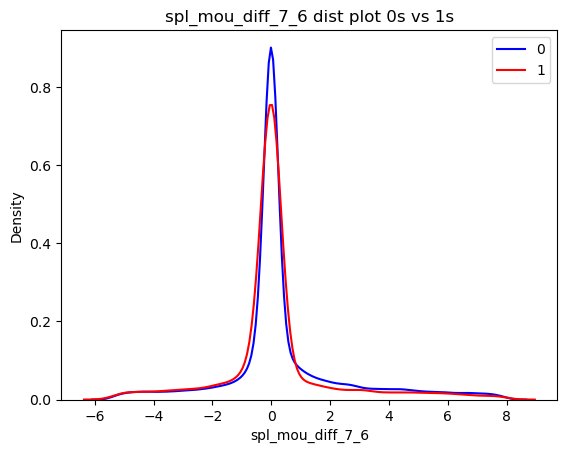

In [89]:
dis_plot_mou_7_6(df,diff_cols_mou_7_6[2],0.1,.9)

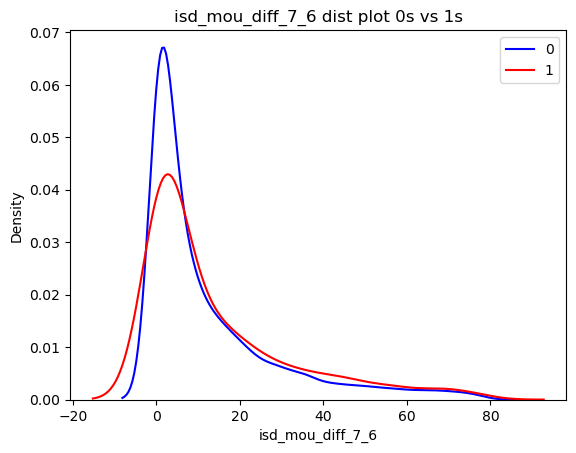

In [90]:
dis_plot_mou_7_6(df,diff_cols_mou_7_6[3],.75,.99)

In [91]:
diff_cols_mou_8_7 = list(map(lambda x : x + "_mou_diff_8_7" ,diff_cols_mou_8_7))

In [92]:
def dis_plot_mou_8_7(df,i,x,y) :
    df2 = df.loc[(df[i] > df[i].quantile(x)) & (df[i] < df[i].quantile(y))]
    sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
    sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')
    plt.title(f"{i} dist plot 0s vs 1s")
    plt.legend('01')
    plt.show()

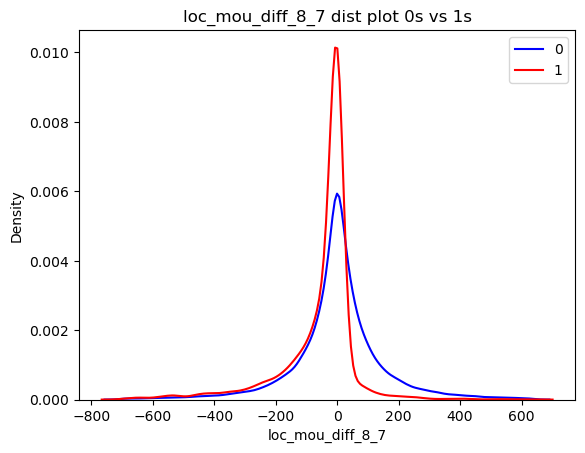

In [93]:
dis_plot_mou_8_7(df,diff_cols_mou_8_7[0],.01,.99)

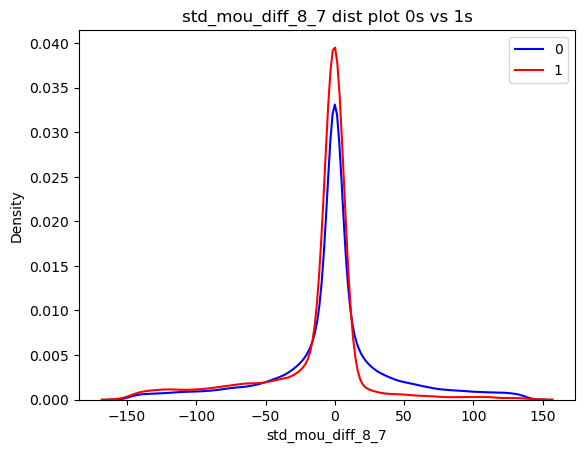

In [94]:
dis_plot_mou_8_7(df,diff_cols_mou_8_7[1],.1,.9)

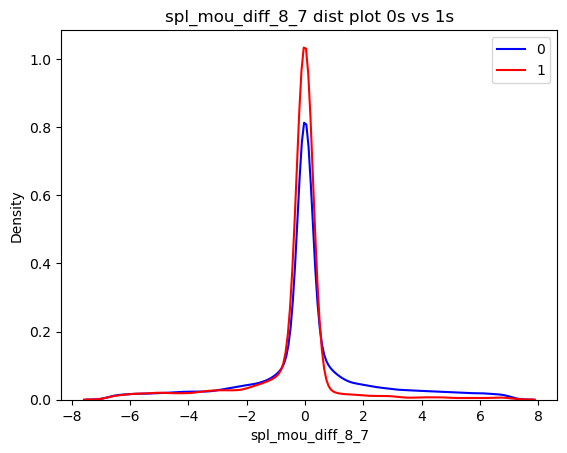

In [95]:
dis_plot_mou_8_7(df,diff_cols_mou_8_7[2],.1,.9)

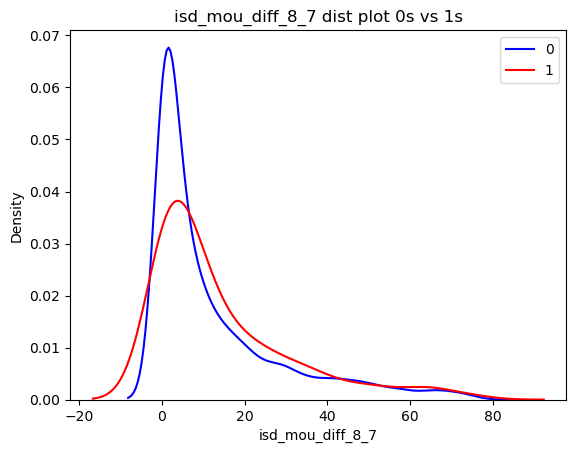

In [96]:
dis_plot_mou_8_7(df,diff_cols_mou_8_7[3],.75,.99)

In [97]:
loc_cols = df.columns[df.columns.str.contains(r"^loc")]
df['loc_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

In [98]:
loc_cols = df.columns[df.columns.str.contains(r"^std")]
df['std_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

In [99]:
loc_cols = df.columns[df.columns.str.contains(r"^isd")]
df['isd_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

In [100]:
loc_cols = df.columns[df.columns.str.contains(r"^spl")]
df['spl_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

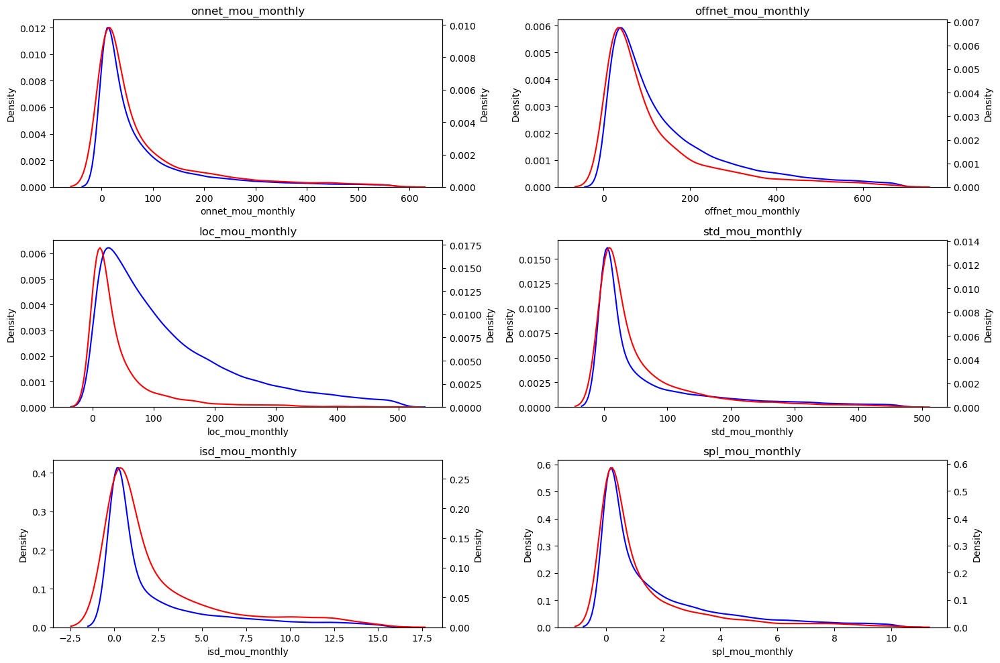

In [101]:
mou_monthly_list = df.columns[df.columns.str.contains('_mou_monthly')]
cols = 2
rows = np.ceil(len(mou_monthly_list)/cols).astype('int')
fig,ax=plt.subplots(rows,cols,figsize=(15,10))
for idx,i in enumerate(mou_monthly_list) : 
    idx1 = idx // cols
    idx2 = idx % cols
    df2 = df.loc[(df[i] > df[i].quantile(.05)) & (df[i] < df[i].quantile(.95))]
    ax2 = ax[idx1,idx2].twinx()
    sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,ax=ax[idx1,idx2],color='b')
    sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,ax=ax2,color='r')
    ax[idx1,idx2].set_title(f'{i}')
[fig.delaxes(i) for i in ax.flat if not i.has_data()]
plt.tight_layout()
plt.show()

In [102]:
phase_drift_mou = list(map(lambda x : x + "_mou_phase_drift" ,phase_drift_mou))

In [103]:
phase_drift_mou

['loc_mou_phase_drift',
 'std_mou_phase_drift',
 'spl_mou_phase_drift',
 'isd_mou_phase_drift']

In [104]:
def dis_plot_mou_phase_drift(df,i,x,y) :
    df2 = df.loc[(df[i] > df[i].quantile(x)) & (df[i] < df[i].quantile(y))]
    sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
    sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')
    plt.title(f"{i} dist plot 0s vs 1s")
    plt.legend('01')
    plt.show()

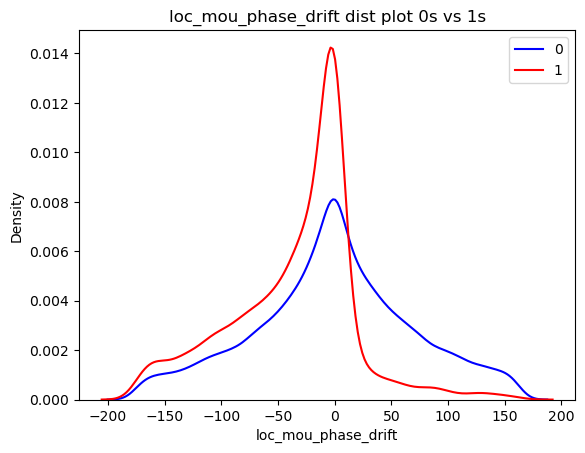

In [105]:
dis_plot_mou_phase_drift(df,phase_drift_mou[0],.1,.9)

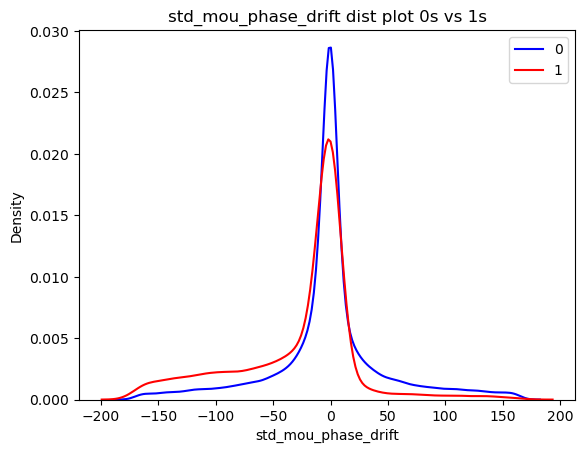

In [106]:
dis_plot_mou_phase_drift(df,phase_drift_mou[1],.1,.9)

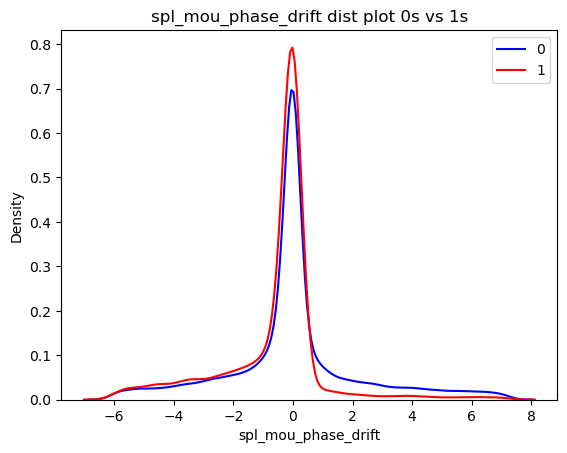

In [107]:
dis_plot_mou_phase_drift(df,phase_drift_mou[2],.1,.9)

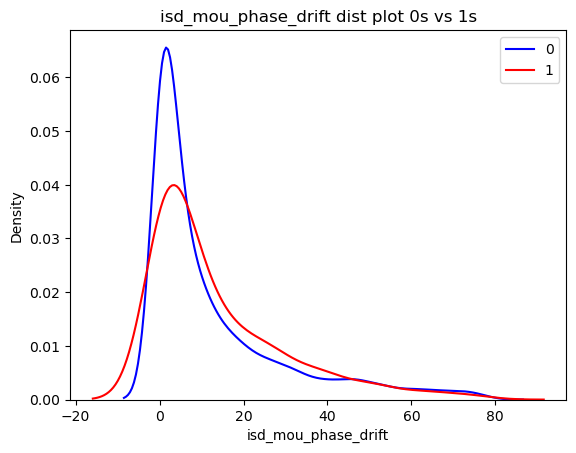

In [108]:
dis_plot_mou_phase_drift(df,phase_drift_mou[3],.75,.99)

In [109]:
mou_cols = [i for i in df.columns if re.search(r'mou',i)]

In [110]:
drop_mou = [i for i in  mou_cols if not re.search(r'(mou_monthly$|diff|phase_drift$)',i)]

In [111]:
drop_mou

['loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'std_ic_mou_6',
 'std_ic_mou_7',
 'std_ic_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'spl_ic_mou_6',
 'spl_ic_mou_7',
 'spl_ic_mou_8',
 'isd_ic_mou_6',
 'isd_ic_mou_7',
 'isd_ic_mou_8',
 'loc_mou_7',
 'loc_mou_8',
 'loc_mou_6',
 'std_mou_7',
 'std_mou_8',
 'std_mou_6',
 'spl_mou_7',
 'spl_mou_8',
 'spl_mou_6',
 'isd_mou_7',
 'isd_mou_8',
 'isd_mou_6']

In [112]:
df['last_date_of_month_6'].unique()

array(['6/30/2014'], dtype=object)

In [113]:
drop_date = [i for i in df.columns if re.search(r'^last_date_of_month',i)]
df = df.drop(drop_date,axis=1)

In [114]:
total_ic_og  = df.columns[df.columns.str.contains(r'total_(ic|og)_mou')]

In [115]:
total_ig = [i for i in total_ic_og if re.search(r'ic',i)]
total_og = [i for i in total_ic_og if re.search(r'og',i)]

In [116]:
drop_mou = np.setdiff1d(drop_mou,total_ic_og)

In [117]:
total_ic_og

Index(['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'total_ic_mou_6',
       'total_ic_mou_7', 'total_ic_mou_8'],
      dtype='object')

In [118]:
mou_6 = df.columns[df.columns.str.contains(r'^total_(og|ic)_mou_6$')]
df['total_mou_6'] = df[mou_6].sum(axis=1)
mou_7 = df.columns[df.columns.str.contains(r'^total_(og|ic)_mou_7$')]
df['total_mou_7'] = df[mou_7].sum(axis=1)
mou_8 = df.columns[df.columns.str.contains(r'^total_(og|ic)_mou_8$')]
df['total_mou_8'] = df[mou_8].sum(axis=1)

In [119]:
total_mou = df.columns[df.columns.str.contains(r"total_mou_[6-8]$")]
total_mou

Index(['total_mou_6', 'total_mou_7', 'total_mou_8'], dtype='object')

In [120]:
df['total_incoming_mins_usg_per_usr'] = df[total_ig].sum(axis=1)
df['total_outgoing_mins_usg_per_usr'] = df[total_og].sum(axis=1)
df['total_mins_usg_per_usr'] = df[total_mou].sum(axis=1)

In [121]:
df = df.drop(total_ic_og,axis=1)

In [122]:
df.groupby(['churn_probability'])[total_mou].describe().T

churn_probability             0            1
total_mou_6 count  62867.000000  7132.000000
            mean     507.885714   490.968591
            std      592.911530   685.614387
            min        0.000000     0.000000
            25%      132.620000    10.915000
            50%      327.220000   256.470000
            75%      666.955000   685.547500
            max    12311.260000  8680.270000
total_mou_7 count  62867.000000  7132.000000
            mean     532.144963   338.850160
            std      614.127701   593.889639
            min        0.000000     0.000000
            25%      145.820000     0.000000
            50%      341.120000    90.010000
            75%      696.820000   438.702500
            max    10406.870000  8372.630000
total_mou_8 count  62867.000000  7132.000000
            mean     545.252557   130.544219
            std      619.842959   351.602719
            min        0.000000     0.000000
            25%      156.380000     0.000000
            50%      354.820000     0.000000
            75%      716.265000    75.582500
            max    14079.840000  5292.390000

In [123]:
df = df.drop(drop_mou,axis=1)

In [124]:
df['total_mou_diff_7_6'] = df['total_mou_7'] - df['total_mou_6']
df['total_mou_diff_8_7'] = df['total_mou_8'] - df['total_mou_7']

In [125]:
df['total_mou_phase_drift'] = df['total_mou_8'] - ((df['total_mou_7'] + df['total_mou_6'])/2)

In [126]:
df['total_mou_monthly'] = df[total_mou].sum(axis=1)

In [127]:
df = df.drop(total_mou,axis=1)

In [128]:
mou_cols = [i for i in df.columns if re.search(r'mou',i)]
mou_cols

['offnet_mou_diff_7_6',
 'offnet_mou_diff_8_7',
 'onnet_mou_diff_7_6',
 'onnet_mou_diff_8_7',
 'offnet_mou_phase_drift',
 'onnet_mou_phase_drift',
 'onnet_mou_monthly',
 'offnet_mou_monthly',
 'loc_mou_diff_7_6',
 'loc_mou_diff_8_7',
 'loc_mou_phase_drift',
 'std_mou_diff_7_6',
 'std_mou_diff_8_7',
 'std_mou_phase_drift',
 'spl_mou_diff_7_6',
 'spl_mou_diff_8_7',
 'spl_mou_phase_drift',
 'isd_mou_diff_7_6',
 'isd_mou_diff_8_7',
 'isd_mou_phase_drift',
 'loc_mou_monthly',
 'std_mou_monthly',
 'isd_mou_monthly',
 'spl_mou_monthly',
 'total_mou_diff_7_6',
 'total_mou_diff_8_7',
 'total_mou_phase_drift',
 'total_mou_monthly']

In [129]:
df.groupby(['churn_probability'])['total_mou_diff_7_6'].describe()

,count,mean,std,min,25%,50%,75%,max
churn_probability,,,,,,,,
0,62867.0,24.259250,419.642238,-8235.73,-101.1400,0.0,123.1350,8388.97
1,7132.0,-152.118431,593.511058,-7078.09,-324.1625,-33.8,24.0025,4192.50


In [130]:
df.groupby(['churn_probability'])['total_mou_diff_8_7'].describe()

,count,mean,std,min,25%,50%,75%,max
churn_probability,,,,,,,,
0,62867.0,13.107594,390.255192,-5344.40,-96.4500,1.38,113.08,11500.70
1,7132.0,-208.305941,484.063670,-6144.07,-277.5225,-28.32,0.00,2368.68


In [131]:
df.groupby(['churn_probability'])['total_mou_phase_drift'].describe()

,count,mean,std,min,25%,50%,75%,max
churn_probability,,,,,,,,
0,62867.0,25.237219,409.005142,-5050.925,-101.3275,0.52,123.8100,12790.270
1,7132.0,-284.365156,512.522073,-7412.170,-413.3250,-152.99,-0.0625,3440.355


<Axes: xlabel='total_mou_diff_7_6', ylabel='Density'>

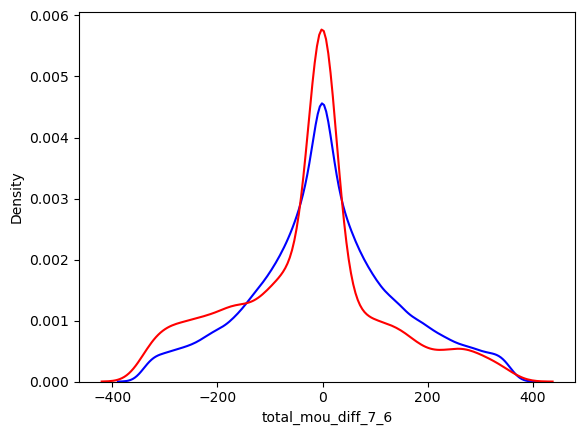

In [132]:
i = 'total_mou_diff_7_6'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='total_mou_diff_8_7', ylabel='Density'>

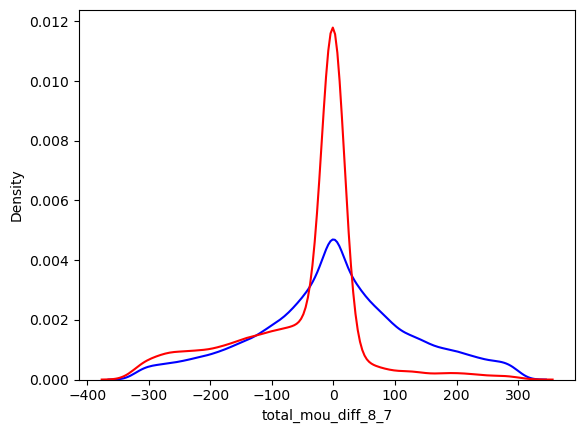

In [133]:
i = 'total_mou_diff_8_7'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='total_mou_phase_drift', ylabel='Density'>

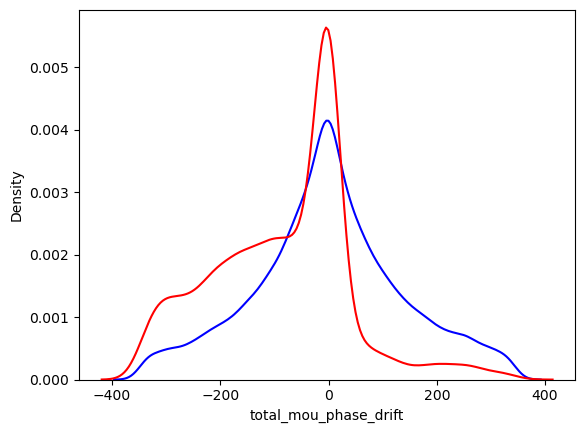

In [134]:
i = 'total_mou_phase_drift'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

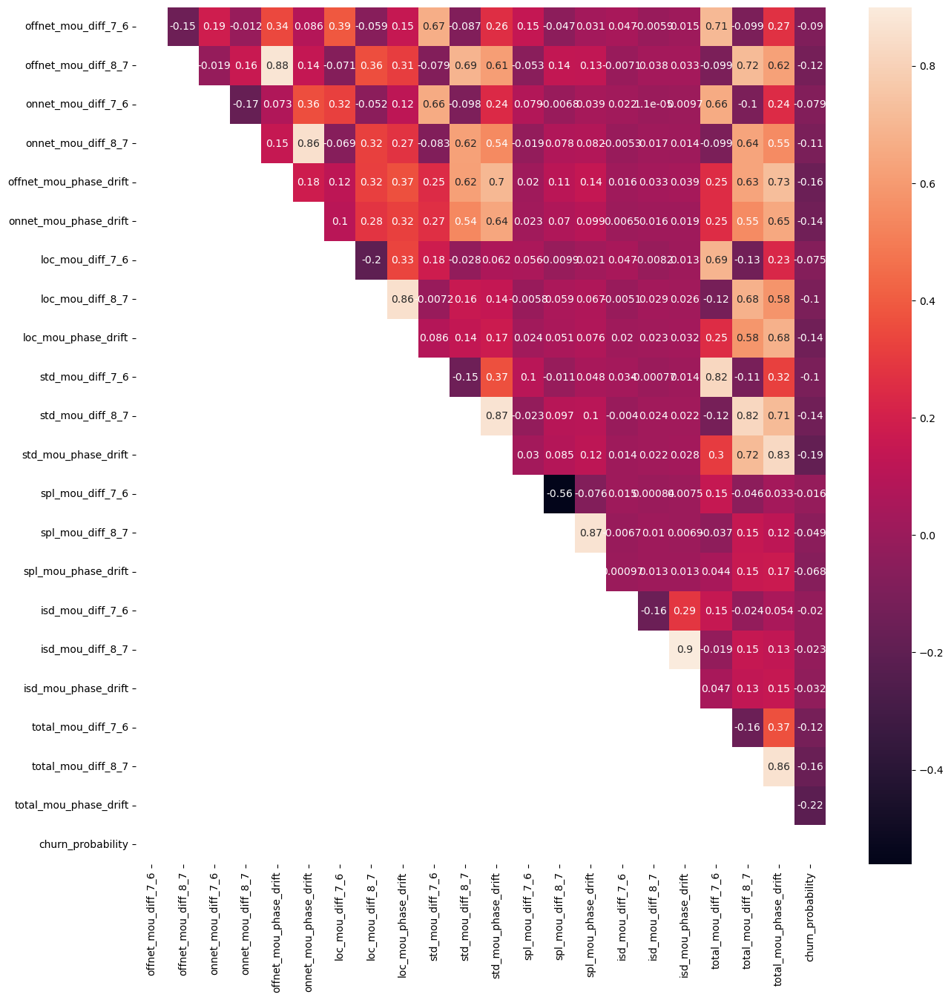

In [135]:
plt.figure(figsize=(15,15))
corr_cols = [i for i in mou_cols if re.search(r'(diff|phase_drift)',i)] + ['churn_probability']
corr_mat = df[corr_cols]
corr_matrix = corr_mat.corr().where(np.triu(np.ones(corr_mat.corr().shape),k=1).astype('bool'))
sns.heatmap(corr_matrix,annot=True)
plt.show()

In [136]:
# df[['arpu_diff_8_7','total_mou_diff_7_6']].cov()

# RECH - Recharge

In [137]:
recharge_cols = df.columns[df.columns.str.contains(r"rech")]
recharge_cols

Index(['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8'],
      dtype='object')

In [138]:
rech_num_amt = [i for i in recharge_cols if re.search(r"total_rech_(num|amt)",i)]
rech_num_amt

['total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8']

In [139]:
df['amt_per_recharge_6'] = df['total_rech_amt_6'] / df['total_rech_num_6']
df['amt_per_recharge_7'] = df['total_rech_amt_7'] / df['total_rech_num_7']
df['amt_per_recharge_8'] = df['total_rech_amt_8'] / df['total_rech_num_8']

In [140]:
amt_per_recharge_mnth = [i for i in df.columns if re.search(r'amt_per_recharge_[6-8]$',i)]

In [141]:
df.loc[df['amt_per_recharge_6'].isnull(),['total_rech_amt_6','total_rech_num_6']]

,total_rech_amt_6,total_rech_num_6
28,0,0
95,0,0
293,0,0
351,0,0
498,0,0
...,...,...
69841,0,0
69863,0,0
69868,0,0
69931,0,0


In [142]:
df[amt_per_recharge_mnth] = df[amt_per_recharge_mnth].fillna(0)

In [143]:
df.groupby(['churn_probability'])[amt_per_recharge_mnth].describe().T

churn_probability                    0            1
amt_per_recharge_6 count  62867.000000  7132.000000
                   mean      47.289764    47.202381
                   std       55.432605    61.547181
                   min        0.000000     0.000000
                   25%       17.400000    15.710714
                   50%       36.400000    34.000000
                   75%       64.000000    62.000000
                   max     4010.000000  1000.000000
amt_per_recharge_7 count  62867.000000  7132.000000
                   mean      47.619553    34.600928
                   std       56.350421    55.766497
                   min        0.000000     0.000000
                   25%       16.363636     0.000000
                   50%       34.000000    19.889881
                   75%       64.000000    47.666667
                   max     2372.647059   916.666667
amt_per_recharge_8 count  62867.000000  7132.000000
                   mean      57.528273    22.460873
                   std       71.829809    53.640312
                   min        0.000000     0.000000
                   25%       18.000000     0.000000
                   50%       38.166667     0.000000
                   75%       76.166667    26.000000
                   max     4449.000000  1000.000000

In [144]:
df['amt_per_recharge_diff_7_6'] = df['amt_per_recharge_7'] - df['amt_per_recharge_6']
df['amt_per_recharge_diff_8_7'] = df['amt_per_recharge_8'] - df['amt_per_recharge_7']

In [145]:
df['amt_per_recharge_phase_drift'] = df['amt_per_recharge_8'] - ((df['amt_per_recharge_7'] + df['amt_per_recharge_6'])/2)

<Axes: xlabel='amt_per_recharge_diff_7_6', ylabel='Density'>

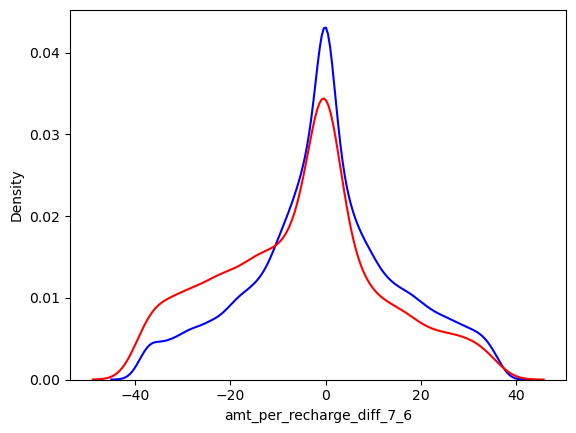

In [146]:
i = 'amt_per_recharge_diff_7_6'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='amt_per_recharge_diff_8_7', ylabel='Density'>

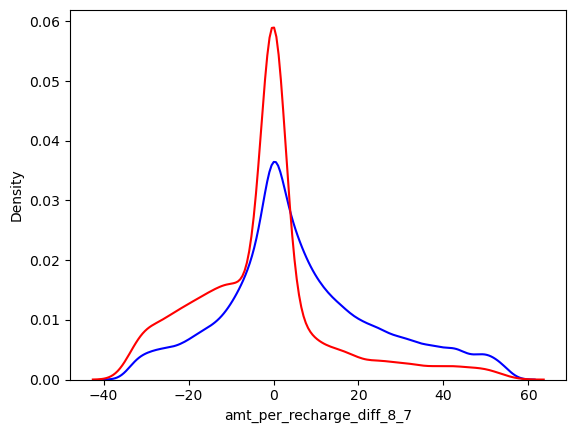

In [147]:
i = 'amt_per_recharge_diff_8_7'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='amt_per_recharge_phase_drift', ylabel='Density'>

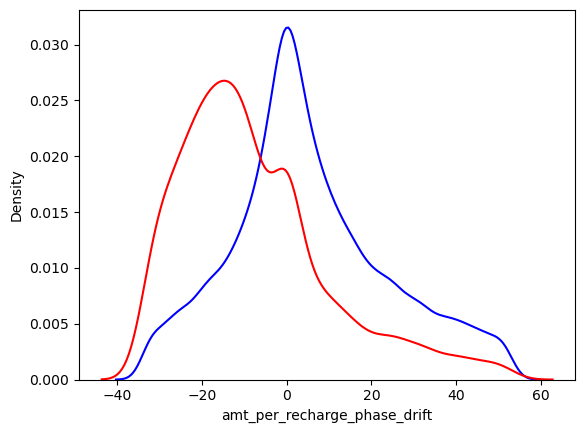

In [148]:
i = 'amt_per_recharge_phase_drift'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

In [149]:
df['total_rech_num_monthly'] = df.loc[:,rech_num_amt[:3]].sum(axis=1)
df['total_rech_amt_monthly'] = df.loc[:,rech_num_amt[3:]].sum(axis=1)

In [150]:
df['amt_per_recharge_monthly'] = df['total_rech_amt_monthly'] / df['total_rech_num_monthly'] 

In [151]:
df.loc[df['amt_per_recharge_monthly'].isnull(),['total_rech_amt_monthly','total_rech_num_monthly']]

,total_rech_amt_monthly,total_rech_num_monthly
498,0,0
2324,0,0
4905,0,0
5706,0,0
5832,0,0
...,...,...
63592,0,0
64741,0,0
65558,0,0
67620,0,0


In [152]:
df['amt_per_recharge_monthly'] = df['amt_per_recharge_monthly'].fillna(0)

In [153]:
df['total_recharge_amount_per_usr'] = df['total_rech_amt_monthly'] 
df['total_recharge_freq_per_usr'] = df['total_rech_num_monthly'] 


In [154]:
df = df.drop(['total_rech_amt_monthly','total_rech_num_monthly','total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8','amt_per_recharge_6', 'amt_per_recharge_7', 'amt_per_recharge_8'],axis=1)

In [155]:
date_rech = df.columns[df.columns.str.contains(r"date_of_last_rech_\d{1}")]
date_rech

Index(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'], dtype='object')

In [156]:
for i in date_rech :
    df[i] = pd.to_datetime(df[i],format="%m/%d/%Y")

In [157]:
df.loc[df['date_of_last_rech_6'].isnull(),date_rech]

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8
28,NaT,2014-07-19,2014-08-28
95,NaT,2014-07-27,2014-08-25
293,NaT,2014-07-31,2014-08-29
351,NaT,2014-07-30,2014-08-08
498,NaT,NaT,NaT
...,...,...,...
69841,NaT,2014-07-30,2014-08-27
69863,NaT,2014-07-31,2014-08-28
69868,NaT,2014-07-22,2014-08-28
69931,NaT,2014-07-27,2014-08-31


In [158]:
recharge_duration=['prev_recharge_duration','next_recharge_duration']
df[recharge_duration] = df[date_rech].diff(axis=1).iloc[:,1:]

In [159]:
df[recharge_duration].isnull().sum()

prev_recharge_duration    2211
next_recharge_duration    3155
dtype: int64

In [160]:
df.loc[df['prev_recharge_duration'].isnull(),recharge_duration]

,prev_recharge_duration,next_recharge_duration
28,NaT,40 days
31,NaT,NaT
76,NaT,NaT
95,NaT,29 days
136,NaT,NaT
...,...,...
69881,NaT,NaT
69919,NaT,NaT
69931,NaT,35 days
69956,NaT,NaT


In [161]:
df = df.drop(columns = date_rech)

In [162]:
df[recharge_duration] = df[recharge_duration].apply(lambda x : x.dt.days)

In [163]:
df.loc[df['prev_recharge_duration'].isnull(),recharge_duration]

,prev_recharge_duration,next_recharge_duration
28,NaN,40.0
31,NaN,NaN
76,NaN,NaN
95,NaN,29.0
136,NaN,NaN
...,...,...
69881,NaN,NaN
69919,NaN,NaN
69931,NaN,35.0
69956,NaN,NaN


In [164]:
df['prev_recharge_duration'].describe()

count    67788.000000
mean        31.314244
std          7.109453
min          1.000000
25%         28.000000
50%         31.000000
75%         35.000000
max         60.000000
Name: prev_recharge_duration, dtype: float64

In [165]:
df['next_recharge_duration'].describe()

count    66844.000000
mean        30.823784
std          7.249274
min          1.000000
25%         28.000000
50%         31.000000
75%         34.000000
max         61.000000
Name: next_recharge_duration, dtype: float64

- Fill in zero because there weren't any recharge in that month for the user

In [166]:
df['prev_recharge_duration'] = df['prev_recharge_duration'].fillna(0)
df['next_recharge_duration'] = df['next_recharge_duration'].fillna(0)

In [167]:
df.groupby(['churn_probability'])[['prev_recharge_duration','next_recharge_duration']].describe()

prev_recharge_duration                                   \
                                   count       mean        std  min   25%   
churn_probability                                                           
0                                62867.0  30.808373   8.237892  0.0  28.0   
1                                 7132.0  26.065620  12.507114  0.0  21.0   

                                    next_recharge_duration             \
                    50%   75%   max                  count       mean   
churn_probability                                                       
0                  31.0  34.0  60.0                62867.0  30.154055   
1                  29.0  33.0  59.0                 7132.0  23.091699   

                                                           
                         std  min   25%   50%   75%   max  
churn_probability                                          
0                   8.495519  0.0  27.0  31.0  34.0  61.0  
1                  14.592334  0.0  12.0  27.0  33.0  57.0

<Axes: xlabel='prev_recharge_duration', ylabel='Density'>

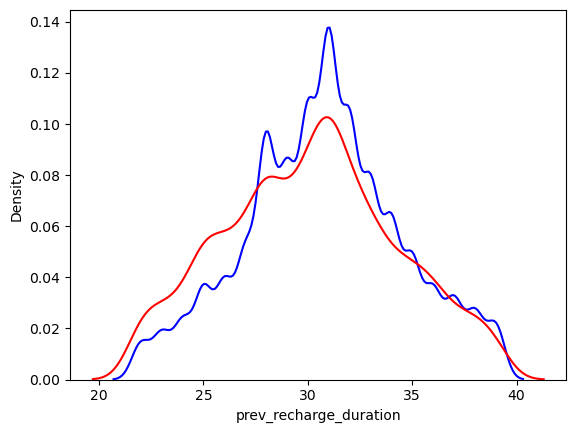

In [168]:
i = 'prev_recharge_duration'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='next_recharge_duration', ylabel='Density'>

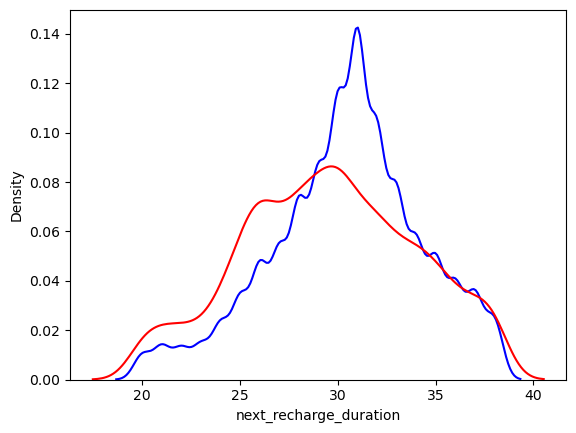

In [169]:
i = 'next_recharge_duration'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

In [170]:
max_rech_cols = [i for i in recharge_cols if re.search(r"max_rech",i)]
print(max_rech_cols)
df = df.drop(columns=max_rech_cols)

['max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8']


In [171]:
df = df.drop(['last_day_rch_amt_6',
       'last_day_rch_amt_7', 'last_day_rch_amt_8'],axis=1)

In [172]:
date_data_rech = df.columns[df.columns.str.contains(r"date_of_last_rech_data_\d{1}")]
date_data_rech 

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8'],
      dtype='object')

### To many null values
- drop columns
- A lot of customers don't seem to opt for data

In [173]:
df[date_data_rech].isnull().sum()/ len(df)

date_of_last_rech_data_6    0.749025
date_of_last_rech_data_7    0.744782
date_of_last_rech_data_8    0.736896
dtype: float64

In [174]:
df = df.drop(date_data_rech,axis=1)

In [175]:
[i for i in df.columns if re.search(r'rech',i)]

['total_rech_data_6',
 'total_rech_data_7',
 'total_rech_data_8',
 'count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'av_rech_amt_data_6',
 'av_rech_amt_data_7',
 'av_rech_amt_data_8',
 'amt_per_recharge_diff_7_6',
 'amt_per_recharge_diff_8_7',
 'amt_per_recharge_phase_drift',
 'amt_per_recharge_monthly',
 'total_recharge_amount_per_usr',
 'total_recharge_freq_per_usr',
 'prev_recharge_duration',
 'next_recharge_duration']

In [176]:
rech_data =  [i for i in recharge_cols if re.search(r"total_rech_data",i)]
rech_data

['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8']

In [177]:
df[rech_data].isnull().sum() / len(df)

total_rech_data_6    0.749025
total_rech_data_7    0.744782
total_rech_data_8    0.736896
dtype: float64

In [178]:
# df['data_opted'] = np.where(df[rech_data].isnull().sum(axis=1) < 3 ,1,0)

In [179]:
# df = df.drop(rech_data,axis=1)

In [180]:
count_rech_data = [i for i in df.columns if re.search(r'^count_rech_[2-3]g',i)]
count_rech_data

['count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8']

In [181]:
avg_rech_data = [i for i in df.columns if re.search(r'^av_rech_amt',i)]
avg_rech_data

['av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8']

In [182]:
df[avg_rech_data] = df[avg_rech_data].fillna(0)
df[rech_data] = df[rech_data].fillna(0)

In [183]:
df = df.drop(columns=['count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8'])

In [184]:
df[rech_data].sum()

total_rech_data_6    43351.0
total_rech_data_7    47878.0
total_rech_data_8    48850.0
dtype: float64

In [185]:
df[rech_data].describe(np.linspace(.75,1,25))

,total_rech_data_6,total_rech_data_7,total_rech_data_8
count,69999.000000,69999.000000,69999.000000
mean,0.619309,0.683981,0.697867
std,1.762010,1.943193,1.973434
min,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000
76.0%,1.000000,1.000000,1.000000
77.1%,1.000000,1.000000,1.000000
78.1%,1.000000,1.000000,1.000000
79.2%,1.000000,1.000000,1.000000


In [186]:
df['data_per_recharge_monthly'] = (df[avg_rech_data].fillna(0).sum(axis=1) / df[rech_data].fillna(0).sum(axis=1)).fillna(0)

In [187]:
for amt,freq in zip(avg_rech_data,rech_data) : 
     df[f'data_per_recharge_'+ amt.split('_')[-1]] = df[amt] / df[freq]

In [188]:
data_per_recharge  = [i for i in df.columns if re.search(r"data_per_recharge_[6-8]?",i)]
data_per_recharge

['data_per_recharge_monthly',
 'data_per_recharge_6',
 'data_per_recharge_7',
 'data_per_recharge_8']

In [189]:
df.groupby(['churn_probability'])[data_per_recharge].describe().T

churn_probability                           0            1
data_per_recharge_monthly count  62867.000000  7132.000000
                          mean      41.630358    33.176172
                          std       78.740257    84.331645
                          min        0.000000     0.000000
                          25%        0.000000     0.000000
                          50%        0.000000     0.000000
                          75%       34.366667    23.000000
                          max     1555.000000  1555.000000
data_per_recharge_6       count  16057.000000  1511.000000
                          mean     116.352550   112.420594
                          std      101.074459   128.956631
                          min        0.433571     1.000000
                          25%       25.000000    25.000000
                          50%      109.400000    61.500000
                          75%      154.000000   154.000000
                          max     1555.000000  1555.000000
data_per_recharge_7       count  16694.000000  1171.000000
                          mean     115.577494   111.877763
                          std      100.144329   134.034741
                          min        0.375000     1.000000
                          25%       25.000000    25.000000
                          50%      100.666667    56.000000
                          75%      154.000000   154.000000
                          max     1555.000000  1555.000000
data_per_recharge_8       count  17797.000000   620.000000
                          mean     113.545342   115.247918
                          std      100.729554   147.663890
                          min        0.450000     1.000000
                          25%       25.000000    23.000000
                          50%       98.000000    41.000000
                          75%      154.000000   175.000000
                          max     1555.000000  1555.000000

In [190]:
df['data_per_recharge_diff_7_6'] = df['data_per_recharge_7'].fillna(0) - df['data_per_recharge_6'].fillna(0)
df['data_per_recharge_diff_8_7'] = df['data_per_recharge_8'].fillna(0) - df['data_per_recharge_7'].fillna(0)

In [191]:
df['data_per_recharge_phase_drift'] = df['data_per_recharge_8'].fillna(0) - ((df['data_per_recharge_7'].fillna(0) + df['data_per_recharge_6'].fillna(0))/2)

<Axes: xlabel='data_per_recharge_diff_7_6', ylabel='Density'>

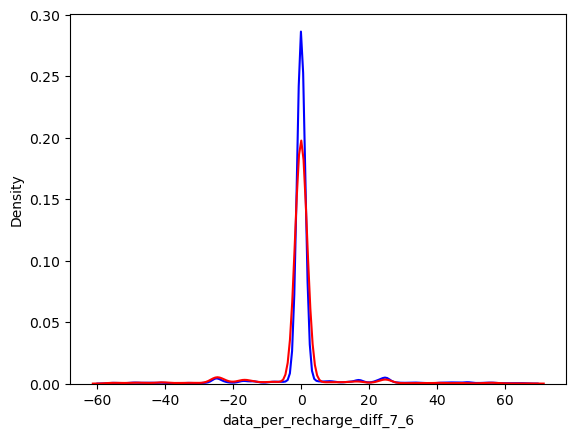

In [192]:
i = 'data_per_recharge_diff_7_6'
df2 = df.loc[(df[i] > df[i].quantile(.05)) & (df[i] < df[i].quantile(.95))]
# df2 = df.copy()
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='data_per_recharge_diff_8_7', ylabel='Density'>

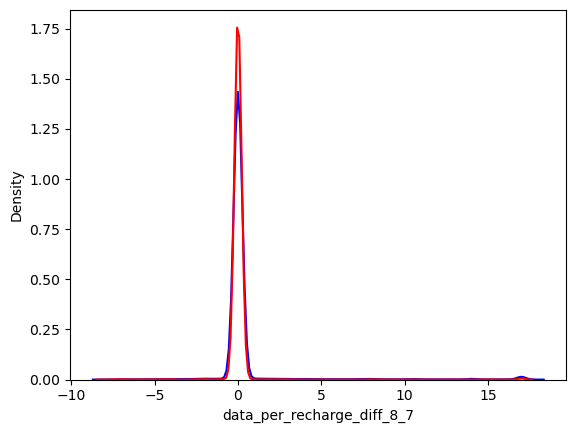

In [193]:
i = 'data_per_recharge_diff_8_7'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='data_per_recharge_phase_drift', ylabel='Density'>

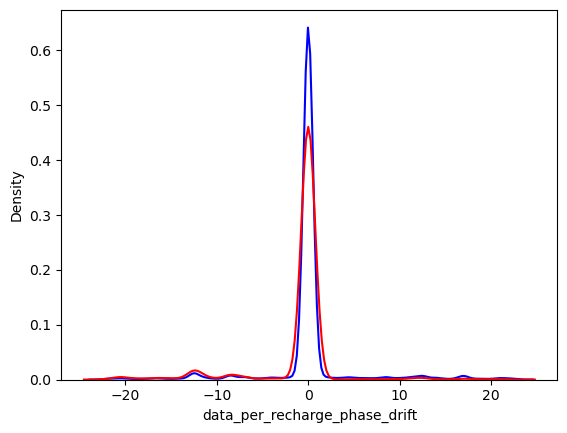

In [194]:
i = 'data_per_recharge_phase_drift'
df2 = df.loc[(df[i] > df[i].quantile(.1)) & (df[i] < df[i].quantile(.9))]
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

In [195]:
data_drop = avg_rech_data+rech_data
data_drop

['av_rech_amt_data_6',
 'av_rech_amt_data_7',
 'av_rech_amt_data_8',
 'total_rech_data_6',
 'total_rech_data_7',
 'total_rech_data_8']

In [196]:
df = df.drop(columns = data_drop)

In [197]:
df[['og_others_6', 'og_others_7', 'og_others_8', 'ic_others_6',
       'ic_others_7', 'ic_others_8']].describe()

,og_others_6,og_others_7,og_others_8,ic_others_6,ic_others_7,ic_others_8
count,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000
mean,0.462581,0.024425,0.033059,0.854063,1.019680,0.963214
std,4.768437,1.716430,2.232547,12.149144,13.225373,11.697686
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,800.890000,270.240000,394.930000,1362.940000,1495.940000,1209.860000


In [198]:
df = df.drop(columns= ['og_others_6', 'og_others_7', 'og_others_8', 'ic_others_6',
       'ic_others_7', 'ic_others_8'])

In [199]:
[i for i in df.columns if re.search(r'rech',i)]

['amt_per_recharge_diff_7_6',
 'amt_per_recharge_diff_8_7',
 'amt_per_recharge_phase_drift',
 'amt_per_recharge_monthly',
 'total_recharge_amount_per_usr',
 'total_recharge_freq_per_usr',
 'prev_recharge_duration',
 'next_recharge_duration',
 'data_per_recharge_monthly',
 'data_per_recharge_6',
 'data_per_recharge_7',
 'data_per_recharge_8',
 'data_per_recharge_diff_7_6',
 'data_per_recharge_diff_8_7',
 'data_per_recharge_phase_drift']

In [200]:
df = df.drop( ['data_per_recharge_6',
 'data_per_recharge_7',
 'data_per_recharge_8'],axis=1)

# Vol Cols

In [201]:
vol_cols = [i for i in df.columns if re.search(r"vol_",i)]
vol_cols

['vol_2g_mb_6',
 'vol_2g_mb_7',
 'vol_2g_mb_8',
 'vol_3g_mb_6',
 'vol_3g_mb_7',
 'vol_3g_mb_8']

In [202]:
order_list = []
for j in [6,7,8] : 
    order_list.append([i for i in vol_cols if re.search(r'vol_[2-3]g_mb_{}'.format(j),i)])
order_list

[['vol_2g_mb_6', 'vol_3g_mb_6'],
 ['vol_2g_mb_7', 'vol_3g_mb_7'],
 ['vol_2g_mb_8', 'vol_3g_mb_8']]

In [203]:
for i,j in zip(order_list,[6,7,8]) : 
    df['vol_mb_{}'.format(j)] = df[i].sum(axis=1)

In [204]:
df = df.drop(vol_cols,axis=1)

In [205]:
vol_cols = [i for i in df.columns if re.search(r"vol_",i)]
vol_cols

['vol_mb_6', 'vol_mb_7', 'vol_mb_8']

In [206]:
df.groupby(['churn_probability'])[vol_cols].describe().T

churn_probability             0             1
vol_mb_6 count     62867.000000   7132.000000
         mean        177.931468    138.813078
         std         608.630227    589.267254
         min           0.000000      0.000000
         25%           0.000000      0.000000
         50%           0.000000      0.000000
         75%           0.000000      0.000000
         max       45735.410000  25697.930000
vol_mb_7 count     62867.000000   7132.000000
         mean        189.418671     98.690635
         std         618.187370    460.165391
         min           0.000000      0.000000
         25%           0.000000      0.000000
         50%           0.000000      0.000000
         75%           0.000000      0.000000
         max       28395.420000  15121.300000
vol_mb_8 count     62867.000000   7132.000000
         mean        201.490949     45.662672
         std         640.246096    329.932579
         min           0.000000      0.000000
         25%           0.000000      0.000000
         50%           0.000000      0.000000
         75%           6.530000      0.000000
         max       30036.200000  13444.490000

In [207]:
df['vol_mb_diff_7_6'] = df['vol_mb_7'] - df['vol_mb_6']
df['vol_mb_diff_8_7'] = df['vol_mb_8'] - df['vol_mb_7']


In [208]:
df['vol_mb_phase_drift'] = df['vol_mb_8']  - ((df['vol_mb_7'] + df['vol_mb_6'])/2)

In [209]:
df['vol_mb_monthly'] = df[vol_cols].sum(axis=1) / len(vol_cols)

In [210]:
df['mobile_data_usg_per_usr'] = df[vol_cols].sum(axis=1)

<Axes: xlabel='vol_mb_diff_7_6', ylabel='Density'>

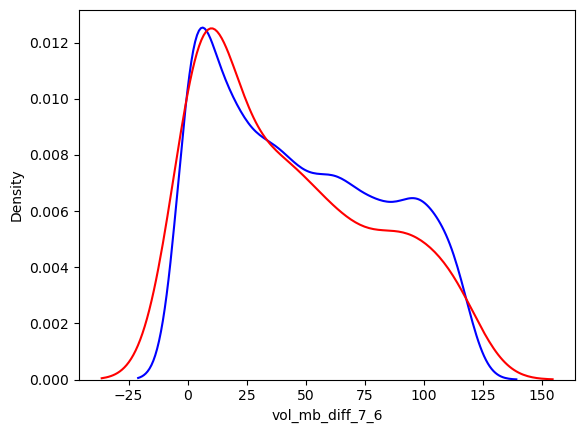

In [211]:
i = 'vol_mb_diff_7_6'
df2 = df.loc[(df[i] > df[i].quantile(.75)) & (df[i] < df[i].quantile(.9))]
# df2 = df.copy()
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='vol_mb_diff_8_7', ylabel='Density'>

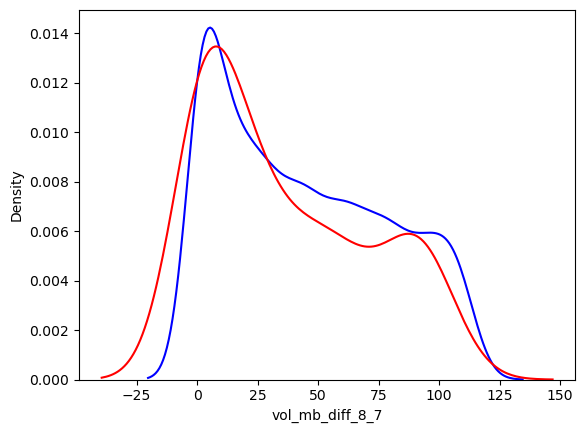

In [212]:
i = 'vol_mb_diff_8_7'
df2 = df.loc[(df[i] > df[i].quantile(.75)) & (df[i] < df[i].quantile(.9))]
# df2 = df.copy()
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

<Axes: xlabel='vol_mb_phase_drift', ylabel='Density'>

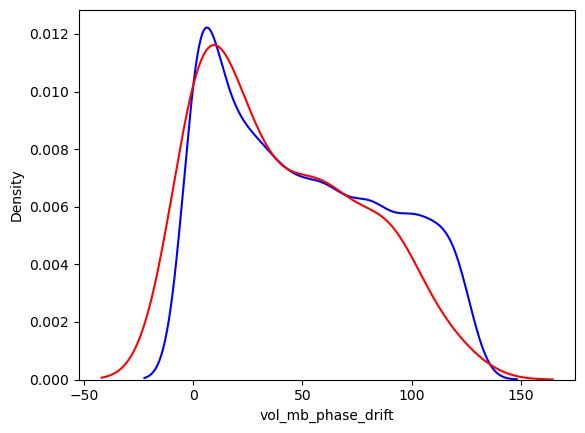

In [213]:
i = 'vol_mb_phase_drift'
df2 = df.loc[(df[i] > df[i].quantile(.75)) & (df[i] < df[i].quantile(.9))]
# df2 = df.copy()
sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,color='b')
sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,color='r')

In [214]:
df = df.drop(vol_cols,axis=1)

### Monthly Schemes

In [215]:
monthly_schemes = df.columns[df.columns.str.contains(r"^monthly")]
{i:df[i].unique() for i in monthly_schemes}

{'monthly_2g_6': array([0, 1, 2, 3, 4], dtype=int64),
 'monthly_2g_7': array([0, 1, 2, 4, 3, 5], dtype=int64),
 'monthly_2g_8': array([0, 1, 2, 4, 3, 5], dtype=int64),
 'monthly_3g_6': array([0, 1, 2, 4, 3, 5, 6, 8, 7, 9], dtype=int64),
 'monthly_3g_7': array([ 0,  1,  2,  3,  5,  4,  8,  6,  7, 16, 14,  9, 10], dtype=int64),
 'monthly_3g_8': array([ 0,  1,  2,  3,  4,  8,  5,  6,  9,  7, 16, 10], dtype=int64)}

In [216]:
monthly_6 = [i for i in monthly_schemes if re.search(r"_6$",i)]
monthly_7 = [i for i in monthly_schemes if re.search(r"_7$",i)]
monthly_8 = [i for i in monthly_schemes if re.search(r"_8$",i)]

In [217]:
df['monthly_6'] = df[monthly_6].sum(axis=1)
df['monthly_7'] = df[monthly_7].sum(axis=1)
df['monthly_8'] = df[monthly_8].sum(axis=1)

In [218]:
df = df.drop(monthly_6 + monthly_7 + monthly_8,axis=1)

In [219]:
monthly_schemes = df.columns[df.columns.str.contains(r"^monthly")]
monthly_schemes

Index(['monthly_6', 'monthly_7', 'monthly_8'], dtype='object')

In [220]:
df.groupby('churn_probability')[monthly_schemes].describe().T

churn_probability             0            1
monthly_6 count    62867.000000  7132.000000
          mean         0.159957     0.112311
          std          0.468888     0.395430
          min          0.000000     0.000000
          25%          0.000000     0.000000
          50%          0.000000     0.000000
          75%          0.000000     0.000000
          max         12.000000     7.000000
monthly_7 count    62867.000000  7132.000000
          mean         0.170328     0.080062
          std          0.500884     0.322417
          min          0.000000     0.000000
          25%          0.000000     0.000000
          50%          0.000000     0.000000
          75%          0.000000     0.000000
          max         16.000000     5.000000
monthly_8 count    62867.000000  7132.000000
          mean         0.176786     0.040381
          std          0.500202     0.229738
          min          0.000000     0.000000
          25%          0.000000     0.000000
          50%          0.000000     0.000000
          75%          0.000000     0.000000
          max         16.000000     4.000000

In [221]:
df['total_monthly_schemes_per_usr'] = df[monthly_schemes].sum(axis=1) 

### Sachet Schemes

In [222]:
sachet_schemes = df.columns[df.columns.str.contains(r"^sachet")]
{i:df[i].unique() for i in sachet_schemes}

{'sachet_2g_6': array([ 0,  7,  1,  3, 10,  2,  4, 11,  6,  8,  5,  9, 12, 13, 15, 20, 21,
        42, 14, 16, 22, 25, 19, 18, 30, 28, 17, 24, 32, 34], dtype=int64),
 'sachet_2g_7': array([ 0,  6,  2,  1,  3, 11,  5,  4,  9,  7,  8, 10, 13, 17, 12, 18, 15,
        14, 32, 16, 19, 48, 26, 20, 30, 23, 22, 21, 25, 27, 24, 35, 42],
       dtype=int64),
 'sachet_2g_8': array([ 0,  6,  1,  2,  5,  3,  4, 10,  7, 14, 16,  8,  9, 12, 13, 21, 11,
        22, 15, 20, 23, 31, 24, 18, 17, 44, 19, 32, 27, 29, 25, 34],
       dtype=int64),
 'sachet_3g_6': array([ 0,  3,  1,  2,  4,  7,  6, 16,  5, 11,  9, 10, 13, 17, 14,  8, 19,
        18, 23, 22, 15, 29, 12], dtype=int64),
 'sachet_3g_7': array([ 0,  1,  4,  2,  7,  5,  6,  3,  9, 15, 11,  8, 12, 13, 24, 18, 10,
        17, 20, 14, 33, 22, 31, 19, 16, 21], dtype=int64),
 'sachet_3g_8': array([ 0,  1,  6,  5,  2,  8,  3,  7,  4, 41,  9, 10, 11, 16, 29, 15, 13,
        18, 12, 20, 23, 19, 14, 21, 17, 30, 25, 38], dtype=int64)}

In [223]:
sachet_6 = [i for i in sachet_schemes if re.search(r"_6$",i)]
sachet_7 = [i for i in sachet_schemes if re.search(r"_7$",i)]
sachet_8 = [i for i in sachet_schemes if re.search(r"_8$",i)]

In [224]:
df['sachet_6'] = df[sachet_6].sum(axis=1)
df['sachet_7'] = df[sachet_7].sum(axis=1)
df['sachet_8'] = df[sachet_8].sum(axis=1)

In [225]:
df = df.drop(sachet_6 + sachet_7 + sachet_8,axis=1)
sachet_schemes = df.columns[df.columns.str.contains(r"^sachet")]
sachet_schemes

Index(['sachet_6', 'sachet_7', 'sachet_8'], dtype='object')

In [226]:
df.groupby('churn_probability')[sachet_schemes].describe().T

churn_probability             0            1
sachet_6 count     62867.000000  7132.000000
         mean          0.469595     0.416713
         std           1.715999     1.590690
         min           0.000000     0.000000
         25%           0.000000     0.000000
         50%           0.000000     0.000000
         75%           0.000000     0.000000
         max          61.000000    34.000000
sachet_7 count     62867.000000  7132.000000
         mean          0.543735     0.338755
         std           1.921314     1.535426
         min           0.000000     0.000000
         25%           0.000000     0.000000
         50%           0.000000     0.000000
         75%           0.000000     0.000000
         max          54.000000    42.000000
sachet_8 count     62867.000000  7132.000000
         mean          0.581259     0.127033
         std           1.998909     0.800619
         min           0.000000     0.000000
         25%           0.000000     0.000000
         50%           0.000000     0.000000
         75%           0.000000     0.000000
         max          60.000000    32.000000

In [227]:
df['total_sachet_schemes_per_usr'] = df[sachet_schemes].sum(axis=1) 

In [228]:
binary_schemes = df.columns[df.columns.str.contains(r"^(fb|night)")]
{i:df[i].unique() for i in binary_schemes}

{'night_pck_user_6': array([nan,  0.,  1.]),
 'night_pck_user_7': array([nan,  0.,  1.]),
 'night_pck_user_8': array([nan,  0.,  1.]),
 'fb_user_6': array([nan,  1.,  0.]),
 'fb_user_7': array([nan,  1.,  0.]),
 'fb_user_8': array([nan,  1.,  0.])}

In [229]:
df[binary_schemes].isnull().sum()

night_pck_user_6    52431
night_pck_user_7    52134
night_pck_user_8    51582
fb_user_6           52431
fb_user_7           52134
fb_user_8           51582
dtype: int64

- It seems that night_pck_users and fb_users are only eligible for these schemes if they have either of monthly and sachet schemes
- This is also seems to be in-line with nulls in the mobile data related columns
- This goes to show that people who didn't opt for data are given nulls in the mobile data related cols
- Lets create a missing indicator column for identifying if the customer opted for null or not
- Since we will be using ensemble techniques (decision trees) , there is no need to one-hot encode the columns

In [230]:
df.loc[df['night_pck_user_6'].notnull(),['monthly_6','sachet_6']].sum(axis=1).astype('bool').unique()

array([ True])

In [231]:
df.loc[df['night_pck_user_6'].isnull(),['monthly_6','sachet_6']].sum(axis=1).astype('bool').unique()

array([False])

In [232]:
df.loc[df['fb_user_7'].notnull(),['monthly_7','sachet_7']].sum(axis=1).astype('bool').unique()

array([ True])

In [233]:
df.loc[df['fb_user_7'].isnull(),['monthly_7','sachet_7']].sum(axis=1).astype('bool').unique()

array([False])

In [234]:
df['missing_indicator_mobile_data_jun'] = np.where(df['night_pck_user_6'].isnull(),1,0)
df['missing_indicator_mobile_data_jul'] = np.where(df['night_pck_user_7'].isnull(),1,0)
df['missing_indicator_mobile_data_aug'] = np.where(df['night_pck_user_8'].isnull(),1,0)

In [235]:
df[binary_schemes] = df[binary_schemes].fillna(0)

In [236]:
df[['aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g']].isnull().sum()

aug_vbc_3g    0
jul_vbc_3g    0
jun_vbc_3g    0
dtype: int64

In [237]:
df.groupby(['churn_probability'])[['aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g']].describe().T

churn_probability             0            1
aug_vbc_3g count   62867.000000  7132.000000
           mean       73.827215    17.700251
           std       278.435244   160.444922
           min         0.000000     0.000000
           25%         0.000000     0.000000
           50%         0.000000     0.000000
           75%         0.000000     0.000000
           max     12916.220000  8214.950000
jul_vbc_3g count   62867.000000  7132.000000
           mean       69.554308    34.039739
           std       274.908446   192.625863
           min         0.000000     0.000000
           25%         0.000000     0.000000
           50%         0.000000     0.000000
           75%         0.000000     0.000000
           max      9165.600000  4908.270000
jun_vbc_3g count   62867.000000  7132.000000
           mean       62.032521    42.836966
           std       261.031637   220.136454
           min         0.000000     0.000000
           25%         0.000000     0.000000
           50%         0.000000     0.000000
           75%         0.000000     0.000000
           max     11166.210000  6931.810000

In [238]:
vbc_monthly = ['aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g']
df['total_vbc_per_usr'] = df[vbc_monthly].sum(axis=1)
df['vbc_monthly'] = df['total_vbc_per_usr'] / len(vbc_monthly)

In [239]:
df['vbc_diff_7_6'] = df['jul_vbc_3g'] - df['jun_vbc_3g']
df['vbc_diff_8_7'] = df['aug_vbc_3g'] - df['jul_vbc_3g']

In [240]:
df = df.drop(columns=['aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g'])

In [241]:
df.columns

Index(['id', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'fb_user_6', 'fb_user_7', 'fb_user_8', 'aon', 'churn_probability',
       'total_arpu_monthly', 'arpu_diff_7_6', 'arpu_diff_8_7',
       'total_revenue_per_usr', 'arpu_avg_7_6', 'arpu_phase_drift',
       'missing_indicator_mins_per_usg_jun',
       'missing_indicator_mins_per_usg_jul',
       'missing_indicator_mins_per_usg_aug', 'offnet_mou_diff_7_6',
       'offnet_mou_diff_8_7', 'onnet_mou_diff_7_6', 'onnet_mou_diff_8_7',
       'offnet_mou_phase_drift', 'onnet_mou_phase_drift', 'onnet_mou_monthly',
       'offnet_mou_monthly', 'loc_mou_diff_7_6', 'loc_mou_diff_8_7',
       'loc_mou_phase_drift', 'std_mou_diff_7_6', 'std_mou_diff_8_7',
       'std_mou_phase_drift', 'spl_mou_diff_7_6', 'spl_mou_diff_8_7',
       'spl_mou_phase_drift', 'isd_mou_diff_7_6', 'isd_mou_diff_8_7',
       'isd_mou_phase_drift', 'loc_mou_monthly', 'std_mou_monthly',
       'isd_mou_monthly', 'spl_mou_monthly', 'total_incoming_min

### Null Values Imputated
- Where ever applicable missing indicator was used to identify missing values , since there were some features with MAR values 
- There were some where zero imputation was applicabled

In [242]:
display(df.isnull().sum().to_dict())

{'id': 0,
 'night_pck_user_6': 0,
 'night_pck_user_7': 0,
 'night_pck_user_8': 0,
 'fb_user_6': 0,
 'fb_user_7': 0,
 'fb_user_8': 0,
 'aon': 0,
 'churn_probability': 0,
 'total_arpu_monthly': 0,
 'arpu_diff_7_6': 0,
 'arpu_diff_8_7': 0,
 'total_revenue_per_usr': 0,
 'arpu_avg_7_6': 0,
 'arpu_phase_drift': 0,
 'missing_indicator_mins_per_usg_jun': 0,
 'missing_indicator_mins_per_usg_jul': 0,
 'missing_indicator_mins_per_usg_aug': 0,
 'offnet_mou_diff_7_6': 0,
 'offnet_mou_diff_8_7': 0,
 'onnet_mou_diff_7_6': 0,
 'onnet_mou_diff_8_7': 0,
 'offnet_mou_phase_drift': 0,
 'onnet_mou_phase_drift': 0,
 'onnet_mou_monthly': 0,
 'offnet_mou_monthly': 0,
 'loc_mou_diff_7_6': 0,
 'loc_mou_diff_8_7': 0,
 'loc_mou_phase_drift': 0,
 'std_mou_diff_7_6': 0,
 'std_mou_diff_8_7': 0,
 'std_mou_phase_drift': 0,
 'spl_mou_diff_7_6': 0,
 'spl_mou_diff_8_7': 0,
 'spl_mou_phase_drift': 0,
 'isd_mou_diff_7_6': 0,
 'isd_mou_diff_8_7': 0,
 'isd_mou_phase_drift': 0,
 'loc_mou_monthly': 0,
 'std_mou_monthly': 0,
 '

In [243]:
df.shape

(69999, 81)

### Deal with Outliers

In [244]:
def get_dist_box(df,col_kind,x,y):
    cols = 2
    rows = np.ceil(len(col_kind)/cols).astype('int')
    fig,ax=plt.subplots(rows,cols,figsize=(x,y))
    for idx,i in enumerate(col_kind) : 
        idx1 = idx // cols
        idx2 = idx % cols
        if len(list(ax.shape)) !=1 : 
            sns.boxplot(data=df,y=i,x='churn_probability',ax=ax[idx1,idx2])
            ax[idx1,idx2].set_title(f'{i}')
        else : 
            sns.boxplot(data=df,y=i,x='churn_probability',ax=ax[idx2])
            ax[idx2].set_title(f'{i}')
    [fig.delaxes(i) for i in ax.flat if not i.has_data()]
    plt.tight_layout()
    plt.show()

In [245]:
def quantile_plot(df,col_kind,qrange = np.arange(0,1.1,0.1),label_range=np.arange(0,110,10),x=0,y=0): 
    quantile_df = df[col_kind].quantile(list(qrange)).reset_index().rename(columns = {'index' : 'quantile'})
    cols = 2
    rows = np.ceil(len(col_kind)/cols).astype('int')
    fig,ax=plt.subplots(rows,cols,figsize=(x,y))
    for idx,i in enumerate(col_kind) : 
        idx1 = idx // cols
        idx2 = idx % cols
        if len(list(ax.shape)) !=1 : 
            sns.pointplot(data=quantile_df,x='quantile',y=i,ax=ax[idx1,idx2])
            ax[idx1,idx2].set_title(f'percentile Vs {i}')
            ax[idx1,idx2].set_xticklabels(rotation=45,labels = list(label_range))
        else : 
            sns.pointplot(data=quantile_df,x='quantile',y=i,ax=ax[idx2])
            ax[idx2].set_title(f'percentile Vs {i}')
            ax[idx2,].set_xticklabels(rotation=45,labels = list(label_range))
    [fig.delaxes(i) for i in ax.flat if not i.has_data()]
    plt.tight_layout()
    plt.show()

In [246]:
def cap_outliers_iqr(df,left_limit,right_limit) : 
    return right_limit if df > right_limit else left_limit
def iqr_treatment_revised(df,col_kind,lq=.25,rq=.75) : 
#     df = df[df['churn_probability'] == 0]
    cap = {}
    for i in col_kind : 
        q1 = df[i].quantile(lq)
        q3 = df[i].quantile(rq)
        iqr = q3 - q1 
        left_limit = q1 - 1.5 * iqr
        right_limit = q3 + 1.5 * iqr
        df[i] = df[i].apply(lambda x : x if left_limit<=x<=right_limit or pd.isnull(x) else cap_outliers_iqr(x,left_limit,right_limit))
        cap[i] = [left_limit,right_limit]
#         print(df.shape)
    return df,cap

In [247]:
def cap_outliers_z(df,left_limit,right_limit) : 
    return right_limit if df > right_limit else left_limit
def z_treatment_revised(df,col_kind,lq=.25,rq=.75,factor=3) : 
#     df = df[df['churn_probability'] == 0]
    cap = {}
    for i in col_kind : 
        x = df[i].mean()
        s = df[i].quantile(rq)
        left_limit = x - factor * s
        right_limit = x + factor * s 
        df[i] = df[i].apply(lambda x : x if left_limit<=x<=right_limit or pd.isnull(x) else cap_outliers_z(x,left_limit,right_limit))
        cap[i] = [left_limit,right_limit]
#         print(df.shape)
    return df,cap

In [248]:
df.columns

Index(['id', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'fb_user_6', 'fb_user_7', 'fb_user_8', 'aon', 'churn_probability',
       'total_arpu_monthly', 'arpu_diff_7_6', 'arpu_diff_8_7',
       'total_revenue_per_usr', 'arpu_avg_7_6', 'arpu_phase_drift',
       'missing_indicator_mins_per_usg_jun',
       'missing_indicator_mins_per_usg_jul',
       'missing_indicator_mins_per_usg_aug', 'offnet_mou_diff_7_6',
       'offnet_mou_diff_8_7', 'onnet_mou_diff_7_6', 'onnet_mou_diff_8_7',
       'offnet_mou_phase_drift', 'onnet_mou_phase_drift', 'onnet_mou_monthly',
       'offnet_mou_monthly', 'loc_mou_diff_7_6', 'loc_mou_diff_8_7',
       'loc_mou_phase_drift', 'std_mou_diff_7_6', 'std_mou_diff_8_7',
       'std_mou_phase_drift', 'spl_mou_diff_7_6', 'spl_mou_diff_8_7',
       'spl_mou_phase_drift', 'isd_mou_diff_7_6', 'isd_mou_diff_8_7',
       'isd_mou_phase_drift', 'loc_mou_monthly', 'std_mou_monthly',
       'isd_mou_monthly', 'spl_mou_monthly', 'total_incoming_min

In [249]:
monthly_cols = [i for i in df.columns if re.search(r'monthly$',i)]
diff_cols = [i for i in df.columns if re.search(r'diff',i)]
per_usr = [i for i in df.columns if re.search(r'_per_usr$',i)]
phase_cols = [i for i in df.columns if re.search(r'_phase_drift$',i)]

In [250]:
monthly_cols

['total_arpu_monthly',
 'onnet_mou_monthly',
 'offnet_mou_monthly',
 'loc_mou_monthly',
 'std_mou_monthly',
 'isd_mou_monthly',
 'spl_mou_monthly',
 'total_mou_monthly',
 'amt_per_recharge_monthly',
 'data_per_recharge_monthly',
 'vol_mb_monthly',
 'vbc_monthly']

In [251]:
diff_cols

['arpu_diff_7_6',
 'arpu_diff_8_7',
 'offnet_mou_diff_7_6',
 'offnet_mou_diff_8_7',
 'onnet_mou_diff_7_6',
 'onnet_mou_diff_8_7',
 'loc_mou_diff_7_6',
 'loc_mou_diff_8_7',
 'std_mou_diff_7_6',
 'std_mou_diff_8_7',
 'spl_mou_diff_7_6',
 'spl_mou_diff_8_7',
 'isd_mou_diff_7_6',
 'isd_mou_diff_8_7',
 'total_mou_diff_7_6',
 'total_mou_diff_8_7',
 'amt_per_recharge_diff_7_6',
 'amt_per_recharge_diff_8_7',
 'data_per_recharge_diff_7_6',
 'data_per_recharge_diff_8_7',
 'vol_mb_diff_7_6',
 'vol_mb_diff_8_7',
 'vbc_diff_7_6',
 'vbc_diff_8_7']

In [252]:
phase_cols

['arpu_phase_drift',
 'offnet_mou_phase_drift',
 'onnet_mou_phase_drift',
 'loc_mou_phase_drift',
 'std_mou_phase_drift',
 'spl_mou_phase_drift',
 'isd_mou_phase_drift',
 'total_mou_phase_drift',
 'amt_per_recharge_phase_drift',
 'data_per_recharge_phase_drift',
 'vol_mb_phase_drift']

In [253]:
per_usr = [i for i in per_usr if i not in ['total_monthly_schemes_per_usr',
 'total_sachet_schemes_per_usr']]
per_usr

['total_revenue_per_usr',
 'total_incoming_mins_usg_per_usr',
 'total_outgoing_mins_usg_per_usr',
 'total_mins_usg_per_usr',
 'total_recharge_amount_per_usr',
 'total_recharge_freq_per_usr',
 'mobile_data_usg_per_usr',
 'total_vbc_per_usr']

### Monthly Col Outlier Analysis

- It seems there are a lot of outliers in the Monthly Columns

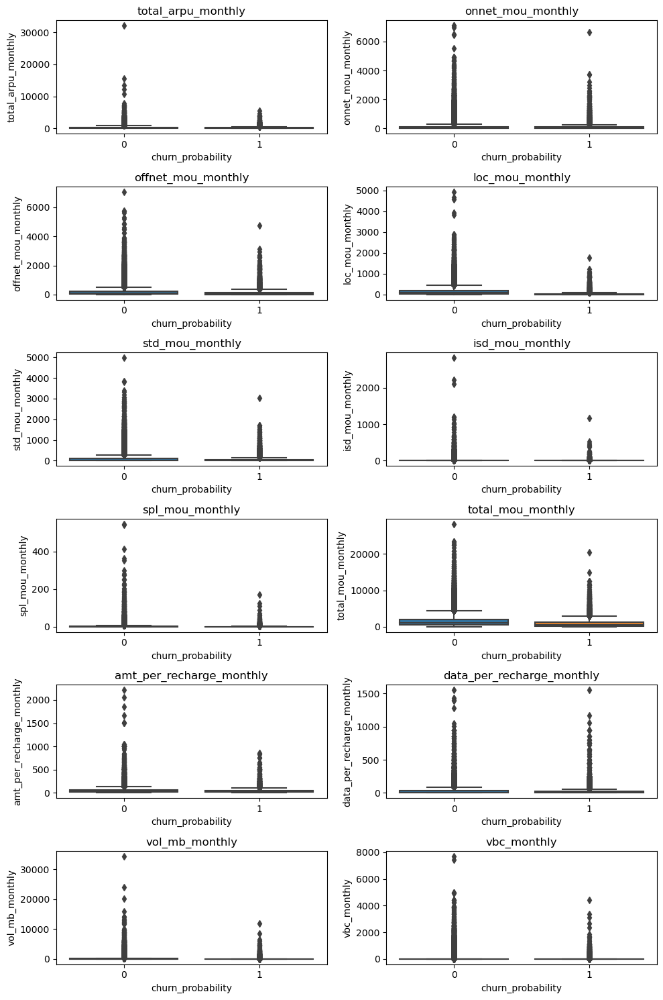

In [254]:
get_dist_box(df.copy(),monthly_cols,10,15)

- Most of the outliers seem to lie at the 99th quantile on granular analysis

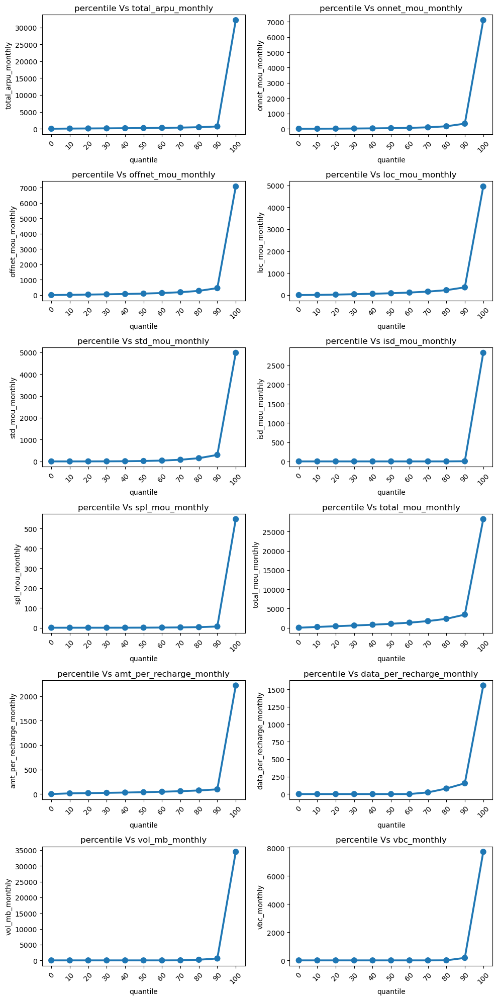

In [255]:
 quantile_plot(df,monthly_cols,np.arange(0,1.1,0.1),np.arange(0,110,10),x=10,y=20)

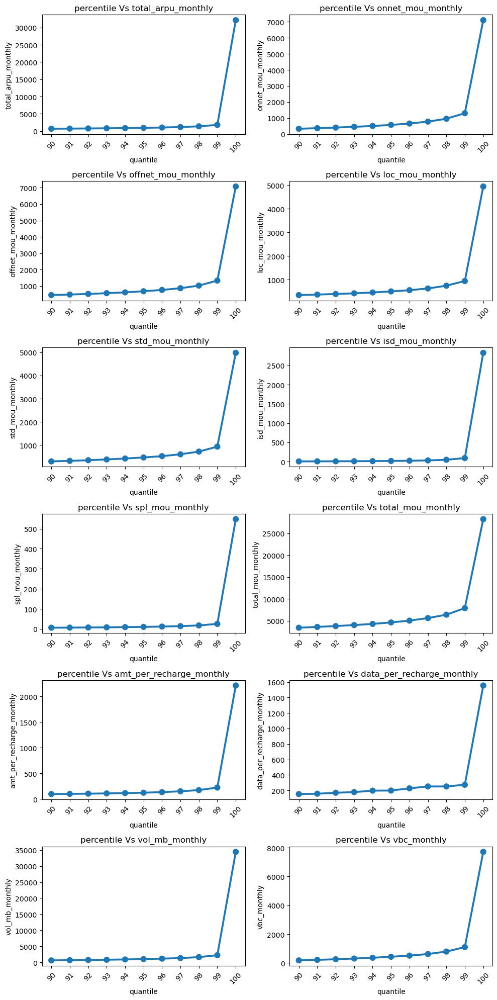

In [256]:
 quantile_plot(df,monthly_cols,np.arange(0.9,1.01,0.01),np.arange(90,101,1),x=10,y=20)

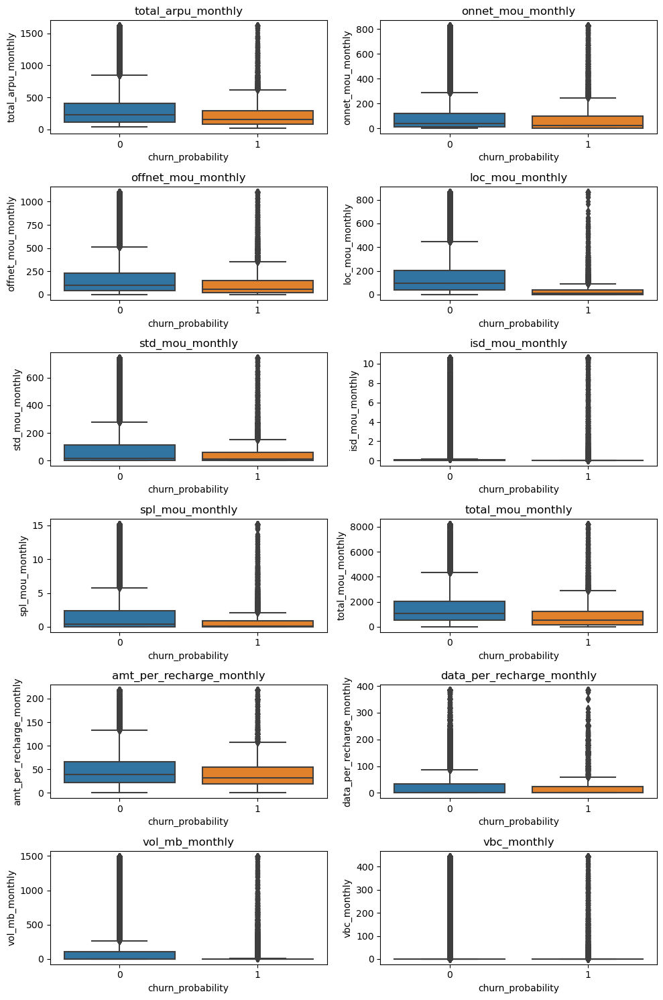

In [257]:
df2,cap_iqr_monthly = iqr_treatment_revised(df.copy(),monthly_cols,.1,.9)
get_dist_box(df2,monthly_cols,10,15)

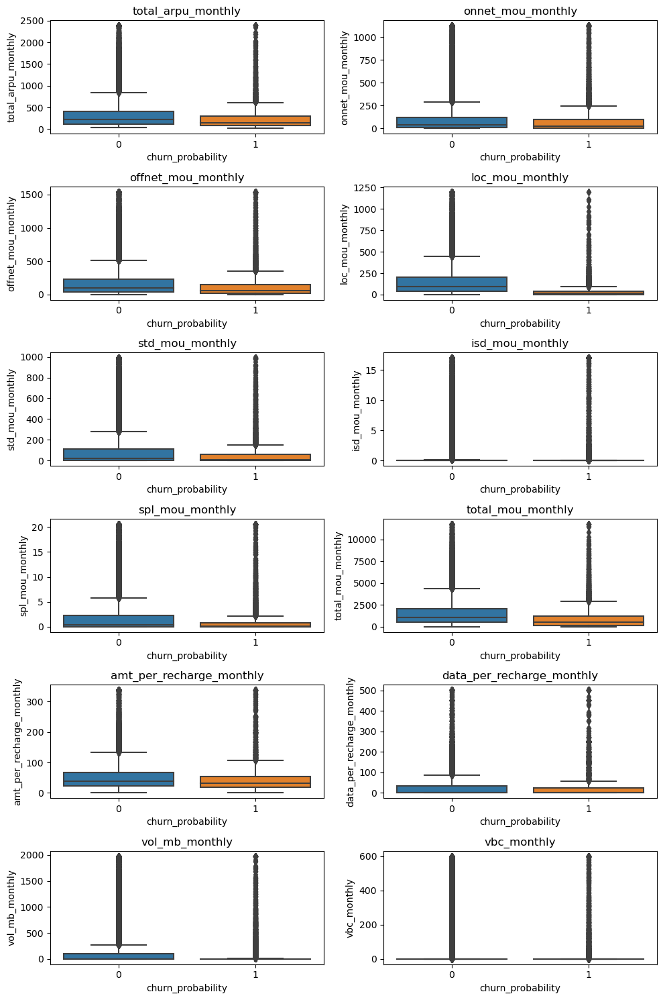

In [258]:
df3,cap_z_monthly= z_treatment_revised(df.copy(),monthly_cols,.1,.9,3)
get_dist_box(df3,monthly_cols,10,15)

In [259]:
before_capping = df.copy()

In [260]:
df = df2

In [261]:
chosen_cap_monthly = cap_iqr_monthly

### Diff Col Outlier Analysis

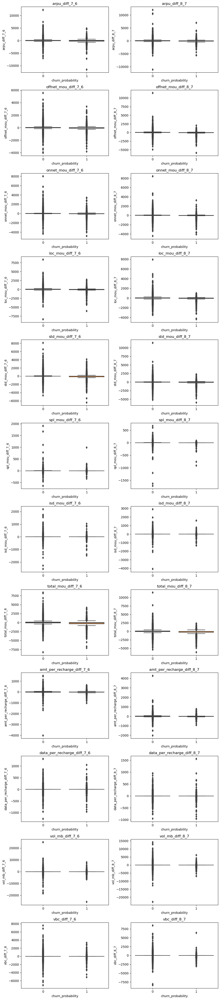

In [262]:
get_dist_box(df.copy(),diff_cols,10,45)

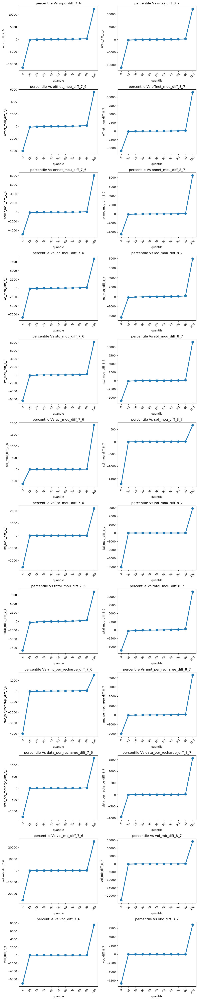

In [263]:
quantile_plot(df,diff_cols,np.arange(0,1.1,0.1),np.arange(0,110,10),x=10,y=50)

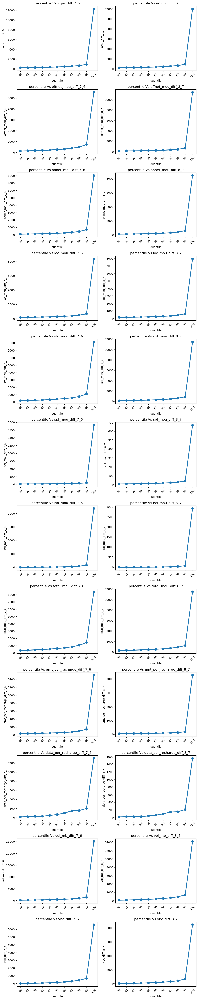

In [264]:
quantile_plot(df,diff_cols,np.arange(.9,1.01,0.01),np.arange(90,101,1),x=10,y=50)

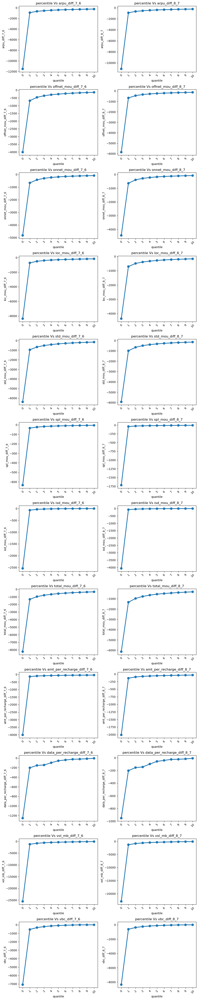

In [265]:
quantile_plot(df,diff_cols,np.arange(0.,.11,0.01),np.arange(0,11,1),x=10,y=50)

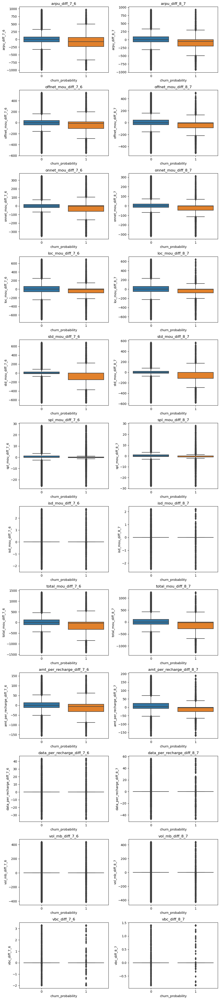

In [266]:
df2,cap_iqr_diff = iqr_treatment_revised(df.copy(),diff_cols,.1,.9)
get_dist_box(df2,diff_cols,10,45)

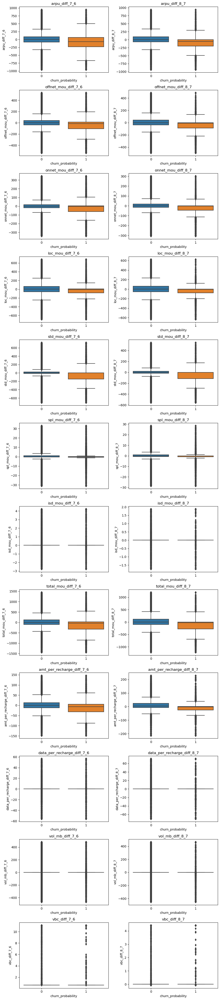

In [267]:
df3,cap_z_diff= z_treatment_revised(df.copy(),diff_cols,.1,.9,4)
get_dist_box(df3,diff_cols,10,45)

In [268]:
chosen_cap_diff = cap_iqr_diff
df = df2

### Per User  Col Outlier Analysis 

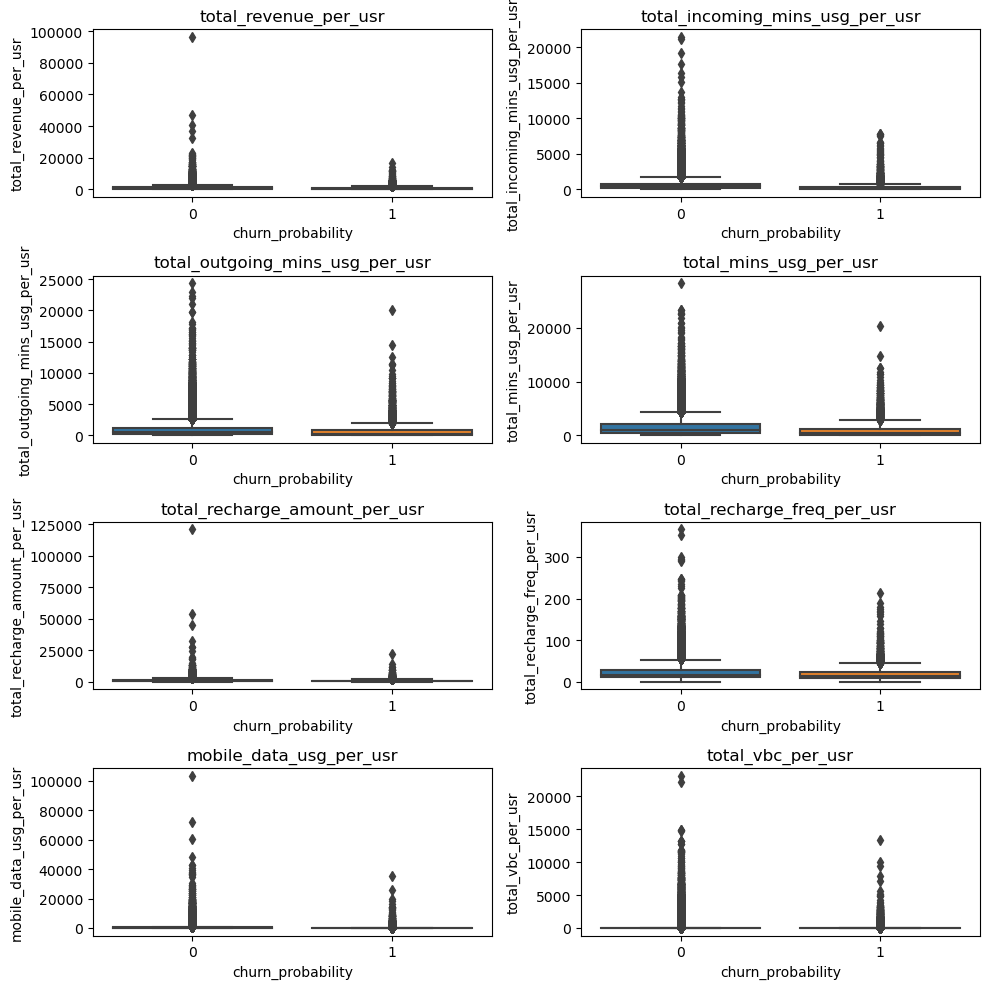

In [269]:
get_dist_box(df.copy(),per_usr,10,10)

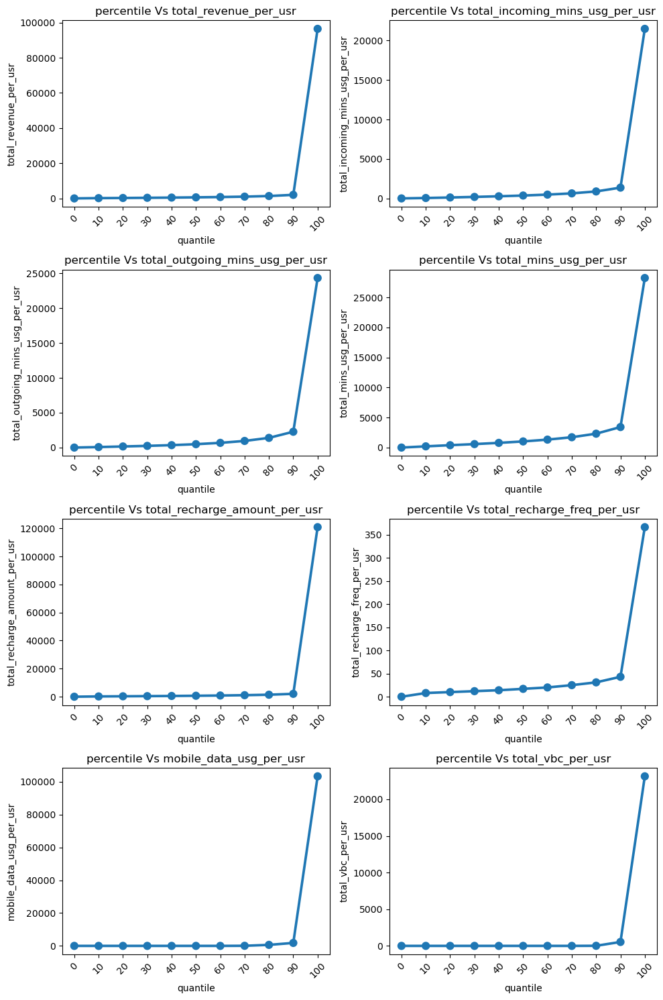

In [270]:
quantile_plot(df,per_usr,np.arange(0,1.1,0.1),np.arange(0,110,10),x=10,y=15)

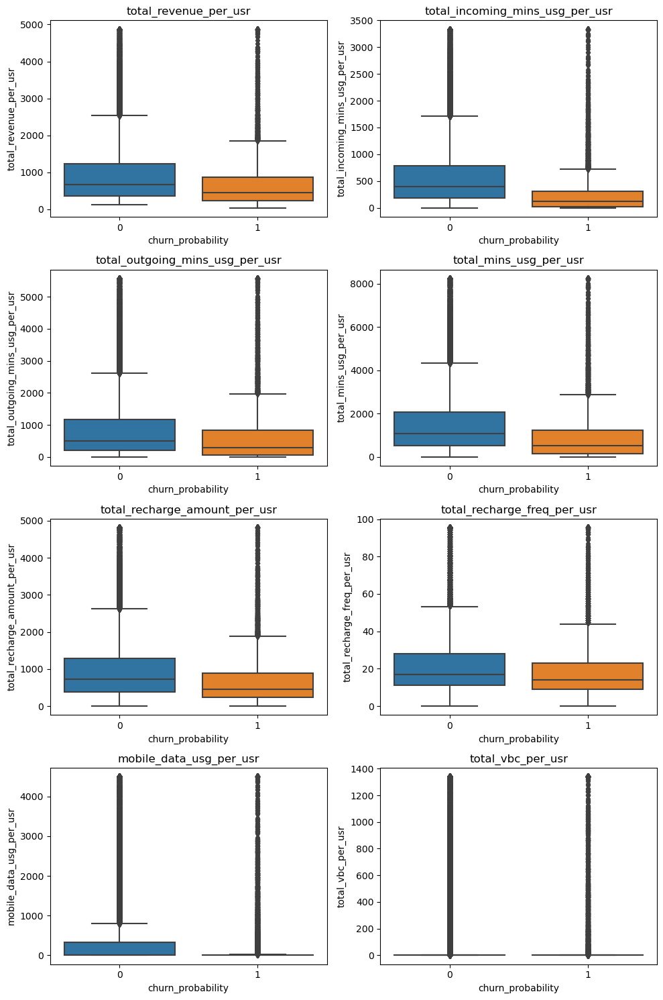

In [271]:
df2,cap_iqr_usr = iqr_treatment_revised(df.copy(),per_usr,.1,.9)
get_dist_box(df2,per_usr,10,15)

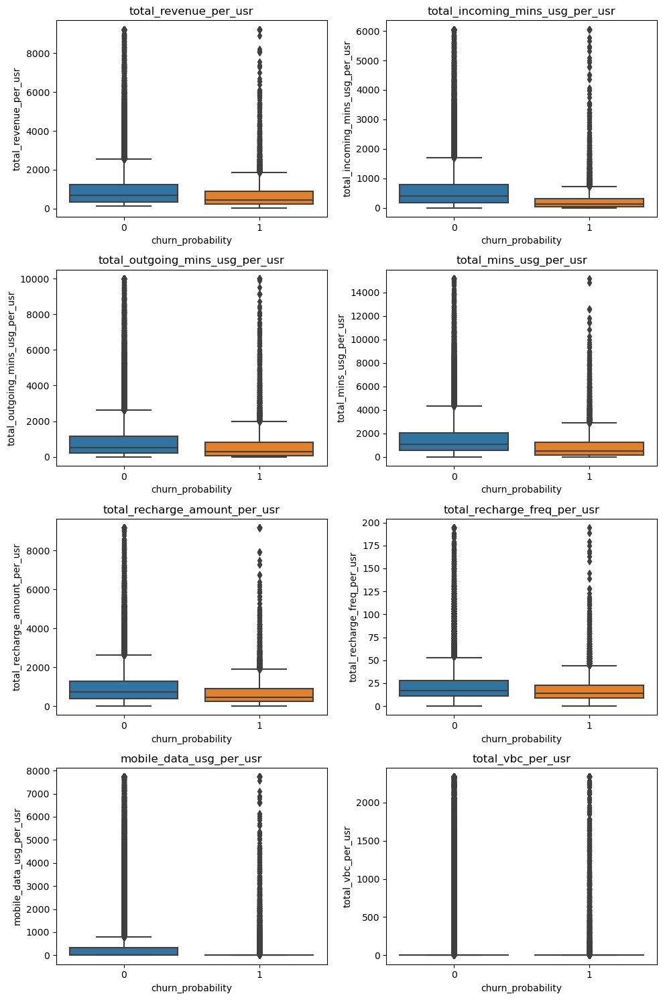

In [272]:
df3,cap_z_usr= z_treatment_revised(df.copy(),per_usr,.1,.9,4)
get_dist_box(df3,per_usr,10,15)

In [273]:
chosen_cap_usr = cap_z_usr
df = df3

### Phase Drift Cols Outlier Analysis

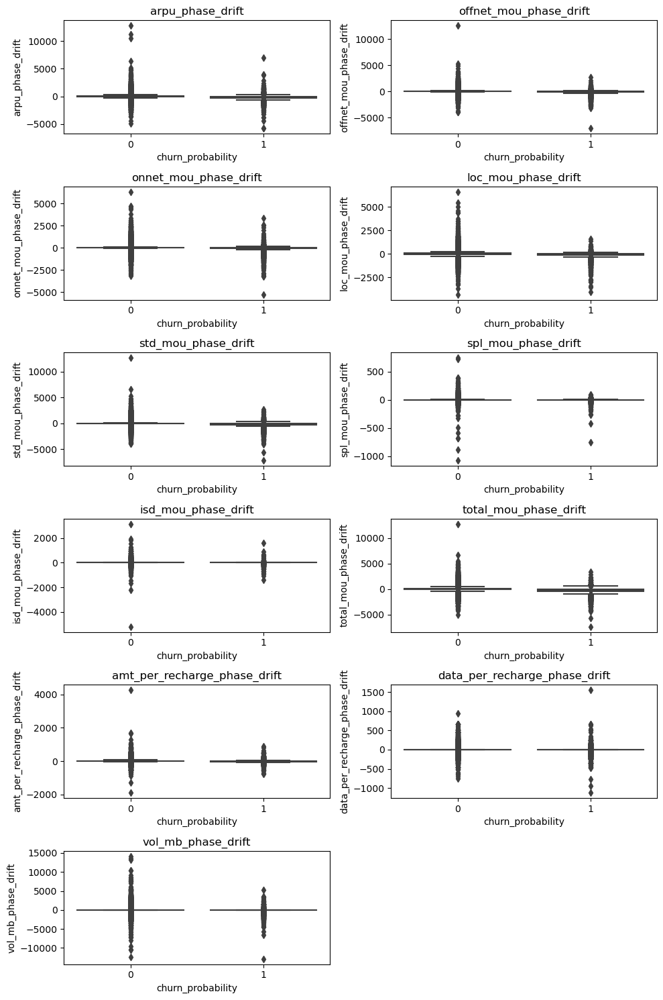

In [274]:
get_dist_box(df.copy(),phase_cols,10,15)

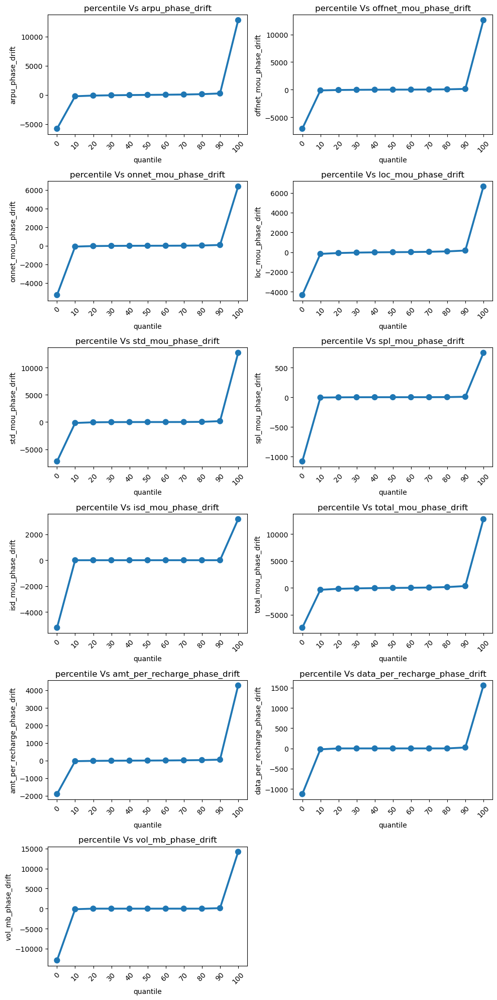

In [275]:
quantile_plot(df,phase_cols,np.arange(0,1.1,0.1),np.arange(0,110,10),x=10,y=20)

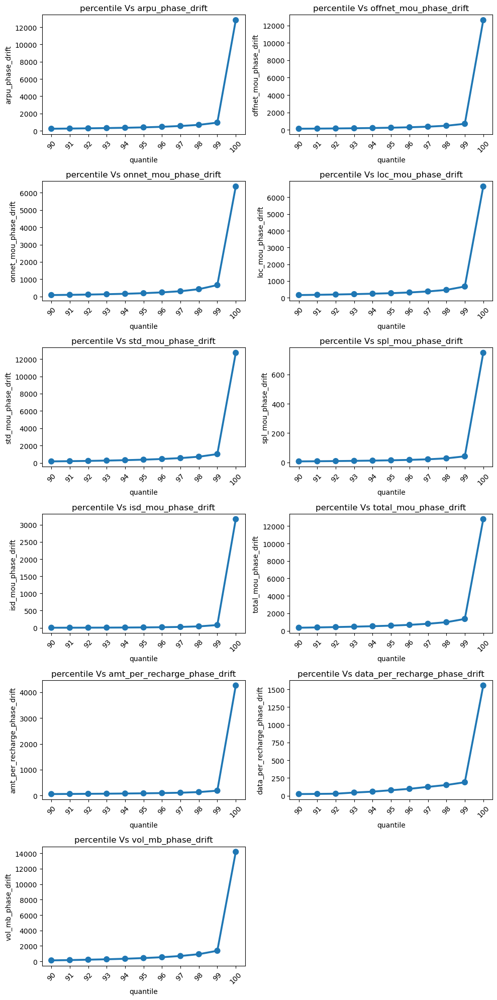

In [276]:
quantile_plot(df,phase_cols,np.arange(0.9,1.01,0.01),np.arange(90,101,1),x=10,y=20)

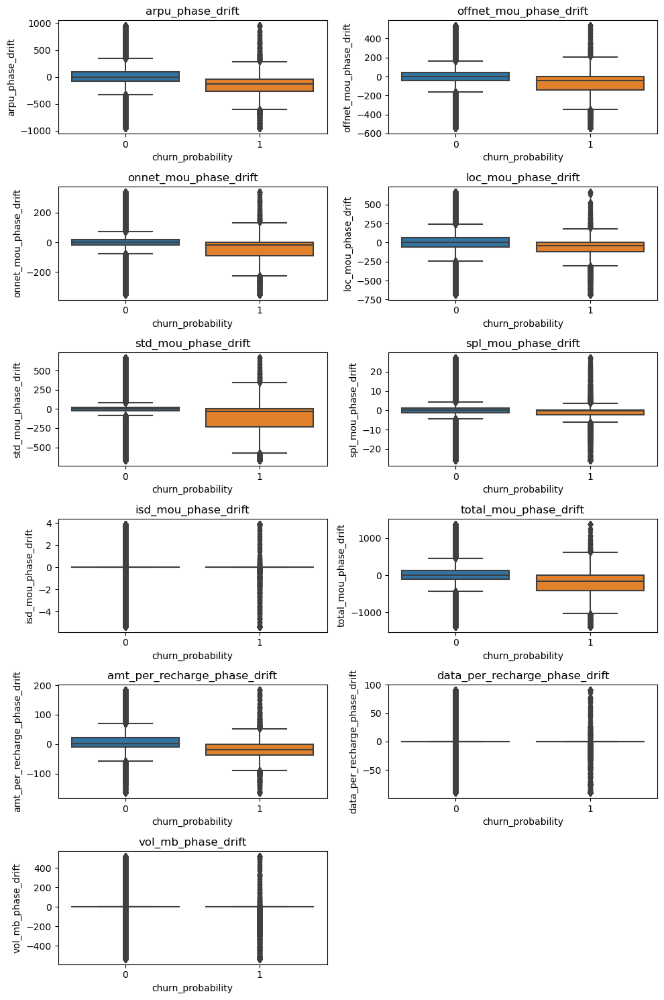

In [277]:
df2,cap_iqr_phase = iqr_treatment_revised(df.copy(),phase_cols,.1,.9)
get_dist_box(df2,phase_cols,10,15)

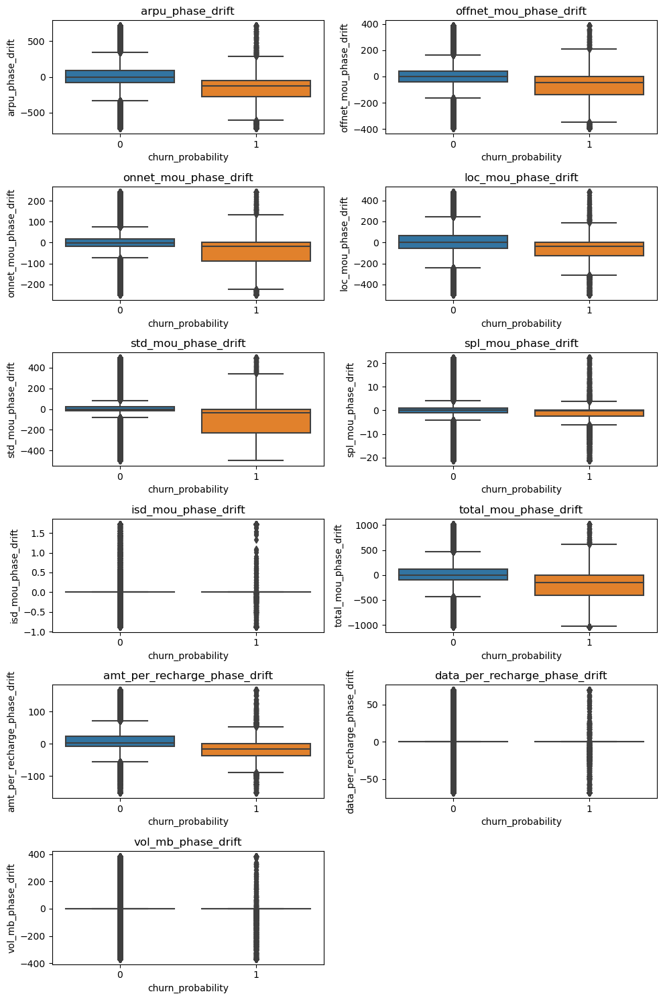

In [278]:
df3,cap_z_phase= z_treatment_revised(df.copy(),phase_cols,.1,.9,3)
get_dist_box(df3,phase_cols,10,15)

In [279]:
chosen_cap_phase = cap_z_phase
df = df3

In [280]:
cat_cols = ['monthly_6', 'monthly_7', 'monthly_8',
       'total_monthly_schemes_per_usr', 'sachet_6', 'sachet_7', 'sachet_8',
       'total_sachet_schemes_per_usr']

In [281]:
# These columns have special circumstances , it is their nature to be immensely right skewed 
df[cat_cols].describe()

,monthly_6,monthly_7,monthly_8,total_monthly_schemes_per_usr,sachet_6,sachet_7,sachet_8,total_sachet_schemes_per_usr
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,0.155102,0.161131,0.162888,0.479121,0.464207,0.522850,0.534979,1.522036
std,0.462161,0.486475,0.481444,1.223334,1.703718,1.886623,1.916431,4.851802
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,12.000000,16.000000,16.000000,34.000000,61.000000,54.000000,60.000000,151.000000


In [282]:
per_usr = [i for i in df.columns if re.search(r'_per_usr$',i)]
per_usr

['total_revenue_per_usr',
 'total_incoming_mins_usg_per_usr',
 'total_outgoing_mins_usg_per_usr',
 'total_mins_usg_per_usr',
 'total_recharge_amount_per_usr',
 'total_recharge_freq_per_usr',
 'mobile_data_usg_per_usr',
 'total_monthly_schemes_per_usr',
 'total_sachet_schemes_per_usr',
 'total_vbc_per_usr']

In [283]:
for i in per_usr : 
    ext = re.sub(r'(total_|_per_usr)','',i)
    df[ext + '_rate'] = df[i] / df['aon']
    


In [284]:
df = df.drop(per_usr,axis=1)

In [285]:
rate_cols = [i for i in df.columns if re.search(r'_rate$',i)]
rate_cols

['revenue_rate',
 'incoming_mins_usg_rate',
 'outgoing_mins_usg_rate',
 'mins_usg_rate',
 'recharge_amount_rate',
 'recharge_freq_rate',
 'mobile_data_usg_rate',
 'monthly_schemes_rate',
 'sachet_schemes_rate',
 'vbc_rate']

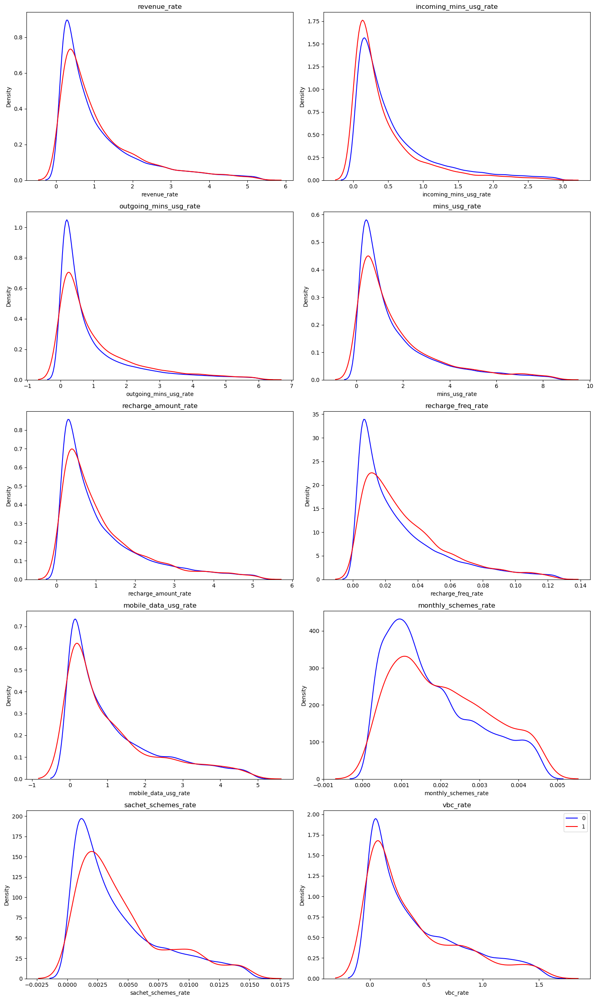

In [286]:
def rate_col_prob_dist(df2) : 
    cols = 2
    rows = np.ceil(len(rate_cols)/cols).astype('int')
    fig,ax=plt.subplots(rows,cols,figsize=(15,25))
    for idx,i in enumerate(rate_cols) : 
        idx1 = idx // cols
        idx2 = idx % cols
        df2 = df.loc[(df[i] > df[i].quantile(.05)) & (df[i] < df[i].quantile(.95))]
#         ax2 = ax[idx1,idx2].twinx()
        sns.kdeplot(data=df2[df2.churn_probability == 0],x=i,ax=ax[idx1,idx2],color='b')
        sns.kdeplot(data=df2[df2.churn_probability == 1],x=i,ax=ax[idx1,idx2],color='r')
        ax[idx1,idx2].set_title(f'{i}')
    [fig.delaxes(i) for i in ax.flat if not i.has_data()]
    plt.tight_layout()
    plt.legend('01')
    plt.show()
rate_col_prob_dist(df)

In [287]:
def bins_churn_rate_charts(df2,kind_cols,q,x,y) : 
    cols = 2
    rows = np.ceil(len(kind_cols)/cols).astype('int')
    fig,ax=plt.subplots(rows,cols,figsize=(x,y))
    for idx,i in enumerate(kind_cols) : 
#         print(i)
        idx1 = idx // cols
        idx2 = idx % cols
        df2[i + '_bins']= pd.qcut(df2[i],q=q,duplicates='drop',precision=2)
        bin_df = df2.groupby([i+'_bins'])['churn_probability'].sum().reset_index()
        bin_df["churn_percent"] = bin_df['churn_probability']/ bin_df['churn_probability'].sum()
        sns.barplot(data=bin_df,x=i+'_bins',y='churn_percent',ax=ax[idx1,idx2])
        ax[idx1,idx2].set_title(f'{i}')
        ax[idx1,idx2].set_xticks(ax[idx1,idx2].get_xticks())
        ax[idx1,idx2].tick_params(axis='x', rotation=90)
#         ax[idx1,idx2].set_xticklabels(ax[idx1,idx2].get_xticks(),rotation=90)
    [fig.delaxes(i) for i in ax.flat if not i.has_data()]
    plt.tight_layout()
    plt.show()

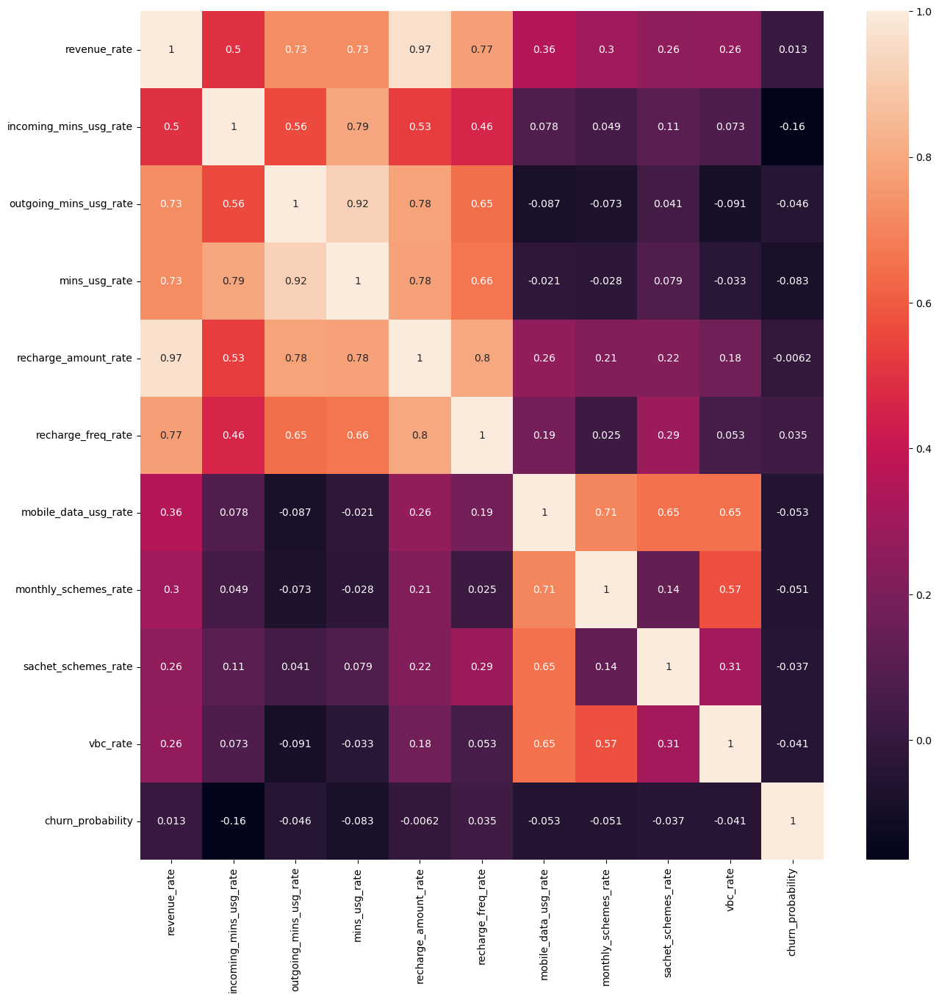

In [288]:
plt.figure(figsize=(15,15))
sns.heatmap(df[rate_cols + ['churn_probability']].corr(method='spearman'),annot=True)
plt.show()

In [289]:
df['total_mins_incoming_outgoing'] = df['incoming_mins_usg_rate'] + df['incoming_mins_usg_rate']

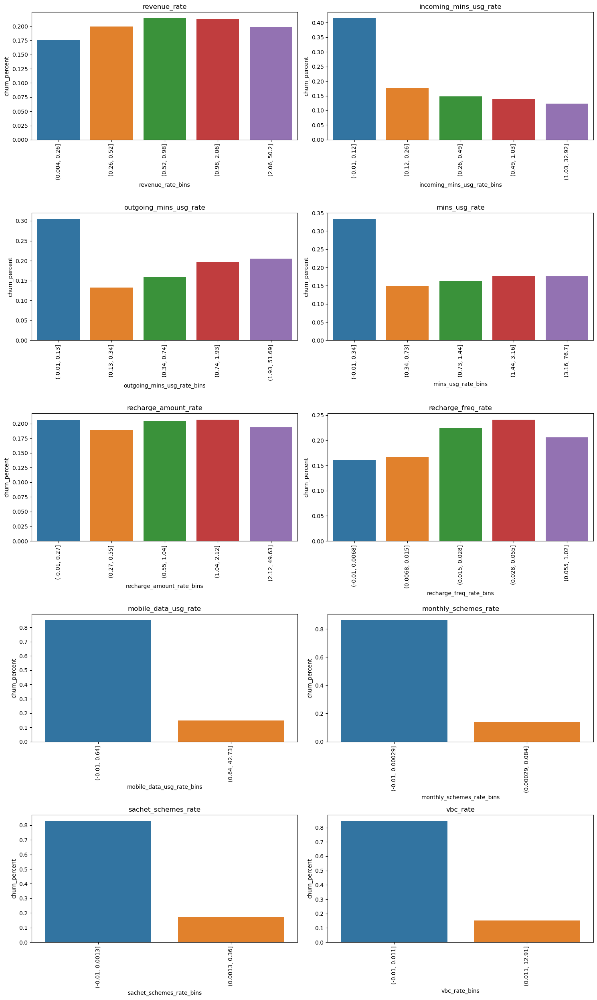

In [290]:
bins_churn_rate_charts(df.copy(),rate_cols,5,15,25)

In [291]:
# It seems the rate cols are not of much use drop them 
df = df.drop(columns = rate_cols,axis=1)

- Negative Diff has higher churn rates
- Also the diff between 8th and 7th months captures churn rate bettern than diff between the 7th and the 6th month
- This is expected because customers showing lower activity towards the end is an expected attribute of churn

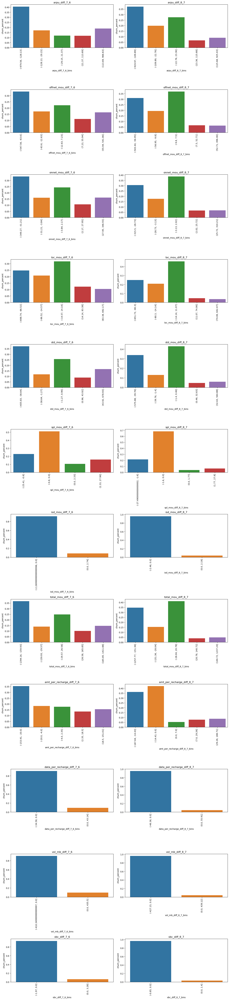

In [292]:
bins_churn_rate_charts(df.copy(),diff_cols,5,15,65)

- It is clear at a glance that as you move from higher bins to lower bins the churn rate increases
- The only expection to the rule here seems to be std calls

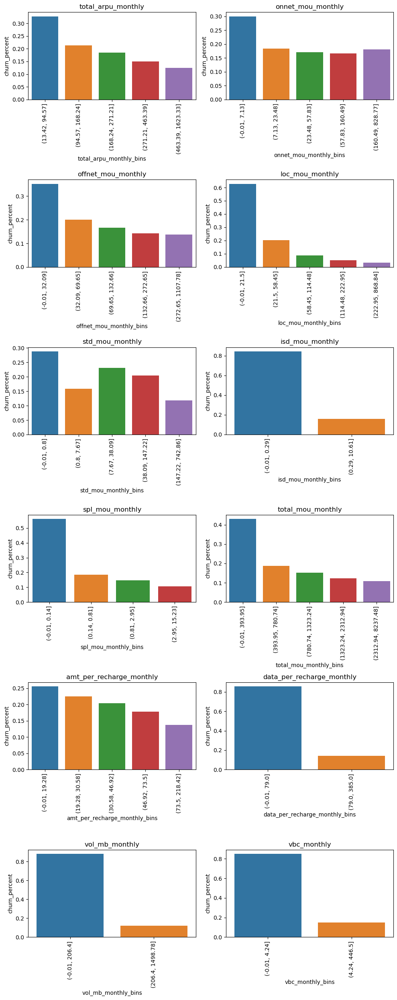

In [293]:
bins_churn_rate_charts(df.copy(),monthly_cols,5,10,25)

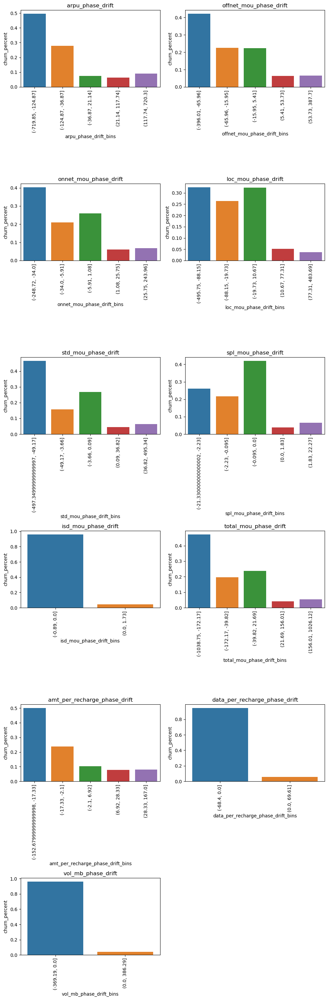

In [294]:
bins_churn_rate_charts(df.copy(),phase_cols,5,10,30)

In [295]:
cat_cols = [i for i in cat_cols if not i in ['total_monthly_schemes_per_usr','total_sachet_schemes_per_usr'] ]

- Higher the noof schemes the better a person is enrolled in the better

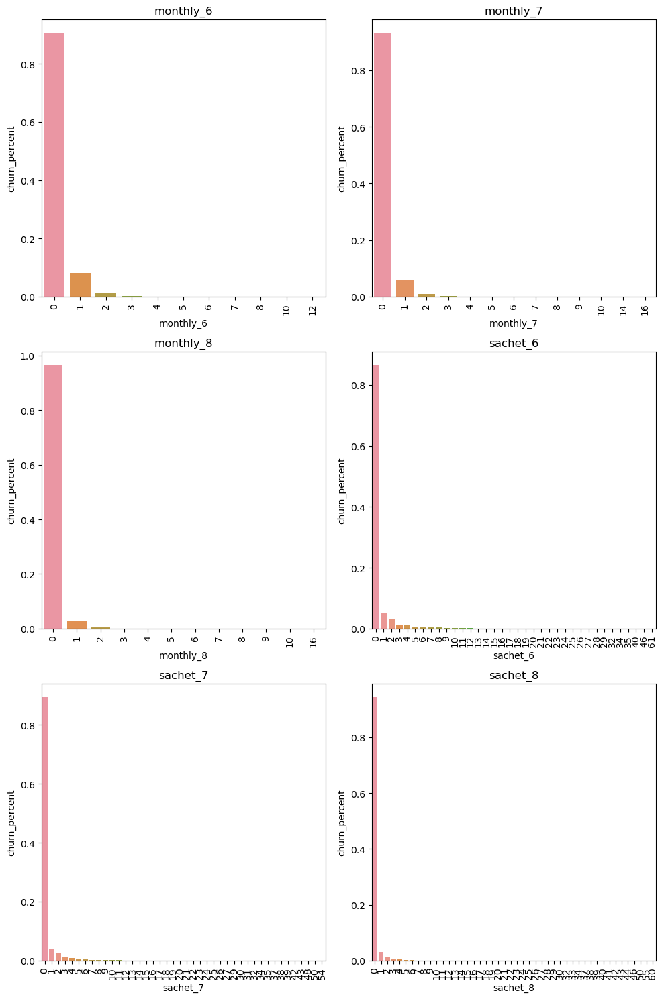

In [296]:
df2 =df.copy()
rows = np.ceil(len(cat_cols)/cols).astype('int')
fig,ax=plt.subplots(rows,cols,figsize=(10,15))
for idx,i in enumerate(cat_cols) : 
#         print(i)
    idx1 = idx // cols
    idx2 = idx % cols
    bin_df = df2.groupby([i])['churn_probability'].sum().reset_index()
    bin_df["churn_percent"] = bin_df['churn_probability']/ bin_df['churn_probability'].sum()
    sns.barplot(data=bin_df,x=i,y='churn_percent',ax=ax[idx1,idx2])
    ax[idx1,idx2].set_title(f'{i}')
    ax[idx1,idx2].set_xticks(ax[idx1,idx2].get_xticks())
    ax[idx1,idx2].tick_params(axis='x', rotation=90)
#         ax[idx1,idx2].set_xticklabels(ax[idx1,idx2].get_xticks(),rotation=90)
[fig.delaxes(i) for i in ax.flat if not i.has_data()]
plt.tight_layout()
plt.show()

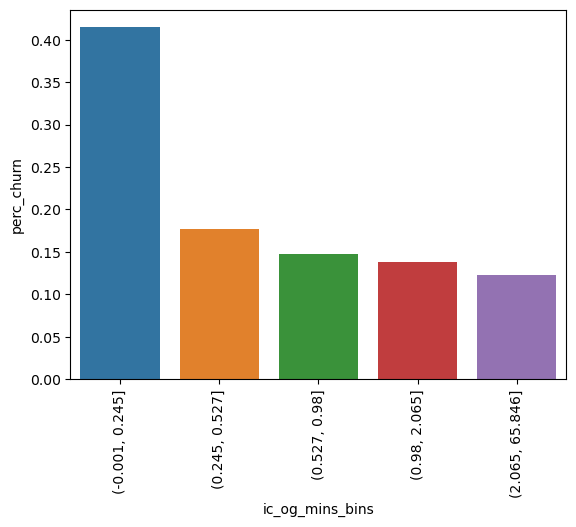

In [297]:
# As the duration of calls increases the churn rate decreases
df2 =df.copy()
df2['ic_og_mins_bins'] = pd.qcut(df2['total_mins_incoming_outgoing'],q=5)
bins_df = df2.groupby(['ic_og_mins_bins'])['churn_probability'].mean().reset_index()
bins_df['perc_churn'] = bins_df['churn_probability'] / bins_df['churn_probability'].sum()
sns.barplot(data=bins_df,x='ic_og_mins_bins',y='perc_churn')
plt.xticks(rotation=90)
plt.show()

### Identifying High Value Customers

In [298]:
pd.qcut(df['total_arpu_monthly'],q=5).value_counts(sort=False)

(13.426, 94.566]      14000
(94.566, 168.242]     14000
(168.242, 271.209]    13999
(271.209, 463.39]     14000
(463.39, 1623.328]    14000
Name: total_arpu_monthly, dtype: int64

In [299]:
pd.qcut(df['amt_per_recharge_monthly'],q=5).value_counts(sort=False)

(-0.001, 19.279]    14000
(19.279, 30.576]    14000
(30.576, 46.923]    14002
(46.923, 73.5]      14008
(73.5, 218.418]     13989
Name: amt_per_recharge_monthly, dtype: int64

In [300]:
arpu_l = 272
arpu_r=1624
rech_l=47
rech_r=219

In [301]:
df['high_value_customer']= np.where(df['total_arpu_monthly'].between(arpu_l,arpu_r) & df['amt_per_recharge_monthly'].between(rech_l,rech_r),1,0)

In [302]:
df['high_value_customer'].value_counts()

0    51695
1    18304
Name: high_value_customer, dtype: int64

- So the according to the above condition there seem to be 18,304 high value customers

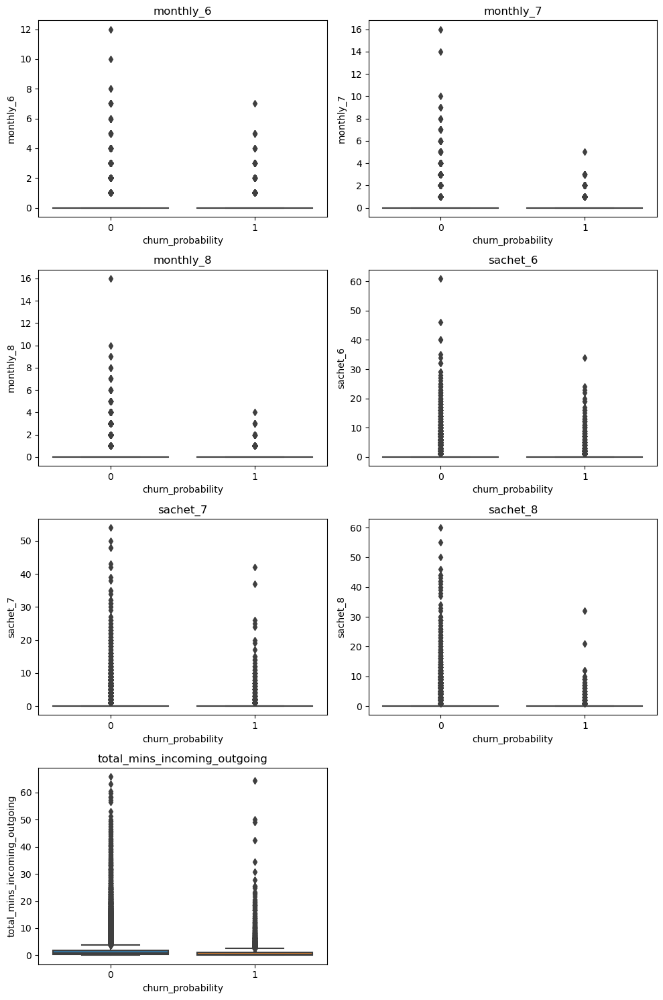

In [303]:
get_dist_box(df,cat_cols+['total_mins_incoming_outgoing'],10,15)

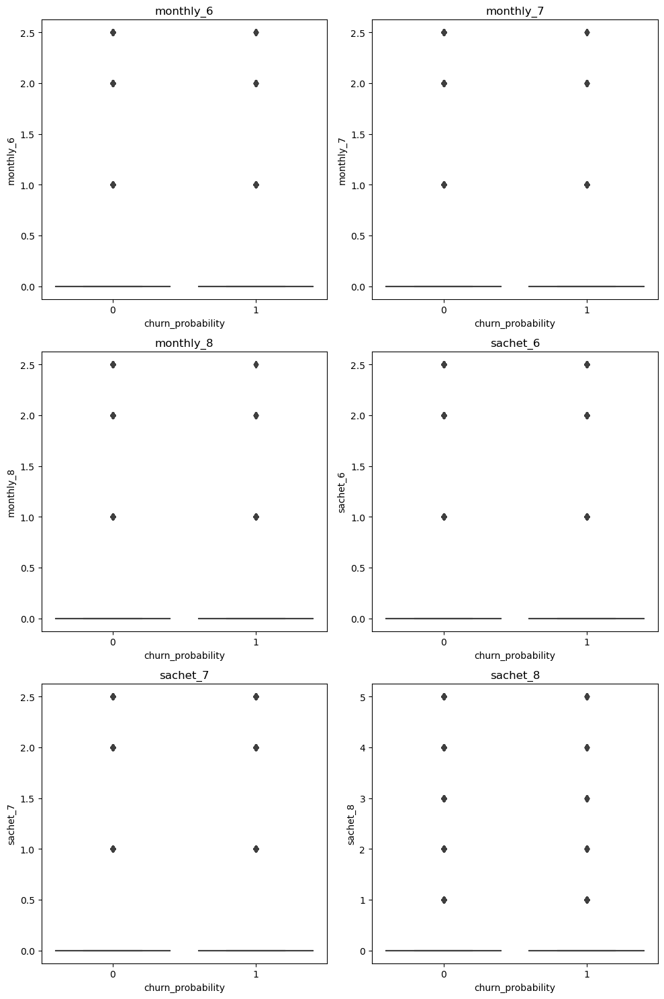

In [304]:
df2,cap_iqr_cat = iqr_treatment_revised(df.copy(),cat_cols+['total_mins_incoming_outgoing'],.1,.9)
get_dist_box(df2,cat_cols,10,15)


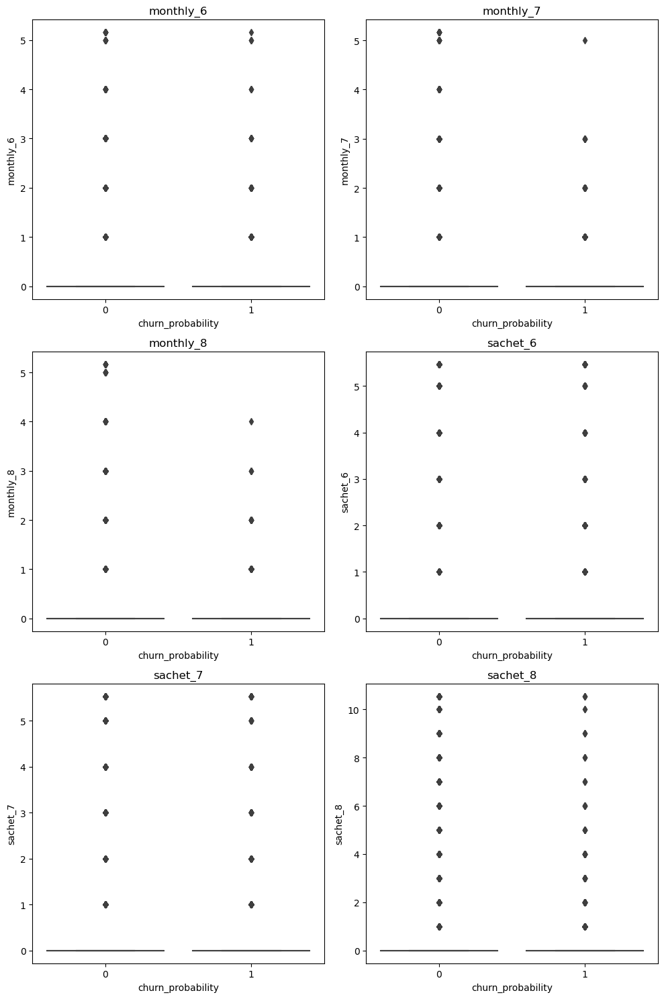

In [305]:
df3,cap_z_cat= z_treatment_revised(df.copy(),cat_cols+['total_mins_incoming_outgoing'],.1,.9,5)
get_dist_box(df3,cat_cols,10,15)

In [306]:
chosen_cap_cat = cap_iqr_cat
df = df2

In [307]:
df = df.drop(columns = 'arpu_avg_7_6')

In [308]:
y = df.pop('churn_probability')
high_value_customer = df.pop('high_value_customer')
idc = df.pop('id')
X = df.copy()

In [309]:
# idc = idc.reset_index(drop=True)
# high_value_customer = high_value_customer.reset_index(drop=True)

In [310]:
missing_indicators = [i for i in df.columns if re.search(r'^(missing_indicator|night|fb|total_mins)',i)]
numeric_cols = np.setdiff1d(df.columns,missing_indicators)

In [311]:
missing_indicators

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'missing_indicator_mins_per_usg_jun',
 'missing_indicator_mins_per_usg_jul',
 'missing_indicator_mins_per_usg_aug',
 'missing_indicator_mobile_data_jun',
 'missing_indicator_mobile_data_jul',
 'missing_indicator_mobile_data_aug',
 'total_mins_incoming_outgoing']

In [312]:
X_train,X_test,y_train,y_test  = train_test_split(X,y,train_size=0.8, random_state=100)

In [313]:
X_test_or = X_test.copy()
y_test_or = y_test.copy()

In [314]:
X_test_or.index = X_test.index
y_test_or.index = y_test.index

### Training 

In [315]:

counter = Counter(y_train)
print(counter)
# transform the dataset
oversample = SMOTE()
X_train, y_train = oversample.fit_resample(X_train, y_train)
# summarize the new class distribution
counter = Counter(y_train)
print(counter)

Counter({0: 50259, 1: 5740})
Counter({1: 50259, 0: 50259})


In [316]:
scaler = MinMaxScaler()
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
X_train_cat = X_train[missing_indicators]
X_train = X_train[numeric_cols]
X_test_cat = X_test[missing_indicators]
X_test = X_test[numeric_cols]
X_train2 = scaler.fit_transform(X_train)
X_test2 = scaler.transform(X_test )
X_train = pd.DataFrame(X_train2,columns=X_train.columns)
X_test = pd.DataFrame(X_test2,columns=X_train.columns)
X_train = pd.concat([X_train,X_train_cat],axis=1)
X_test = pd.concat([X_test,X_test_cat],axis=1)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

In [317]:
def classification_metrics(y_test,probability,tr) : 
    print(tr)
    y_pred = pd.Series(probability).apply(lambda x : 1 if x >=tr else 0)
    tn,fp,fn,tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy = (tp + tn) / (tp + tn + fn + fp)
    specificity = tn / (tn+fp)
    senstivity = tp / (tp+fn)
    precision = tp / (tp+fp)
    fpr = 1 - specificity
    f1_score = 2 * (senstivity * precision) / (senstivity + precision)
    print("True Positives : ",tp)
    print("False Negatives : " , fn)
    print("True Negatives : ",tn)
    print("False Positives : ",fp)
    print("Accuracy : ",accuracy)
    print("Specificity : " , specificity)
    print ("Senstivity : ",senstivity)
    print("Precision : ",precision)
    print("False Positive Rate : ", fpr )
    return tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred
def roc_auc_plot(senstivity_list,specificity_list) : 
    tpr_list = senstivity_list
    fpr_list = [ 1 - i for i in specificity_list]
    sns.lineplot(y=tpr_list,x=fpr_list,color='g')
    sns.lineplot(x=[0,1],y=[0,1],lw=2,linestyle='--',color='r')
    plt.show()
    auc_score = auc(fpr_list,tpr_list)
    print("Area Under the Curve : {0}".format(auc_score))
    
def threshold_plot(accuracy,pred_dir1,pred_dir2,kind) :
    metric1,metric2 = ['specificity','senstivity'] if kind == 'specificity' else ['precision','recall']
    x = np.arange(0,1.1,.1)
    fig,ax = plt.subplots(1,1)
    sns.lineplot(y=accuracy,x=x,color='r',ax=ax,label='accuracy')
    sns.lineplot(y=pred_dir1,x=x,color='b',ax=ax,label=metric1)
    sns.lineplot(y=pred_dir2,x=x,color='g',ax=ax,label=metric2)
    plt.legend(loc='upper right',bbox_to_anchor=(1.4,1))
    plt.xlabel('threshold')
    plt.ylabel('metric value')
    plt.show()
    
def threshold_lists(y_test,probability) : 
    accuracy_list = []
    specificity_list = []
    senstivity_list = []
    precision_list = []
    for tr in np.arange(0,1.1,.1) : 
        y_pred = pd.Series(probability).apply(lambda x : 1 if x >=tr else 0)
        tn,fp,fn,tp = confusion_matrix(y_test,y_pred).ravel()
        accuracy = (tp + tn) / (tp + tn + fn + fp)
        specificity = tn / (tn+fp)
        senstivity = tp / (tp+fn)
        precision = tp / (tp+fp)
        accuracy_list.append(accuracy)
        specificity_list.append(specificity)
        senstivity_list.append(senstivity)
        precision_list.append(precision)
    return accuracy_list,specificity_list,senstivity_list,precision_list
    
        
def Model_Ensemble(mdl,X_train,y_train,X_test) : 
    mdl.fit(X_train,y_train)
    y_prob = mdl.predict_proba(X_test)
    churn_probs = y_prob[:,1]
    return mdl,churn_probs
    

### Random Forest Classifier

In [318]:
rf = RandomForestClassifier()
rf,probability = Model_Ensemble(rf,X_train,y_train,X_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

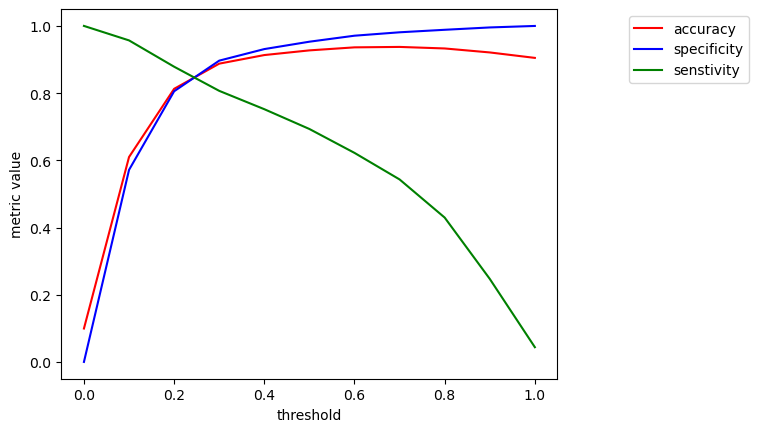

In [319]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

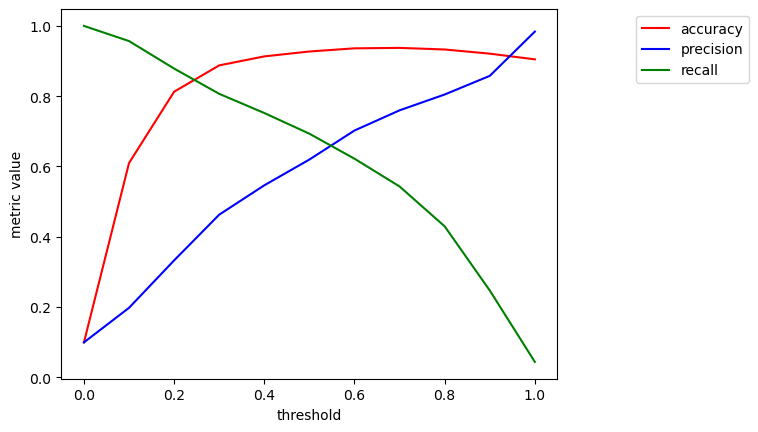

In [320]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [321]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,0.5)

0.5
True Positives :  965
False Negatives :  427
True Negatives :  12016
False Positives :  592
Accuracy :  0.9272142857142858
Specificity :  0.9530456852791879
Senstivity :  0.6932471264367817
Precision :  0.619781631342325
False Positive Rate :  0.04695431472081213


In [322]:
fimp = pd.Series(dict(zip(X_train.columns,rf.feature_importances_))).sort_values(ascending=False)

In [323]:
fimp

loc_mou_monthly                       0.100906
loc_mou_diff_8_7                      0.053968
amt_per_recharge_phase_drift          0.050979
arpu_phase_drift                      0.045456
total_mou_diff_8_7                    0.045189
                                        ...   
missing_indicator_mobile_data_jul     0.001179
missing_indicator_mins_per_usg_jun    0.000849
night_pck_user_7                      0.000224
night_pck_user_6                      0.000209
night_pck_user_8                      0.000104
Length: 69, dtype: float64

In [324]:
fimp = fimp[fimp.cumsum().diff()[(fimp.cumsum().diff() > .01) |(fimp.cumsum().diff().isnull()) ].index]

In [325]:
fimp

loc_mou_monthly                       0.100906
loc_mou_diff_8_7                      0.053968
amt_per_recharge_phase_drift          0.050979
arpu_phase_drift                      0.045456
total_mou_diff_8_7                    0.045189
total_mou_phase_drift                 0.042775
loc_mou_phase_drift                   0.035887
total_mou_monthly                     0.033303
next_recharge_duration                0.031815
std_mou_diff_8_7                      0.031494
std_mou_phase_drift                   0.027738
fb_user_8                             0.026537
missing_indicator_mins_per_usg_aug    0.023068
amt_per_recharge_diff_8_7             0.022550
total_mins_incoming_outgoing          0.020823
onnet_mou_phase_drift                 0.017604
arpu_diff_8_7                         0.017454
spl_mou_diff_8_7                      0.017106
aon                                   0.017013
spl_mou_phase_drift                   0.015209
offnet_mou_diff_8_7                   0.015035
onnet_mou_dif

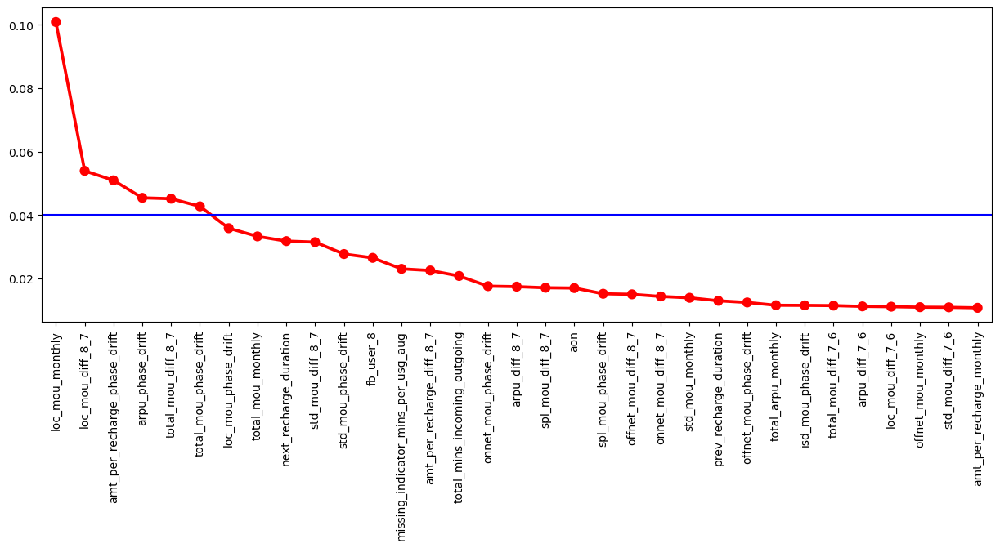

In [326]:
plt.figure(figsize=(15,5))
sns.pointplot(x=fimp.index,y=fimp,color='r')
plt.xticks(rotation=90)
plt.axhline(0.04,color='b')
plt.show()

### Xgboost

In [327]:
xgb = XGBClassifier()
xgb,probability = Model_Ensemble(xgb,X_train,y_train,X_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

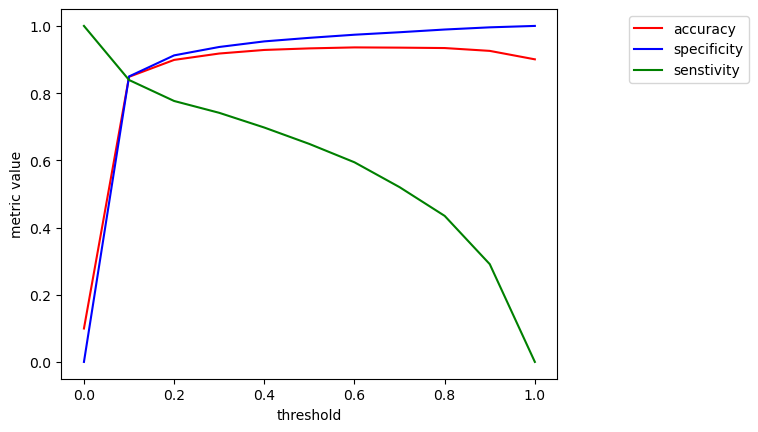

In [328]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

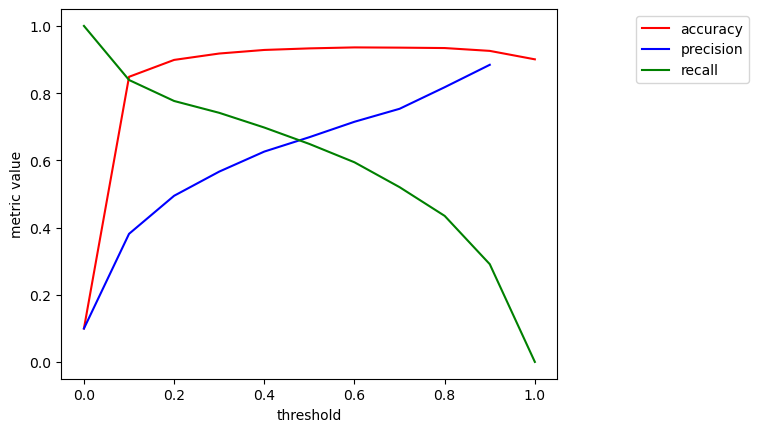

In [329]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [330]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,0.5)

0.5
True Positives :  903
False Negatives :  489
True Negatives :  12161
False Positives :  447
Accuracy :  0.9331428571428572
Specificity :  0.9645463197969543
Senstivity :  0.6487068965517241
Precision :  0.6688888888888889
False Positive Rate :  0.035453680203045734


In [331]:
fimp = pd.Series(dict(zip(X_train.columns,rf.feature_importances_))).sort_values(ascending=False)

In [332]:
fimp = fimp[fimp.cumsum().diff()[(fimp.cumsum().diff() > .01) |(fimp.cumsum().diff().isnull()) ].index]

In [333]:
fimp

loc_mou_monthly                       0.100906
loc_mou_diff_8_7                      0.053968
amt_per_recharge_phase_drift          0.050979
arpu_phase_drift                      0.045456
total_mou_diff_8_7                    0.045189
total_mou_phase_drift                 0.042775
loc_mou_phase_drift                   0.035887
total_mou_monthly                     0.033303
next_recharge_duration                0.031815
std_mou_diff_8_7                      0.031494
std_mou_phase_drift                   0.027738
fb_user_8                             0.026537
missing_indicator_mins_per_usg_aug    0.023068
amt_per_recharge_diff_8_7             0.022550
total_mins_incoming_outgoing          0.020823
onnet_mou_phase_drift                 0.017604
arpu_diff_8_7                         0.017454
spl_mou_diff_8_7                      0.017106
aon                                   0.017013
spl_mou_phase_drift                   0.015209
offnet_mou_diff_8_7                   0.015035
onnet_mou_dif

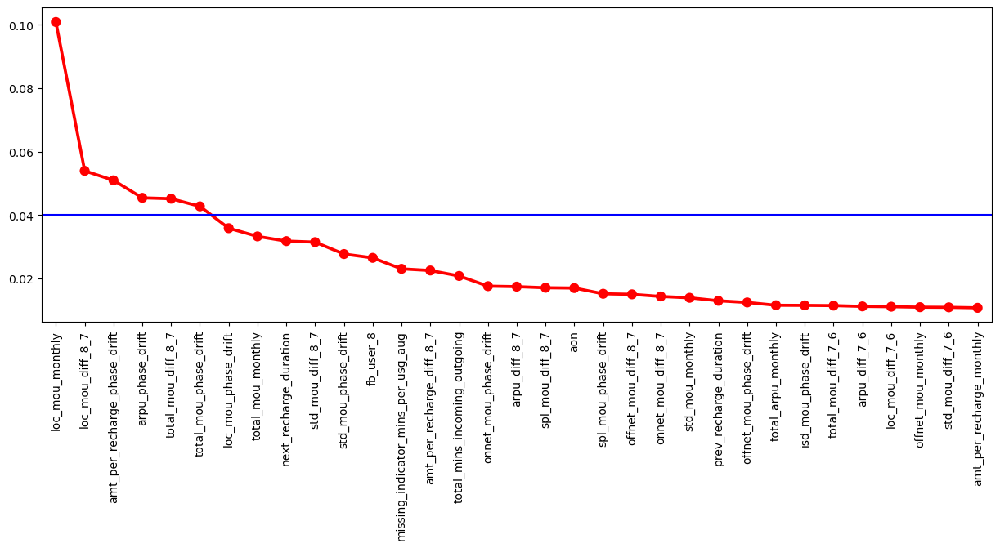

In [334]:
plt.figure(figsize=(15,5))
sns.pointplot(x=fimp.index,y=fimp,color='r')
plt.xticks(rotation=90)
plt.axhline(0.04,color='b')
plt.show()

In [335]:
# def rfe_method(X_train,y_train,n) : 
#     estimator  = RandomForestClassifier()
#     rfe_feature_selection  = RFE(estimator, n_features_to_select=n, step=1)
#     rfe_feature_selection = rfe_feature_selection.fit(X_train,y_train)
#     rankings = rfe_feature_selection.ranking_
#     support  = rfe_feature_selection.support_
#     rfe_df = pd.DataFrame(data= {'features' : X_train.columns,'support' : support,'ranking' : rankings,})
#     return rfe_df.sort_values(['ranking']),support

In [336]:
# rfe_method(X_train,y_train,40)

In [337]:
# col_list = X_train.columns[[ True,  True,  True,  True,  True,  True,  True,  True,  True,
#          True,  True,  True,  True,  True,  True, False, False,  True,
#          True,  True,  True,  True,  True,  True,  True,  True, False,
#          True,  True,  True,  True,  True,  True,  True,  True,  True,
#          True,  True,  True,  True,  True,  True, False,  True,  True,
#         False, False, False,  True,  True,  True, False, False,  True,
#         False, False, False]]

In [338]:
# col_list = fimp[fimp < .93].index

### Principal Component Analysis - Dimensionality Reduction

In [339]:
pca = PCA()
pca.fit(X_train[numeric_cols])

PCA()

In [340]:
skree_df = pd.DataFrame(pca.explained_variance_ratio_).cumsum()
skree_df

,0
0,0.138354
1,0.241754
2,0.326622
3,0.394136
4,0.453675
5,0.503886
6,0.546027
7,0.583233
8,0.616691
9,0.644757


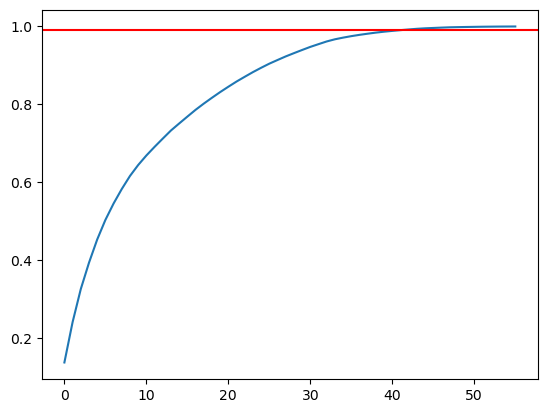

In [341]:
plt.plot(skree_df)
plt.axhline(0.991,color='r')
plt.show()

In [342]:
skree_df[skree_df[0] < .991].index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37, 38, 39, 40, 41],
           dtype='int64')

In [343]:
pca = PCA(n_components=42)
pca_train = pd.DataFrame(pca.fit_transform(X_train[numeric_cols]))
pca_test = pd.DataFrame(pca.transform(X_test[numeric_cols]))

In [344]:
pca_train.columns = ["pc_" + str(i) for i in range(1,43)]
pca_test.columns = ["pc_" + str(i) for i in range(1,43)]

In [345]:
pca_train = pd.concat([pca_train , X_train[missing_indicators]],axis=1)
pca_test = pd.concat([pca_test , X_test[missing_indicators]],axis=1)

In [346]:
pca_train.shape,pca_test.shape

((100518, 55), (14000, 55))

### Random Forest GridSearchCV

In [347]:
rf = RandomForestClassifier()

In [348]:
# folds = KFold(n_splits=5,shuffle=True,random_state=100)
# parameters  = {'n_estimators' : [50,70], 'criterion' : ['gini'],'max_depth' : [30,50,80],'min_samples_split' : [80,90,100,120],'min_samples_leaf' : [30,40,50,60]}
# crval_rf = GridSearchCV(estimator=rf,scoring=['accuracy','precision','recall','roc_auc'],
#              cv=folds,param_grid = parameters,return_train_score=True,verbose=3,refit='recall')

In [349]:
# crval_rf.fit(pca_train,y_train)

In [350]:
# crval_rf.best_params_

Hyperparameters roc score refit: {'criterion': 'gini',
 'max_depth': 50,
 'min_samples_leaf': 30,
 'min_samples_split': 80,
 'n_estimators': 70}

Hyperparameters recall score refit: {'criterion': 'gini',
 'max_depth': 80,
 'min_samples_leaf': 30,
 'min_samples_split': 80,
 'n_estimators': 50}

### ROC Best Params

In [351]:
rf = RandomForestClassifier(criterion = 'gini',
 max_depth= 50,
 min_samples_leaf =  30,
 min_samples_split = 80,
 n_estimators= 70)

In [352]:
rf,probability = Model_Ensemble(rf,X_train,y_train,X_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

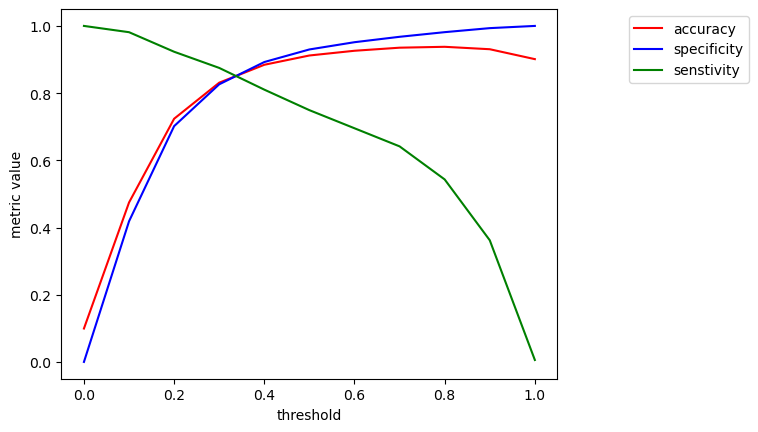

In [353]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

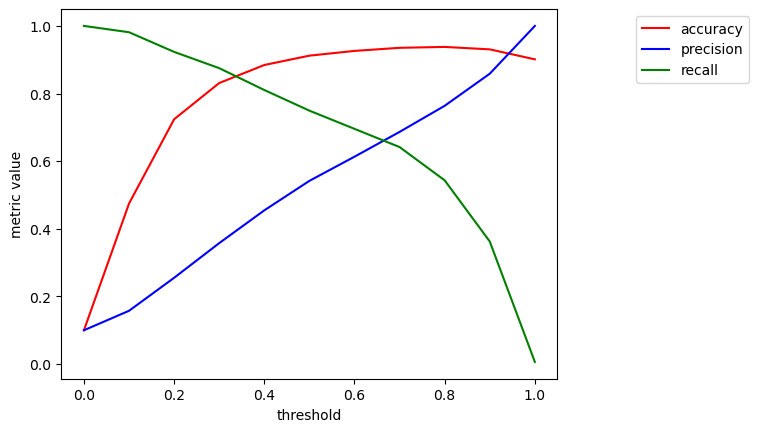

In [354]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [355]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  1043
False Negatives :  349
True Negatives :  11725
False Positives :  883
Accuracy :  0.912
Specificity :  0.9299651015228426
Senstivity :  0.7492816091954023
Precision :  0.5415368639667705
False Positive Rate :  0.07003489847715738


In [356]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.36)

0.36
True Positives :  1162
False Negatives :  230
True Negatives :  10986
False Positives :  1622
Accuracy :  0.8677142857142857
Specificity :  0.8713515228426396
Senstivity :  0.8347701149425287
Precision :  0.41738505747126436
False Positive Rate :  0.12864847715736039


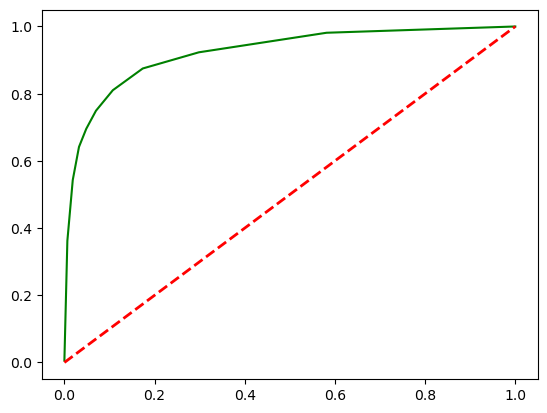

Area Under the Curve : 0.9224415703494224


In [357]:
roc_auc_plot(senstivity_list,specificity_list)

In [358]:
rf,probability = Model_Ensemble(rf,pca_train,y_train,pca_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

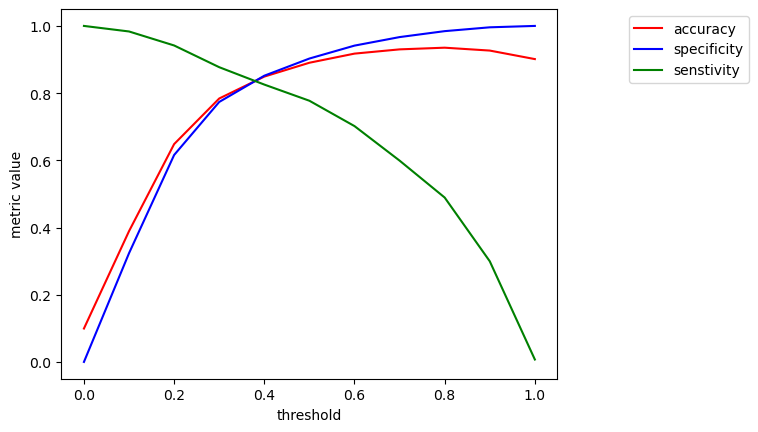

In [359]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

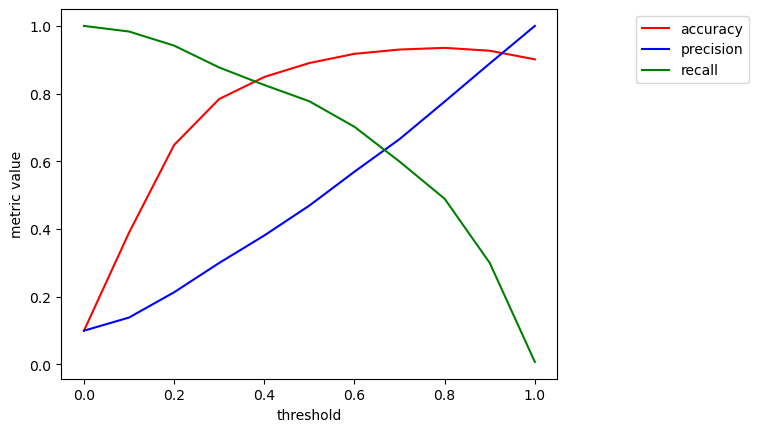

In [360]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [361]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  1082
False Negatives :  310
True Negatives :  11384
False Positives :  1224
Accuracy :  0.8904285714285715
Specificity :  0.9029187817258884
Senstivity :  0.7772988505747126
Precision :  0.4692107545533391
False Positive Rate :  0.09708121827411165


In [362]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.39)

0.39
True Positives :  1152
False Negatives :  240
True Negatives :  10647
False Positives :  1961
Accuracy :  0.8427857142857142
Specificity :  0.8444638324873096
Senstivity :  0.8275862068965517
Precision :  0.37006103437198845
False Positive Rate :  0.1555361675126904


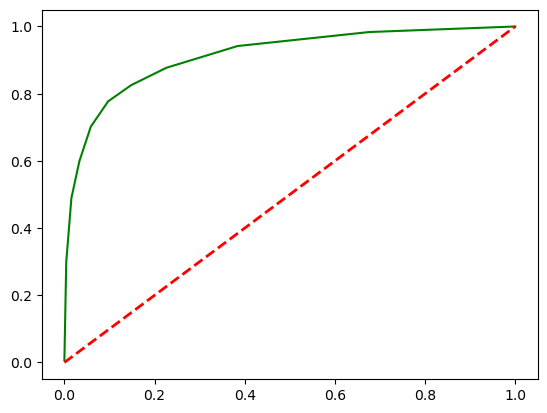

Area Under the Curve : 0.913001067329993


In [363]:
roc_auc_plot(senstivity_list,specificity_list)

### Recall Best Params 

### Choosen Model of Upgrad Submission
- Has aligned Accuracy , Senstivity and Specificity , to reasonable values at threshold .36
- Since the main goal is to predict high value customers that have churned , having a higher recall gives better results
- Roc Curve Score .92

In [364]:
rf = RandomForestClassifier(criterion = 'gini',
 max_depth= 80,
 min_samples_leaf =  30,
 min_samples_split = 80,
 n_estimators= 50)

In [365]:
rf,probability = Model_Ensemble(rf,X_train,y_train,X_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

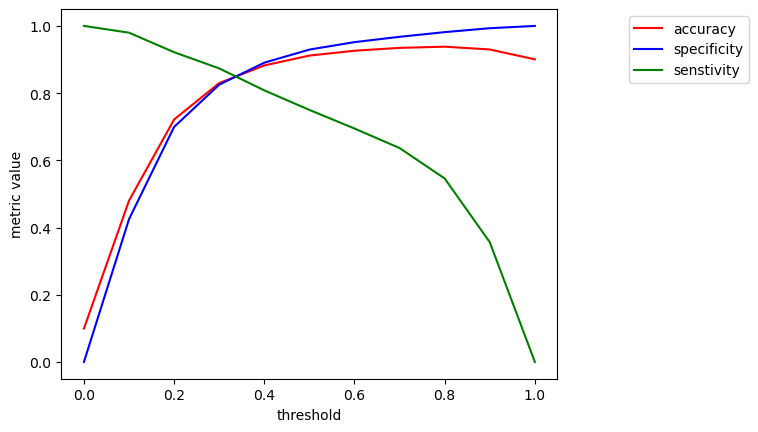

In [366]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

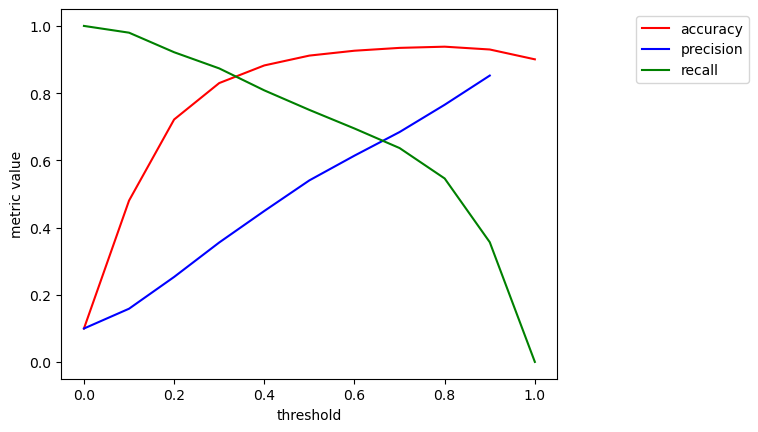

In [367]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [368]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  1044
False Negatives :  348
True Negatives :  11720
False Positives :  888
Accuracy :  0.9117142857142857
Specificity :  0.9295685279187818
Senstivity :  0.75
Precision :  0.5403726708074534
False Positive Rate :  0.07043147208121825


In [369]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.36)

0.36
True Positives :  1169
False Negatives :  223
True Negatives :  10957
False Positives :  1651
Accuracy :  0.8661428571428571
Specificity :  0.8690513959390863
Senstivity :  0.8397988505747126
Precision :  0.4145390070921986
False Positive Rate :  0.1309486040609137


In [370]:
# tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.35)

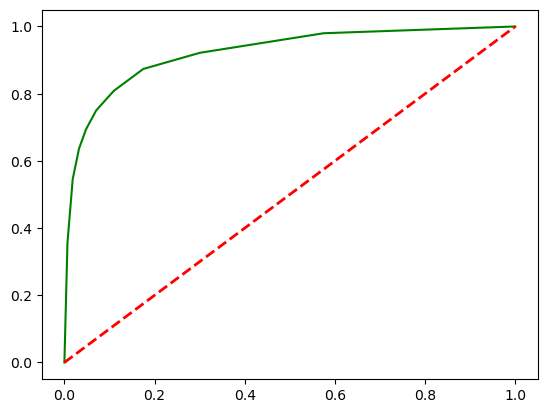

Area Under the Curve : 0.921172876690224


In [371]:
roc_auc_plot(senstivity_list,specificity_list)

In [372]:
rf,probability = Model_Ensemble(rf,pca_train,y_train,pca_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

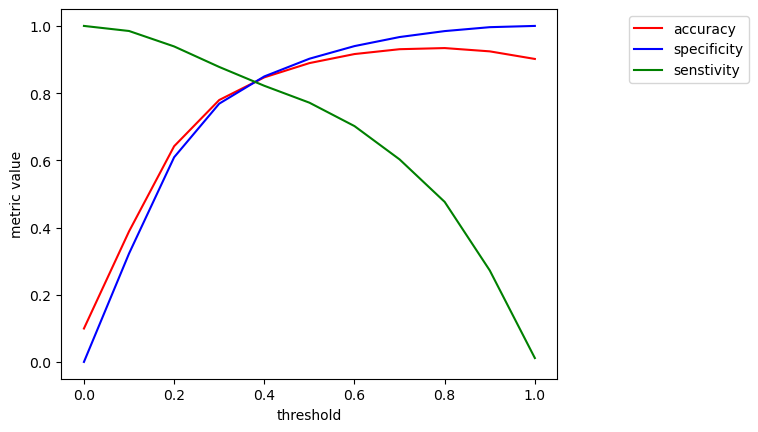

In [373]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

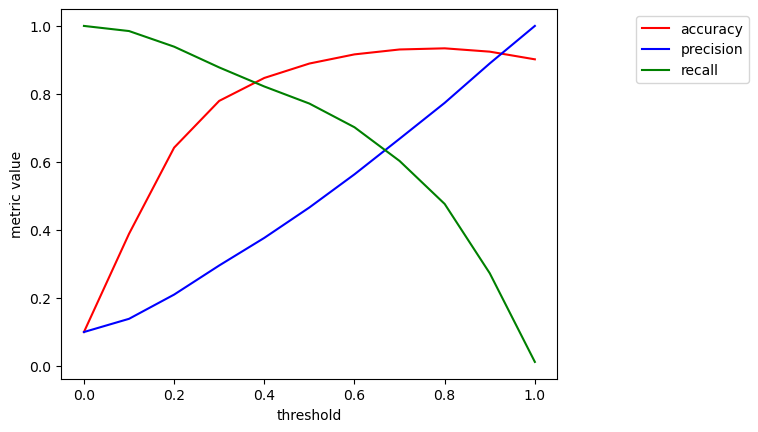

In [374]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [375]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  1074
False Negatives :  318
True Negatives :  11377
False Positives :  1231
Accuracy :  0.8893571428571428
Specificity :  0.902363578680203
Senstivity :  0.771551724137931
Precision :  0.46594360086767894
False Positive Rate :  0.097636421319797


In [376]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.39)

0.39
True Positives :  1149
False Negatives :  243
True Negatives :  10636
False Positives :  1972
Accuracy :  0.8417857142857142
Specificity :  0.8435913705583756
Senstivity :  0.8254310344827587
Precision :  0.3681512335789811
False Positive Rate :  0.15640862944162437


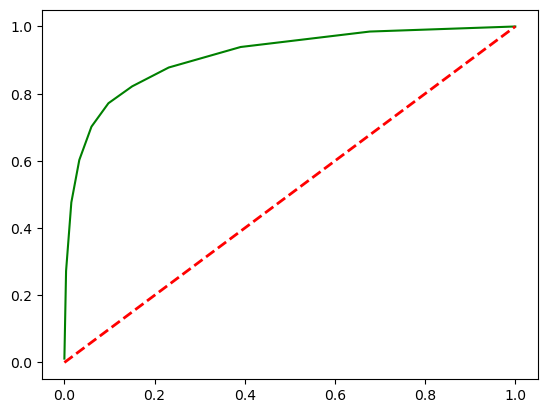

Area Under the Curve : 0.911257254561964


In [377]:
roc_auc_plot(senstivity_list,specificity_list)

### Xgboost GridSearchCV

In [378]:
xgb = XGBClassifier()
folds = KFold(n_splits=5,shuffle=True,random_state=100)
parameters  = {'criterion' : ['binary:logistic'],'gamma' : [0.01,0.1,1,10,100],'eta' : [0.01,0.1,1],'lambda' : [0.01,1,10,100],'scale_pos_weights' : [1, 2, 5, 10, 20, 50, 100]
}
crval_xgb = GridSearchCV(estimator=xgb,scoring=['accuracy','precision','recall','roc_auc'],
             cv=folds,param_grid = parameters,return_train_score=True,verbose=3,refit='roc_auc')

In [379]:
# crval_xgb.fit(X_train,y_train)

In [380]:
# crval_xgb.best_params_

best params intuition based : 0.1,0.1,10,5

 - XGBClassifier Accuracy tuning (criterion = 'binary:logistic' , eta = 1,gamma = 0.1,reg_lambda = 10,scale_pos_weights = 1 )

- XGBClassifier Recall Tuning {'criterion': 'binary:logistic','eta': 1,'gamma': 0.1,'lambda': 10,'scale_pos_weights': 1}

### Accuracy Based Params

### Chosen model for Kaggle Submission - Accuracy Based

- Choosen module for accucary offers highest accuracy currently among all models
- Though the recall is scarificed here , just based on accuracy this is the best model
- Accuracy and Specificity are extremely high in this model
- Also shows the highest precision observed at .7
- ROC Curve Score - 0.85
- Model gives similar results at 0.5 threshold too as seen below 
- Accuracy : 0.925 at .5 threshold and Accuracy : 0.93 at .7 threshold
- The overall best model is the Upgrad Submitted one 
- Choosen 2 thresholds for submission 0.5 and .7

In [381]:
xgb = XGBClassifier(criterion = 'binary:logistic' , eta = 1,
  gamma = 0.1,
  reg_lambda = 10,
  scale_pos_weights = 1 )

In [382]:
xgb,probability = Model_Ensemble(xgb,X_train,y_train,X_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

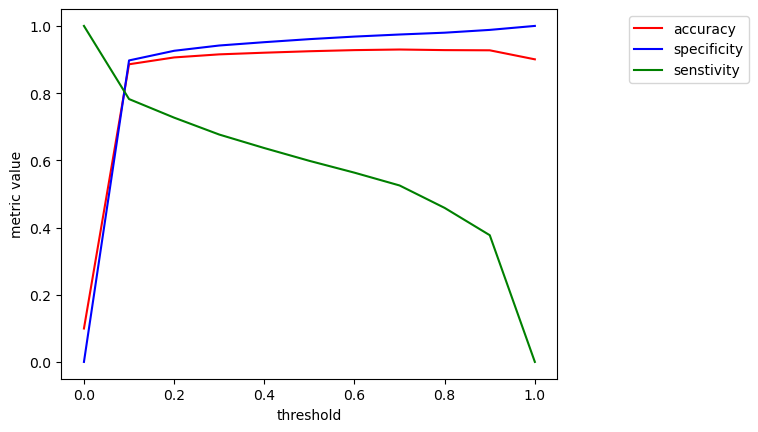

In [383]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

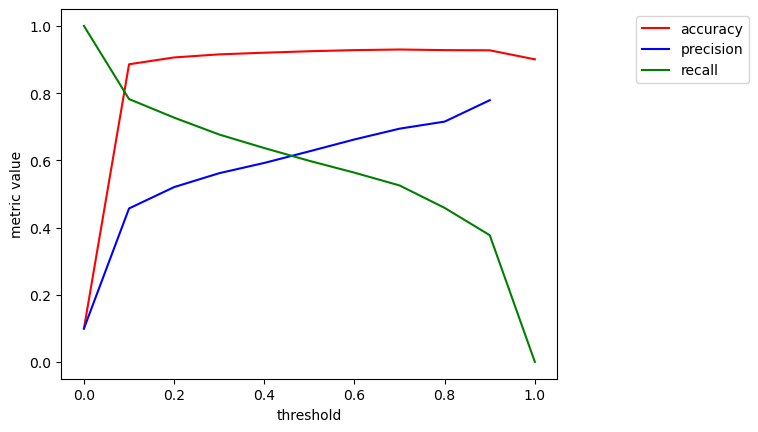

In [384]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [385]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  833
False Negatives :  559
True Negatives :  12112
False Positives :  496
Accuracy :  0.9246428571428571
Specificity :  0.9606598984771574
Senstivity :  0.5984195402298851
Precision :  0.6267870579382995
False Positive Rate :  0.03934010152284262


In [386]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.7)

0.7
True Positives :  731
False Negatives :  661
True Negatives :  12286
False Positives :  322
Accuracy :  0.9297857142857143
Specificity :  0.9744606598984772
Senstivity :  0.5251436781609196
Precision :  0.6942070275403609
False Positive Rate :  0.02553934010152281


In [387]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.1)

0.1
True Positives :  1089
False Negatives :  303
True Negatives :  11313
False Positives :  1295
Accuracy :  0.8858571428571429
Specificity :  0.8972874365482234
Senstivity :  0.7823275862068966
Precision :  0.45679530201342283
False Positive Rate :  0.1027125634517766


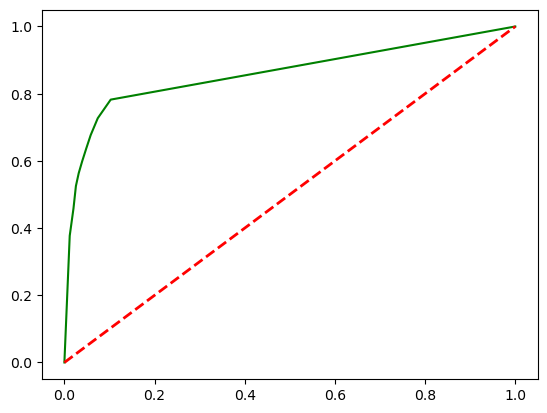

Area Under the Curve : 0.8605620712902592


In [388]:
roc_auc_plot(senstivity_list,specificity_list)

In [389]:
xgb,probability = Model_Ensemble(xgb,pca_train,y_train,pca_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

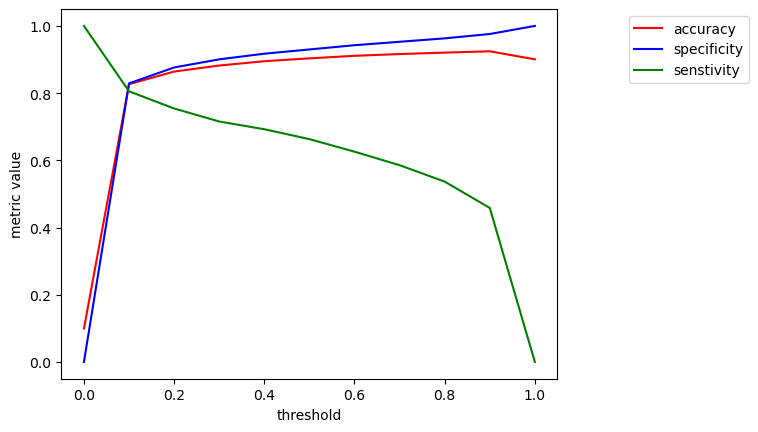

In [390]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

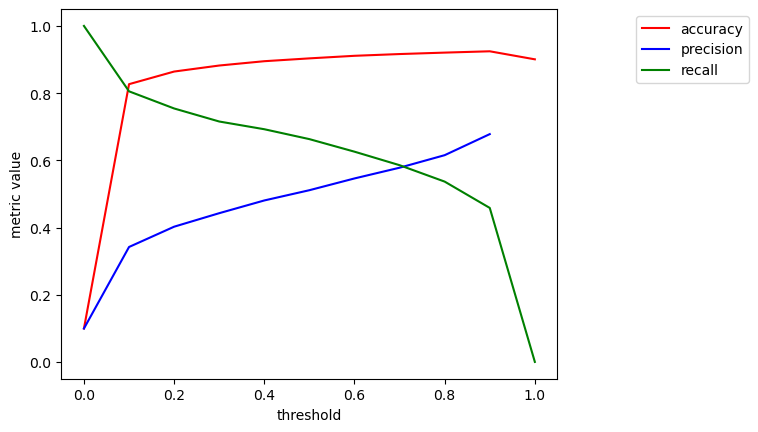

In [391]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [392]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  923
False Negatives :  469
True Negatives :  11725
False Positives :  883
Accuracy :  0.9034285714285715
Specificity :  0.9299651015228426
Senstivity :  0.6630747126436781
Precision :  0.5110741971207088
False Positive Rate :  0.07003489847715738


In [393]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.1)

0.1
True Positives :  1121
False Negatives :  271
True Negatives :  10452
False Positives :  2156
Accuracy :  0.8266428571428571
Specificity :  0.828997461928934
Senstivity :  0.805316091954023
Precision :  0.3420811718034788
False Positive Rate :  0.17100253807106602


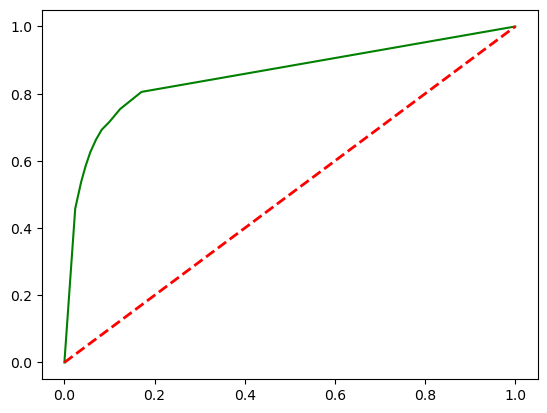

Area Under the Curve : 0.8553874979943403


In [394]:
roc_auc_plot(senstivity_list,specificity_list)

### Recall Based Params

In [395]:
xgb = XGBClassifier(criterion = 'binary:logistic' , eta = 1,
  gamma = 0.1,
  reg_lambda = 100,
  scale_pos_weights = 1 )

In [396]:
xgb,y_pred = Model_Ensemble(xgb,X_train,y_train,X_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

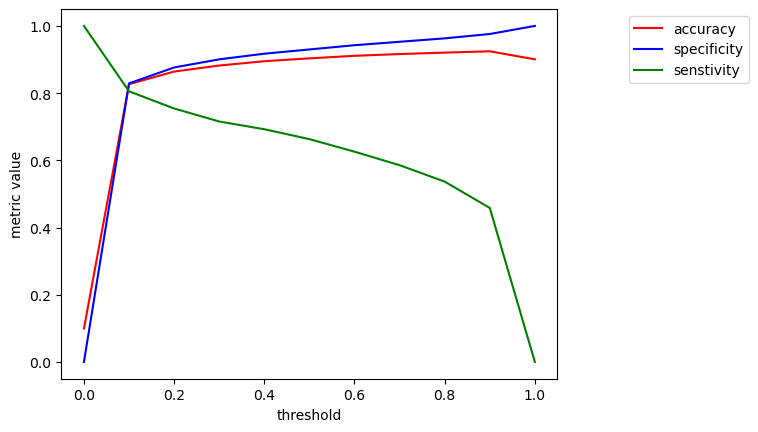

In [397]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

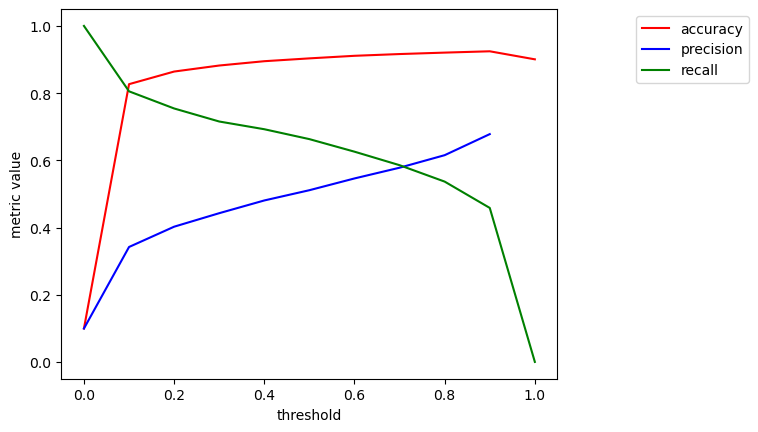

In [398]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

In [399]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  923
False Negatives :  469
True Negatives :  11725
False Positives :  883
Accuracy :  0.9034285714285715
Specificity :  0.9299651015228426
Senstivity :  0.6630747126436781
Precision :  0.5110741971207088
False Positive Rate :  0.07003489847715738


In [400]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.1)

0.1
True Positives :  1121
False Negatives :  271
True Negatives :  10452
False Positives :  2156
Accuracy :  0.8266428571428571
Specificity :  0.828997461928934
Senstivity :  0.805316091954023
Precision :  0.3420811718034788
False Positive Rate :  0.17100253807106602


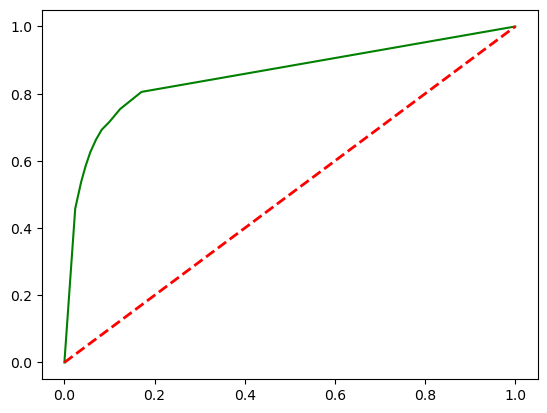

Area Under the Curve : 0.8553874979943403


In [401]:
roc_auc_plot(senstivity_list,specificity_list)

In [402]:
xgb,y_pred = Model_Ensemble(xgb,pca_train,y_train,pca_test)
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)

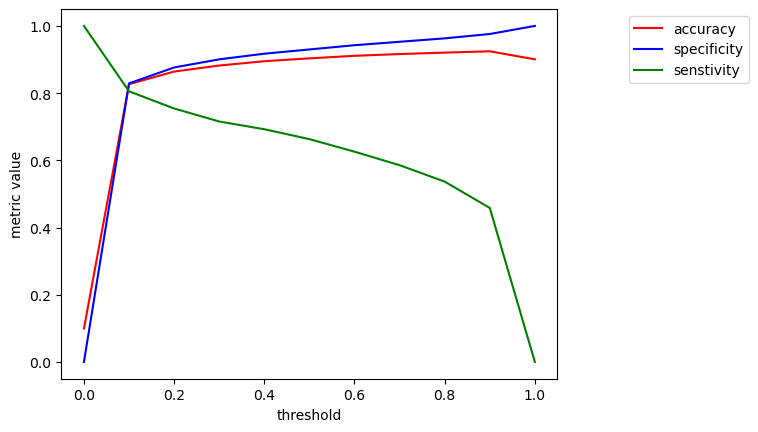

In [403]:
threshold_plot(accuracy_list,specificity_list,senstivity_list,'specificity')

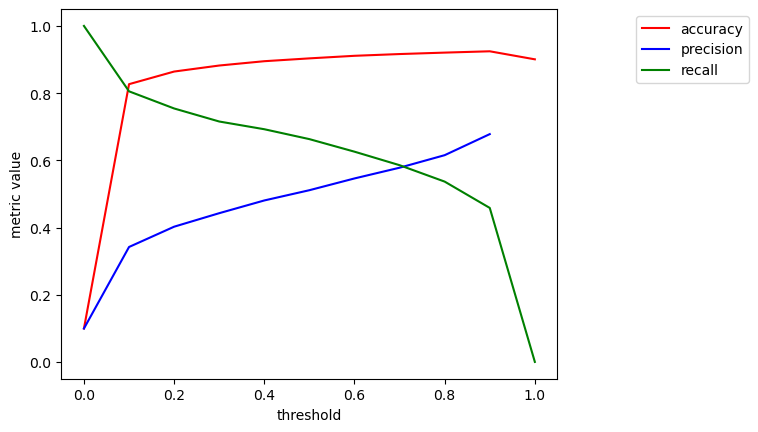

In [404]:
threshold_plot(accuracy_list,precision_list,senstivity_list,'precision')

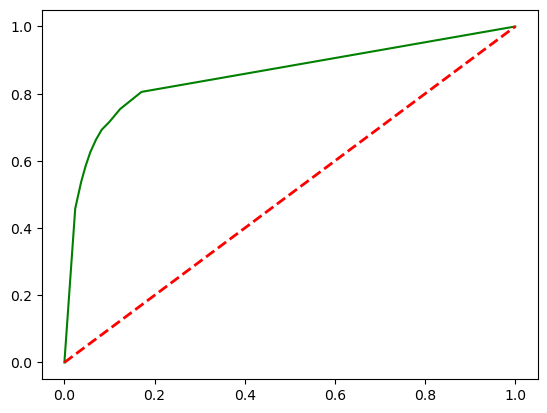

Area Under the Curve : 0.8553874979943403


In [405]:
roc_auc_plot(senstivity_list,specificity_list)

In [406]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.5)

0.5
True Positives :  923
False Negatives :  469
True Negatives :  11725
False Positives :  883
Accuracy :  0.9034285714285715
Specificity :  0.9299651015228426
Senstivity :  0.6630747126436781
Precision :  0.5110741971207088
False Positive Rate :  0.07003489847715738


In [407]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.1)

0.1
True Positives :  1121
False Negatives :  271
True Negatives :  10452
False Positives :  2156
Accuracy :  0.8266428571428571
Specificity :  0.828997461928934
Senstivity :  0.805316091954023
Precision :  0.3420811718034788
False Positive Rate :  0.17100253807106602


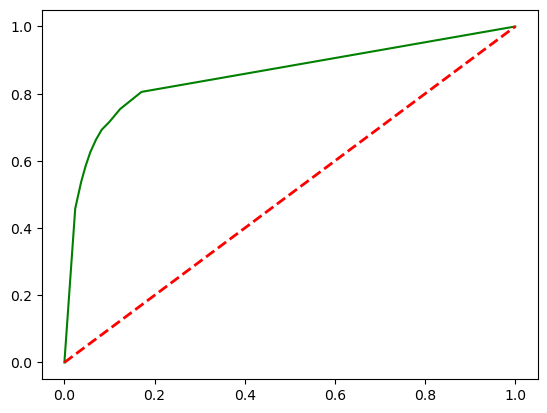

Area Under the Curve : 0.8553874979943403


In [408]:
roc_auc_plot(senstivity_list,specificity_list)

### Note :  for each combination of hyperparameters both the models random forest and xgboost have been trained with and without pca . As a general observation , non-pca(models trained without applying data on pca) trained models seemed to better than models with pca applied data . As a result both the submissions are models without dimensionality reduction , this is likely the case because , the features have been generalized to reduce feature set in EDA ,so that there are fewer features which have better discriminatory power

### Test Data

In [409]:
def test_data() : 
    path = r"C:\Users\srini\Downloads\telecom-churn-case-study-hackathon-c55\test.csv"
    df = pd.read_csv(path)

    df = df.drop(columns = ['circle_id'])

    # og_t2o_mou cols 
    drop_og_t2o_mou = df.columns[df.columns.str.contains(r't2o_mou$')]
    df = df.drop(columns = drop_og_t2o_mou)

    arpu_cols = df.columns[df.columns.str.contains(r'arpu')]
    arpu_cols

    # Create total average revenue per user column , do this monthly
    df['total_arpu_6'] = df['arpu_6'] + df['arpu_3g_6'].fillna(0) + df['arpu_2g_6'].fillna(0)
    df['total_arpu_7'] = df['arpu_7'] + df['arpu_3g_7'].fillna(0) + df['arpu_2g_7'].fillna(0)
    df['total_arpu_8'] = df['arpu_8'] + df['arpu_3g_8'].fillna(0) + df['arpu_2g_8'].fillna(0)

    total_arpu_cols = df.columns[df.columns.str.contains(r'^total_arpu_')]
    total_arpu_cols

    df['total_arpu_monthly'] = df[total_arpu_cols].sum(axis=1) / len(total_arpu_cols)

    total_arpu_cols = df.columns[df.columns.str.contains(r'(^total_arpu_)')]
    total_arpu_cols

    df['arpu_diff_7_6'] = df['total_arpu_7'] - df['total_arpu_6']
    df['arpu_diff_8_7'] = df['total_arpu_8'] - df['total_arpu_7']
    df['arpu_diff_8_6'] = df['total_arpu_8'] - df['total_arpu_6']

    df['total_revenue_per_usr'] = df[['total_arpu_6', 'total_arpu_7', 'total_arpu_8']].sum(axis=1)

    df['arpu_avg_7_6'] = (df['total_arpu_7'] + df['total_arpu_6']) /2 


    df['arpu_phase_drift'] = df['total_arpu_8'] - df['arpu_avg_7_6']

    df = df.drop(['total_arpu_6', 'total_arpu_7', 'total_arpu_8','arpu_diff_8_6'],axis=1)

    df = df.drop(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8',
           'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8'],axis=1)

    mou_cols = df.columns[df.columns.str.contains(r'mou')]
    mou_cols

    df['missing_indicator_mins_per_usg_jun'] = np.where(df['onnet_mou_6'].isnull(),1,0)
    df['missing_indicator_mins_per_usg_jul'] = np.where(df['onnet_mou_7'].isnull(),1,0)
    df['missing_indicator_mins_per_usg_aug'] = np.where(df['onnet_mou_8'].isnull(),1,0)

    # Now that there is a missing value indicator fill null values with zero
    df[mou_cols] = df[mou_cols].fillna(0)

    onnet_mou_cols = df.columns[df.columns.str.contains(r"^onnet_mou")]
    offnet_mou_cols = df.columns[df.columns.str.contains(r"^offnet_mou")]

    df['offnet_mou_diff_7_6']= df['offnet_mou_7'] - df['offnet_mou_6']
    df['offnet_mou_diff_8_7'] = df['offnet_mou_8'] - df['offnet_mou_7']

    df['onnet_mou_diff_7_6']= df['onnet_mou_7'] - df['onnet_mou_6']
    df['onnet_mou_diff_8_7'] = df['onnet_mou_8'] - df['onnet_mou_7']

    df['offnet_mou_phase_drift'] = df['offnet_mou_8'] - ((df['offnet_mou_7'] + df['offnet_mou_6']) /2)

    df['onnet_mou_phase_drift'] = df['onnet_mou_8'] - ((df['onnet_mou_7'] + df['onnet_mou_6']) /2)

    df['onnet_mou_monthly'] = df[onnet_mou_cols].sum(axis=1) / len(onnet_mou_cols)
    df['offnet_mou_monthly'] = df[offnet_mou_cols].sum(axis=1) / len(offnet_mou_cols)

    df = df.drop(columns = list(onnet_mou_cols)+list(offnet_mou_cols))

    roam_mou_cols = df.columns[df.columns.str.contains(r"^roam[a-zA-Z_]+mou_[0-9]$")]
    roam_mou_cols

    roam_mou_6 = [i for i in roam_mou_cols if re.search(r"ic|og",i) and re.search(r"6",i)]
    roam_mou_7 = [i for i in roam_mou_cols if re.search(r"ic|og",i) and re.search(r"7",i)]
    roam_mou_8 = [i for i in roam_mou_cols if re.search(r"ic|og",i) and re.search(r"8",i)]
    df['roam_mou_6'] = df[roam_mou_6].sum(axis=1)
    df['roam_mou_7'] = df[roam_mou_7].sum(axis=1)
    df['roam_mou_8'] = df[roam_mou_8].sum(axis=1)

    roam_mou = [i for i in df.columns if re.search(r"^roam_mou_[6-8]$",i)]
    df['roam_mou_monthly'] = df[roam_mou].sum(axis=1) / len(df)

    mou_6 = [i for i in roam_mou_cols if re.search(r'6$',i)]
    mou_7 = [i for i in roam_mou_cols if re.search(r'7$',i)]
    mou_8 = [i for i in roam_mou_cols if re.search(r'8$',i)]


    df['roam_diff_7_6'] = df[mou_7].sum(axis=1) - df[mou_6].sum(axis=1)
    df['roam_diff_8_7'] = df[mou_8].sum(axis=1) - df[mou_7].sum(axis=1)

    df['roam_phase_drift'] = df[mou_8].sum(axis=1) - ((df[mou_7].sum(axis=1) + df[mou_6].sum(axis=1))/2)

    df = df.drop(columns =[i for i in df.columns if re.search(r'roam',i)] )

    def transform_drop_cols(df,loc) : 
        drop_t2_cols = [i for i in df.columns if re.search(r"^{0}_(og|ic)_[a-zA-Z0-9_]+mou_[6-8]$".format(loc),i)]
        df = df.drop(drop_t2_cols,axis=1)

        loc_ig_og = [i for i in df.columns if re.search(r'{0}'.format(loc),i)]
        def extract_num(x) : 
            return x.split('_')[-1]
        mnth_lst = list(set(map(extract_num,loc_ig_og)))

        l = []
        for i in mnth_lst : 
            l.append([col for col in loc_ig_og if re.search(r"{0}_(og|ic)[a-z_]+{1}".format(loc,i),col)])
    #         print(l)
        for m,c in zip(mnth_lst,l) : 
            df[f'{loc}_mou_{m}'] = df[c].sum(axis=1)
    #     df = df.drop(loc_ig_og,axis=1)
        return df,loc_ig_og

    df2 ,loc_ig_og= transform_drop_cols(df.copy(),'loc')
    df2,std_ig_og = transform_drop_cols(df2,'std')
    df2,spl_ig_og = transform_drop_cols(df2,'spl')
    df2,isd_ig_og = transform_drop_cols(df2,'isd')
    df = df2

    mou_cols = [loc_ig_og,
    std_ig_og ,
    spl_ig_og,
    isd_ig_og]

    diff_cols_mou_7_6 = []
    diff_cols_mou_8_7 = []
    phase_drift_mou = []
    def mou_diff_cols(df,mou_cols) :
        prefix = mou_cols[0].split('_')[0]
        mou_6 = [i for i in mou_cols if re.search(r'6$',i)]
        mou_7 = [i for i in mou_cols if re.search(r'7$',i)]
        mou_8 = [i for i in mou_cols if re.search(r'8$',i)]
        df[f'{prefix}_mou_diff_7_6'] = df[mou_7].sum(axis=1) - df[mou_6].sum(axis=1)
        df[f'{prefix}_mou_diff_8_7'] = df[mou_8].sum(axis=1) - df[mou_7].sum(axis=1)
        df[f'{prefix}_mou_phase_drift'] = df[mou_8].sum(axis=1) - ((df[mou_7].sum(axis=1) + df[mou_6].sum(axis=1))/2)
        diff_cols_mou_7_6.append(prefix)
        diff_cols_mou_8_7.append(prefix)
        phase_drift_mou.append(prefix)
        return df

    for cols in mou_cols : 
        df = mou_diff_cols(df,cols)

    diff_cols_mou_7_6 = list(map(lambda x : x + "_mou_diff_7_6" ,diff_cols_mou_7_6))

    diff_cols_mou_8_7 = list(map(lambda x : x + "_mou_diff_8_7" ,diff_cols_mou_8_7))

    loc_cols = df.columns[df.columns.str.contains(r"^loc")]
    df['loc_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

    loc_cols = df.columns[df.columns.str.contains(r"^std")]
    df['std_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

    loc_cols = df.columns[df.columns.str.contains(r"^isd")]
    df['isd_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

    loc_cols = df.columns[df.columns.str.contains(r"^spl")]
    df['spl_mou_monthly'] = df[loc_cols].sum(axis=1) / len(loc_cols)

    mou_monthly_list = df.columns[df.columns.str.contains('_mou_monthly')]


    phase_drift_mou = list(map(lambda x : x + "_mou_phase_drift" ,phase_drift_mou))

    mou_cols = [i for i in df.columns if re.search(r'mou',i)]

    drop_mou = [i for i in  mou_cols if not re.search(r'(mou_monthly$|diff|phase_drift$)',i)]

    drop_date = [i for i in df.columns if re.search(r'^last_date_of_month',i)]
    df = df.drop(drop_date,axis=1)

    total_ic_og  = df.columns[df.columns.str.contains(r'total_(ic|og)_mou')]

    total_ig = [i for i in total_ic_og if re.search(r'ic',i)]
    total_og = [i for i in total_ic_og if re.search(r'og',i)]

    drop_mou = np.setdiff1d(drop_mou,total_ic_og)

    mou_6 = df.columns[df.columns.str.contains(r'^total_(og|ic)_mou_6$')]
    df['total_mou_6'] = df[mou_6].sum(axis=1)
    mou_7 = df.columns[df.columns.str.contains(r'^total_(og|ic)_mou_7$')]
    df['total_mou_7'] = df[mou_7].sum(axis=1)
    mou_8 = df.columns[df.columns.str.contains(r'^total_(og|ic)_mou_8$')]
    df['total_mou_8'] = df[mou_8].sum(axis=1)

    total_mou = df.columns[df.columns.str.contains(r"total_mou_[6-8]$")]
    total_mou

    df['total_incoming_mins_usg_per_usr'] = df[total_ig].sum(axis=1)
    df['total_outgoing_mins_usg_per_usr'] = df[total_og].sum(axis=1)
    df['total_mins_usg_per_usr'] = df[total_mou].sum(axis=1)

    df = df.drop(total_ic_og,axis=1)

    df = df.drop(drop_mou,axis=1)

    df['total_mou_diff_7_6'] = df['total_mou_7'] - df['total_mou_6']
    df['total_mou_diff_8_7'] = df['total_mou_8'] - df['total_mou_7']

    df['total_mou_phase_drift'] = df['total_mou_8'] - ((df['total_mou_7'] + df['total_mou_6'])/2)

    df['total_mou_monthly'] = df[total_mou].sum(axis=1)

    df = df.drop(total_mou,axis=1)

    mou_cols = [i for i in df.columns if re.search(r'mou',i)]
    mou_cols

    recharge_cols = df.columns[df.columns.str.contains(r"rech")]
    recharge_cols

    rech_num_amt = [i for i in recharge_cols if re.search(r"total_rech_(num|amt)",i)]
    rech_num_amt

    df['amt_per_recharge_6'] = df['total_rech_amt_6'] / df['total_rech_num_6']
    df['amt_per_recharge_7'] = df['total_rech_amt_7'] / df['total_rech_num_7']
    df['amt_per_recharge_8'] = df['total_rech_amt_8'] / df['total_rech_num_8']

    amt_per_recharge_mnth = [i for i in df.columns if re.search(r'amt_per_recharge_[6-8]$',i)]

    df[amt_per_recharge_mnth] = df[amt_per_recharge_mnth].fillna(0)

    df['amt_per_recharge_diff_7_6'] = df['amt_per_recharge_7'] - df['amt_per_recharge_6']
    df['amt_per_recharge_diff_8_7'] = df['amt_per_recharge_8'] - df['amt_per_recharge_7']

    df['amt_per_recharge_phase_drift'] = df['amt_per_recharge_8'] - ((df['amt_per_recharge_7'] + df['amt_per_recharge_6'])/2)

    df['total_rech_num_monthly'] = df.loc[:,rech_num_amt[:3]].sum(axis=1)
    df['total_rech_amt_monthly'] = df.loc[:,rech_num_amt[3:]].sum(axis=1)

    df['amt_per_recharge_monthly'] = df['total_rech_amt_monthly'] / df['total_rech_num_monthly'] 

    df['amt_per_recharge_monthly'] = df['amt_per_recharge_monthly'].fillna(0)

    df['total_recharge_amount_per_usr'] = df['total_rech_amt_monthly'] 
    df['total_recharge_freq_per_usr'] = df['total_rech_num_monthly'] 


    df = df.drop(['total_rech_amt_monthly','total_rech_num_monthly','total_rech_num_6',
     'total_rech_num_7',
     'total_rech_num_8',
     'total_rech_amt_6',
     'total_rech_amt_7',
     'total_rech_amt_8','amt_per_recharge_6', 'amt_per_recharge_7', 'amt_per_recharge_8'],axis=1)

    date_rech = df.columns[df.columns.str.contains(r"date_of_last_rech_\d{1}")]
    date_rech

    for i in date_rech :
        df[i] = pd.to_datetime(df[i],format="%m/%d/%Y")

    recharge_duration=['prev_recharge_duration','next_recharge_duration']
    df[recharge_duration] = df[date_rech].diff(axis=1).iloc[:,1:]

    df = df.drop(columns = date_rech)

    df[recharge_duration] = df[recharge_duration].apply(lambda x : x.dt.days)

    df['prev_recharge_duration'] = df['prev_recharge_duration'].fillna(0)
    df['next_recharge_duration'] = df['next_recharge_duration'].fillna(0)

    max_rech_cols = [i for i in recharge_cols if re.search(r"max_rech",i)]
    print(max_rech_cols)
    df = df.drop(columns=max_rech_cols)

    df = df.drop(['last_day_rch_amt_6',
           'last_day_rch_amt_7', 'last_day_rch_amt_8'],axis=1)

    date_data_rech = df.columns[df.columns.str.contains(r"date_of_last_rech_data_\d{1}")]
    date_data_rech 

    df = df.drop(date_data_rech,axis=1)

    rech_data =  [i for i in recharge_cols if re.search(r"total_rech_data",i)]
    rech_data

    count_rech_data = [i for i in df.columns if re.search(r'^count_rech_[2-3]g',i)]
    count_rech_data

    avg_rech_data = [i for i in df.columns if re.search(r'^av_rech_amt',i)]
    avg_rech_data

    df[avg_rech_data] = df[avg_rech_data].fillna(0)
    df[rech_data] = df[rech_data].fillna(0)

    df = df.drop(columns=['count_rech_2g_6', 'count_rech_2g_7',
           'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
           'count_rech_3g_8'])

    df['data_per_recharge_monthly'] = (df[avg_rech_data].fillna(0).sum(axis=1) / df[rech_data].fillna(0).sum(axis=1)).fillna(0)

    for amt,freq in zip(avg_rech_data,rech_data) : 
         df[f'data_per_recharge_'+ amt.split('_')[-1]] = df[amt] / df[freq]

    data_per_recharge  = [i for i in df.columns if re.search(r"data_per_recharge_[6-8]?",i)]
    data_per_recharge

    df['data_per_recharge_diff_7_6'] = df['data_per_recharge_7'].fillna(0) - df['data_per_recharge_6'].fillna(0)
    df['data_per_recharge_diff_8_7'] = df['data_per_recharge_8'].fillna(0) - df['data_per_recharge_7'].fillna(0)

    df['data_per_recharge_phase_drift'] = df['data_per_recharge_8'].fillna(0) - ((df['data_per_recharge_7'].fillna(0) + df['data_per_recharge_6'].fillna(0))/2)

    data_drop = avg_rech_data+rech_data
    data_drop

    df = df.drop(columns = data_drop)

    df = df.drop(columns= ['og_others_6', 'og_others_7', 'og_others_8', 'ic_others_6',
           'ic_others_7', 'ic_others_8'])

    df = df.drop( ['data_per_recharge_6',
     'data_per_recharge_7',
     'data_per_recharge_8'],axis=1)

    vol_cols = [i for i in df.columns if re.search(r"vol_",i)]
    vol_cols

    order_list = []
    for j in [6,7,8] : 
        order_list.append([i for i in vol_cols if re.search(r'vol_[2-3]g_mb_{}'.format(j),i)])
    order_list

    for i,j in zip(order_list,[6,7,8]) : 
        df['vol_mb_{}'.format(j)] = df[i].sum(axis=1)

    df = df.drop(vol_cols,axis=1)

    vol_cols = [i for i in df.columns if re.search(r"vol_",i)]
    vol_cols

    df['vol_mb_diff_7_6'] = df['vol_mb_7'] - df['vol_mb_6']
    df['vol_mb_diff_8_7'] = df['vol_mb_8'] - df['vol_mb_7']


    df['vol_mb_phase_drift'] = df['vol_mb_8']  - ((df['vol_mb_7'] + df['vol_mb_6'])/2)

    df['vol_mb_monthly'] = df[vol_cols].sum(axis=1) / len(vol_cols)

    df['mobile_data_usg_per_usr'] = df[vol_cols].sum(axis=1)

    df = df.drop(vol_cols,axis=1)

    ### Monthly Schemes

    monthly_schemes = df.columns[df.columns.str.contains(r"^monthly")]
    {i:df[i].unique() for i in monthly_schemes}

    monthly_6 = [i for i in monthly_schemes if re.search(r"_6$",i)]
    monthly_7 = [i for i in monthly_schemes if re.search(r"_7$",i)]
    monthly_8 = [i for i in monthly_schemes if re.search(r"_8$",i)]

    df['monthly_6'] = df[monthly_6].sum(axis=1)
    df['monthly_7'] = df[monthly_7].sum(axis=1)
    df['monthly_8'] = df[monthly_8].sum(axis=1)

    df = df.drop(monthly_6 + monthly_7 + monthly_8,axis=1)

    monthly_schemes = df.columns[df.columns.str.contains(r"^monthly")]
    monthly_schemes

    df['total_monthly_schemes_per_usr'] = df[monthly_schemes].sum(axis=1) 

    ### Sachet Schemes

    sachet_schemes = df.columns[df.columns.str.contains(r"^sachet")]
    {i:df[i].unique() for i in sachet_schemes}

    sachet_6 = [i for i in sachet_schemes if re.search(r"_6$",i)]
    sachet_7 = [i for i in sachet_schemes if re.search(r"_7$",i)]
    sachet_8 = [i for i in sachet_schemes if re.search(r"_8$",i)]

    df['sachet_6'] = df[sachet_6].sum(axis=1)
    df['sachet_7'] = df[sachet_7].sum(axis=1)
    df['sachet_8'] = df[sachet_8].sum(axis=1)

    df = df.drop(sachet_6 + sachet_7 + sachet_8,axis=1)
    sachet_schemes = df.columns[df.columns.str.contains(r"^sachet")]
    sachet_schemes

    df['total_sachet_schemes_per_usr'] = df[sachet_schemes].sum(axis=1) 

    binary_schemes = df.columns[df.columns.str.contains(r"^(fb|night)")]
    {i:df[i].unique() for i in binary_schemes}

    df['missing_indicator_mobile_data_jun'] = np.where(df['night_pck_user_6'].isnull(),1,0)
    df['missing_indicator_mobile_data_jul'] = np.where(df['night_pck_user_7'].isnull(),1,0)
    df['missing_indicator_mobile_data_aug'] = np.where(df['night_pck_user_8'].isnull(),1,0)

    df[binary_schemes] = df[binary_schemes].fillna(0)

    vbc_monthly = ['aug_vbc_3g',
           'jul_vbc_3g', 'jun_vbc_3g']
    df['total_vbc_per_usr'] = df[vbc_monthly].sum(axis=1)
    df['vbc_monthly'] = df['total_vbc_per_usr'] / len(vbc_monthly)

    df['vbc_diff_7_6'] = df['jul_vbc_3g'] - df['jun_vbc_3g']
    df['vbc_diff_8_7'] = df['aug_vbc_3g'] - df['jul_vbc_3g']

    df = df.drop(columns=['aug_vbc_3g',
           'jul_vbc_3g', 'jun_vbc_3g'])

    monthly_cols = [i for i in df.columns if re.search(r'monthly$',i)]
    diff_cols = [i for i in df.columns if re.search(r'diff',i)]
    per_usr = [i for i in df.columns if re.search(r'_per_usr$',i)]
    phase_cols = [i for i in df.columns if re.search(r'_phase_drift$',i)]

    per_usr = [i for i in per_usr if i not in ['total_monthly_schemes_per_usr',
     'total_sachet_schemes_per_usr']]
    per_usr

    cat_cols = ['monthly_6', 'monthly_7', 'monthly_8',
           'total_monthly_schemes_per_usr', 'sachet_6', 'sachet_7', 'sachet_8',
           'total_sachet_schemes_per_usr']

    per_usr = [i for i in df.columns if re.search(r'_per_usr$',i)]
    per_usr

    for i in per_usr : 
        ext = re.sub(r'(total_|_per_usr)','',i)
        df[ext + '_rate'] = df[i] / df['aon']



    df = df.drop(per_usr,axis=1)

    rate_cols = [i for i in df.columns if re.search(r'_rate$',i)]
    rate_cols

    df['total_mins_incoming_outgoing'] = df['incoming_mins_usg_rate'] + df['incoming_mins_usg_rate']

    # It seems the rate cols are not of much use drop them 
    df = df.drop(columns = rate_cols,axis=1)

    cat_cols = [i for i in cat_cols if not i in ['total_monthly_schemes_per_usr','total_sachet_schemes_per_usr'] ]

    df['high_value_customer']= np.where(df['total_arpu_monthly'].between(arpu_l,arpu_r) & df['amt_per_recharge_monthly'].between(rech_l,rech_r),1,0)

    df = df.drop(columns = 'arpu_avg_7_6')
    
    return df.reset_index(drop=True)

In [410]:
df_test = test_data()
high_value_customer2 = df_test.pop('high_value_customer')
idc2 = df_test.pop('id')
idc2 = idc2.reset_index(drop=True)
high_value_customer2 = high_value_customer2.reset_index(drop=True)

missing_indicators = [i for i in df_test.columns if re.search(r'^(missing_indicator|night|fb|total_mins)',i)]
numeric_cols = np.setdiff1d(df_test.columns,missing_indicators)
df_test = df_test.reset_index(drop=True)
df_test_cat = df_test[missing_indicators]
df_test = df_test[numeric_cols]
df_test2 = scaler.transform(df_test)
df_test = pd.DataFrame(df_test2,columns=df_test.columns)
df_test = pd.concat([df_test,df_test_cat],axis=1)
# pca_test2 = pd.DataFrame(pca.transform(df_test[numeric_cols]))
# pca_test2.columns = ["pc_" + str(i) for i in range(1,43)]
# pca_test2 = pd.concat([pca_test2 , df_test[missing_indicators]],axis=1)

['max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8']


### Kaggle Final Submission - Accuracy Based (Solely focuses on accuracy) , not the overall best model
- Kaggle Submission is based on accuracy
- Since that is the only metric evaluated there
- This model solely focuses on accuracy while ignoring recall 

In [411]:

xgb = XGBClassifier(criterion = 'binary:logistic' , eta = 1,
  gamma = 0.1,
  reg_lambda = 10,
  scale_pos_weights = 1 )
xgb,probability = Model_Ensemble(xgb,X_train,y_train,X_test)
# X_train = pd.concat([X_train,X_test])
# y_train = pd.concat([y_train,y_test])

In [412]:
proba = xgb.predict_proba(df_test)[:,1]
y_pred = pd.Series(proba).apply(lambda x : 1 if x>=0.7 else 0)

In [413]:
final_test = pd.concat([idc2,y_pred],axis=1)

In [414]:
final_test.columns = ['id','churn_probability']

In [415]:
final_test.to_csv('submission_kaggle.csv',index=False)

### Upgrad Final Submission - Overall Best Model (Higher Metrics across the board)
- The Objective here is to predict the high value customers who churn , the recall in this model is the highest so far 
- This model makes sure that all the metrics involved are balanced
- At threshold .36 we can see the best balance when recall is high 

In [416]:
rf = RandomForestClassifier(criterion = 'gini',
 max_depth= 80,
 min_samples_leaf =  30,
 min_samples_split = 80,
 n_estimators= 50)
rf,probability = Model_Ensemble(rf,X_train,y_train,X_test)

### Test Data Submission (unseen)

In [417]:
proba = rf.predict_proba(df_test)[:,1]
y_pred = pd.Series(proba).apply(lambda x : 1 if x>=0.36 else 0)


In [418]:
final_test = pd.concat([idc2,y_pred],axis=1)

In [419]:
final_test.columns = ['id','churn_probability']

In [420]:
final_test.to_csv('submission.csv')

### This is unseen data too but was taken from the train test split of the training data
- The metrics are present above too , also printed here just for better view

In [421]:
tn,fn,fp,tp,accuracy,precision,specificity,senstivity,fpr,y_pred = classification_metrics(y_test,probability,.36)

0.36
True Positives :  1154
False Negatives :  238
True Negatives :  10964
False Positives :  1644
Accuracy :  0.8655714285714285
Specificity :  0.8696065989847716
Senstivity :  0.8290229885057471
Precision :  0.4124374553252323
False Positive Rate :  0.13039340101522845


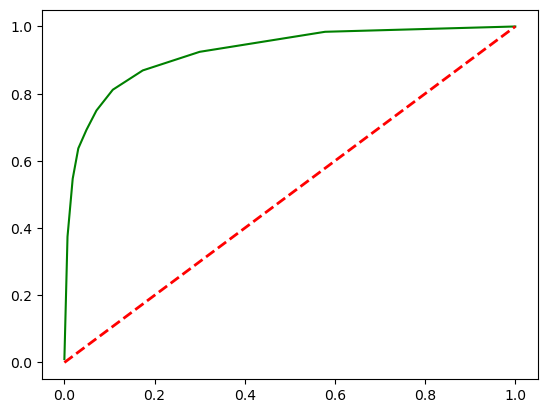

Area Under the Curve : 0.9233192743432377


In [422]:
accuracy_list,specificity_list,senstivity_list,precision_list = threshold_lists(y_test,probability)
roc_auc_plot(senstivity_list,specificity_list)

### Feature Importance of Upgrad Submission

In [423]:
fimp = pd.Series(dict(zip(X_train.columns,rf.feature_importances_))).sort_values(ascending=False)

In [424]:
fimp = fimp[fimp.cumsum().diff()[(fimp.cumsum().diff() > .01) |(fimp.cumsum().diff().isnull()) ].index]

In [425]:
fimp

loc_mou_monthly                       0.122871
amt_per_recharge_phase_drift          0.101604
loc_mou_diff_8_7                      0.064649
loc_mou_phase_drift                   0.052577
total_mou_phase_drift                 0.048107
std_mou_diff_8_7                      0.045806
arpu_phase_drift                      0.043228
total_mou_diff_8_7                    0.037678
std_mou_phase_drift                   0.036919
fb_user_8                             0.036550
total_mou_monthly                     0.028975
next_recharge_duration                0.027800
missing_indicator_mins_per_usg_aug    0.023024
total_mins_incoming_outgoing          0.020473
amt_per_recharge_diff_8_7             0.020029
arpu_diff_8_7                         0.018055
onnet_mou_diff_8_7                    0.016860
onnet_mou_phase_drift                 0.015519
offnet_mou_phase_drift                0.014631
spl_mou_phase_drift                   0.014077
offnet_mou_diff_8_7                   0.013333
spl_mou_diff_

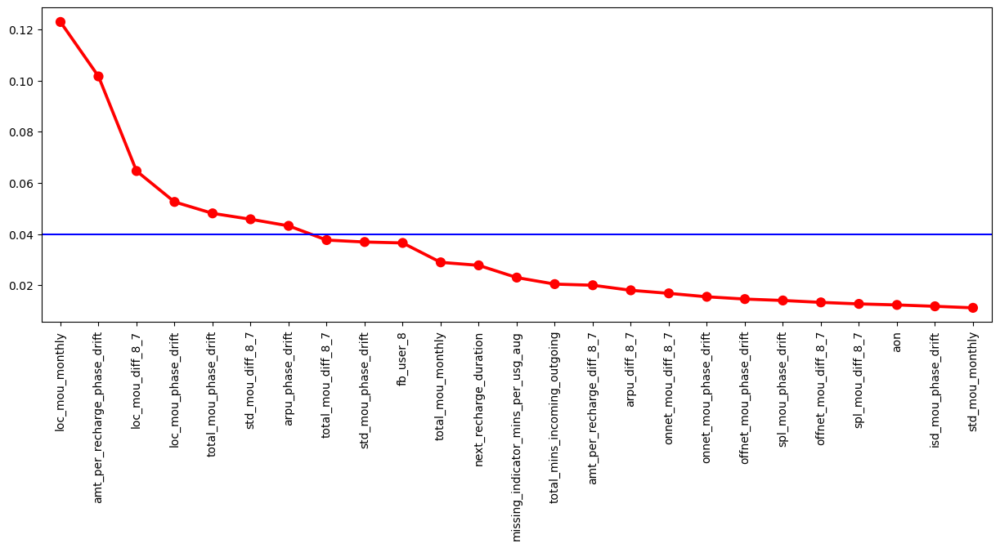

In [426]:
plt.figure(figsize=(15,5))
sns.pointplot(x=fimp.index,y=fimp,color='r')
plt.xticks(rotation=90)
plt.axhline(0.04,color='b')
plt.show()

### Important Variables for prediction 
- loc_mou_monthly
- loc_mou_diff_8_7
- loc_mou_phase_drift
- amnt_per_recharge_phase_drift
- total_mou_phase_drift
- std_mou_diff_8_7
- arpu_phase_drift
#### During EDA it was observed that loc_mou , arpu_phase_drift , amt_per_recharge_phase_drift had high discriminatory powers and it also makes sense intuitively

### Suggestions to Minimize churn
- Sudden drop in minutes of usage (mou) , amount per recharge or arpu of the customer might mean that they have a strong chance  to churn 
- It might be that the price is high or don't they like the current packs or schemes
- Customers that drastically decrease their mou or recharge amount between the months is a clear indication that they are dissatisfied with the service , so sending feedback forms and improving in areas they are dissatisfied with might be a good practice 
- Pay special attention to the customers identified by the Feature high_value_customer(Derived Feature) in the code . Using the high value customer (1 if customer is high value) the churn customers can be prioritized and specialized measures can be taken regarding these customers